In [6]:
import pandas as pd
from pandas import DataFrame
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import datetime
import pycountry_convert as pc

In [790]:
# Import Databases

# Import Our World in Data latest database
mf_original = pd.read_csv('https://covid.ourworldindata.org/data/owid-covid-data.csv')
mf = mf_original
mf.to_csv('owid-covid-data.csv') #Save file locally

# Import 0xCGRT latest database
df_original = pd.read_csv('https://github.com/OxCGRT/covid-policy-tracker/raw/master/data/OxCGRT_latest.csv')
df = df_original
#Save file locally
df.to_csv('OxCGRT_latest.csv') #Save file locally


# Import Google latest database
gf_original = pd.read_csv('https://www.gstatic.com/covid19/mobility/Global_Mobility_Report.csv')
gf = gf_original
#Save file locally
df.to_csv('Global_Mobility_Report.csv') #Save file locally

# Change column names to match mf
df = df.rename(columns = {'CountryName' : 'location', 'Date' : 'date', 'ConfirmedCases': 'total_cases', 'ConfirmedDeaths' : 'total_deaths', 'CountryCode' : 'iso_code'})
gf = gf.rename(columns = {'country_region' : 'location', 'country_region_code' : 'iso_code'})

# Match date format
mf['date'] = pd.to_datetime(mf.date,format='%Y-%m-%d') 
df['date'] = pd.to_datetime(df.date,format='%Y%m%d')
gf['date'] = pd.to_datetime(gf.date,format='%Y-%m-%d') 

/Users/leonardveillon/anaconda3/envs/corona/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3072: DtypeWarning: Columns (4) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [471]:
# mf columns
mf.dtypes

iso_code                                   object
continent                                  object
location                                   object
date                               datetime64[ns]
total_cases                               float64
new_cases                                 float64
total_deaths                              float64
new_deaths                                float64
total_cases_per_million                   float64
new_cases_per_million                     float64
total_deaths_per_million                  float64
new_deaths_per_million                    float64
new_tests                                 float64
total_tests                               float64
total_tests_per_thousand                  float64
new_tests_per_thousand                    float64
new_tests_smoothed                        float64
new_tests_smoothed_per_thousand           float64
tests_units                                object
stringency_index                          float64


In [795]:
gf.location.nunique()

135

In [472]:
df.dtypes

location                                         object
iso_code                                         object
date                                     datetime64[ns]
C1_School closing                               float64
C1_Flag                                         float64
C2_Workplace closing                            float64
C2_Flag                                         float64
C3_Cancel public events                         float64
C3_Flag                                         float64
C4_Restrictions on gatherings                   float64
C4_Flag                                         float64
C5_Close public transport                       float64
C5_Flag                                         float64
C6_Stay at home requirements                    float64
C6_Flag                                         float64
C7_Restrictions on internal movement            float64
C7_Flag                                         float64
C8_International travel controls                

In [754]:
C1 = df['C1_Flag'].value_counts()
C2 = df['C2_Flag'].value_counts()
C3 = df['C3_Flag'].value_counts()
C4 = df['C4_Flag'].value_counts()
C5 = df['C5_Flag'].value_counts()
C6 = df['C6_Flag'].value_counts()
C7 = df['C7_Flag'].value_counts()

frame2 = { 'C1': C1, 'C2': C2, 'C3': C3, 'C5': C5, 'C6': C6, 'C7': C7} 
  
measures = pd.DataFrame(frame2)
measures.T

,1.0,0.0
C1,19684,2103
C2,15981,3752
C3,20468,2017
C5,10442,3699
C6,13661,4160
C7,11125,6306


In [773]:
C1 = df.groupby(['C1_Flag'])['location'].count()

countries_pop = merge.groupby(['location'])['population', 'continent'].max()

Data_italy_op= Data_Italy.groupby(["Date"])[["ConfirmedCases","ConfirmedDeaths"]].sum().reset_index().reset_index(drop=True)

C1

C1_Flag
0.0     2103
1.0    19684
Name: location, dtype: int64

In [ ]:
fig, ax = plt.subplots(figsize=(10,7))  

months = df['Month'].drop_duplicates()
margin_bottom = np.zeros(len(df['Year'].drop_duplicates()))
colors = ["#006D2C", "#31A354","#74C476"]

for num, month in enumerate(months):
    values = list(df[df['Month'] == month].loc[:, 'Value'])

    df[df['Month'] == month].plot.bar(x='Year',y='Value', ax=ax, stacked=True, 
                                    bottom = margin_bottom, color=colors[num], label=month)
    margin_bottom += values

plt.show()

In [770]:
w = measures.T
w

,1.0,0.0
C1,19684,2103
C2,15981,3752
C3,20468,2017
C5,10442,3699
C6,13661,4160
C7,11125,6306


In [771]:
#Note: .loc[:,['Jan','Feb', 'Mar']] is used here to rearrange the layer ordering
w.loc[:,['1.0','0.0']].plot.bar(stacked=True, figsize=(10,7))

KeyError: "None of [Index(['1.0', '0.0'], dtype='object')] are in the [columns]"

In [468]:
df.index.name

In [774]:
pivot_df = pd.pivot_table(df, index='C1_Flag', columns='location', values='date', aggfunc='count')
#mf_pivot = pd.pivot_table(mf,index=["date"], values=["total_cases"],aggfunc=[np.sum])


location,Afghanistan,Albania,Algeria,Andorra,Angola,Anguilla,Argentina,Aruba,Australia,Austria,...,United Kingdom,United States,Uruguay,Uzbekistan,Vanuatu,Venezuela,Vietnam,Yemen,Zambia,Zimbabwe
C1_Flag,,,,,,,,,,,,,,,,,,,,,
0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,113.0,NaN,...,52.0,147.0,68.0,NaN,NaN,NaN,40.0,NaN,NaN,NaN
1.0,132.0,141.0,137.0,78.0,128.0,131.0,134.0,63.0,NaN,79.0,...,70.0,NaN,39.0,133.0,53.0,128.0,60.0,118.0,129.0,119.0


In [780]:
pivot_df = pd.pivot_table(df, index='location', columns=['C1_Flag', 'C2_Flag'], values='date', aggfunc='count')
#mf_pivot = pd.pivot_table(mf,index=["date"], values=["total_cases"],aggfunc=[np.sum])
pivot_df.loc[['C1_Flag']]

KeyError: "None of [Index(['C1_Flag'], dtype='object', name='location')] are in the [index]"

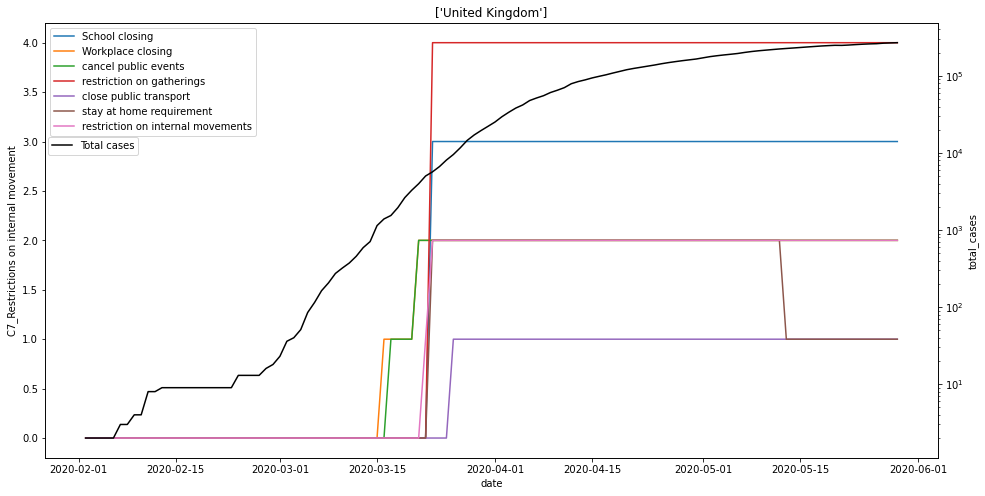

In [591]:
# comparison google index per country below
country = ['United Kingdom']
temp2 = df[df.location.isin(country)]
temp2 = temp2[(temp2['date'] > '2020-02-01') & (temp2['date'] < '2020-05-30')]

f, ax = plt.subplots(figsize=(16, 8))
ax = sns.lineplot(data=temp2, x="date", y="C1_School closing", label='School closing')
ax = sns.lineplot(data=temp2, x="date", y="C2_Workplace closing", label='Workplace closing')
ax = sns.lineplot(data=temp2, x="date", y="C3_Cancel public events", label='cancel public events')
ax = sns.lineplot(data=temp2, x="date", y="C4_Restrictions on gatherings", label='restriction on gatherings')
ax = sns.lineplot(data=temp2, x="date", y="C5_Close public transport", label='close public transport')
ax = sns.lineplot(data=temp2, x="date", y="C6_Stay at home requirements", label='stay at home requirement')
ax = sns.lineplot(data=temp2, x="date", y="C7_Restrictions on internal movement", label='restriction on internal movements')

#Plot 2
ax2 = ax.twinx()
ax2 = sns.lineplot(data=temp2, x="date", y="total_cases", label='Total cases', color='black')
ax2.set(yscale='log')
plt.legend(bbox_to_anchor=(0.11, .75))

#ax.set(xlim=(10, 1000000))
#ax.set(xscale='log')
plt.title(country)
plt.savefig('output/Stringency_Uk' + '.png', format="PNG", dpi=300)
plt.show()

In [ ]:
# comparison google index per country below
country = ['United Kingdom']
temp2 = df[df.location.isin(country)]
temp2 = temp2[(temp2['date'] > '2020-02-01') & (temp2['date'] < '2020-05-30')]

f, ax = plt.subplots(figsize=(16, 8))
ax = sns.lineplot(data=temp2, x="date", y="C1_School closing", label='School closing')
ax = sns.lineplot(data=temp2, x="date", y="C2_Workplace closing", label='Workplace closing')
ax = sns.lineplot(data=temp2, x="date", y="C3_Cancel public events", label='cancel public events')
ax = sns.lineplot(data=temp2, x="date", y="C4_Restrictions on gatherings", label='restriction on gatherings')
ax = sns.lineplot(data=temp2, x="date", y="C5_Close public transport", label='close public transport')
ax = sns.lineplot(data=temp2, x="date", y="C6_Stay at home requirements", label='stay at home requirement')
ax = sns.lineplot(data=temp2, x="date", y="C7_Restrictions on internal movement", label='restriction on internal movements')

#Plot 2
ax2 = ax.twinx()
ax2 = sns.lineplot(data=temp2, x="date", y="total_cases", label='Total cases', color='black')
ax2.set(yscale='log')
plt.legend(bbox_to_anchor=(0.11, .75))

#ax.set(xlim=(10, 1000000))
#ax.set(xscale='log')
plt.title(country)
plt.savefig('output/Stringency_Uk' + '.png', format="PNG", dpi=300)
plt.show()

plt.axvline(pd.to_datetime(date), label=acaps.category)

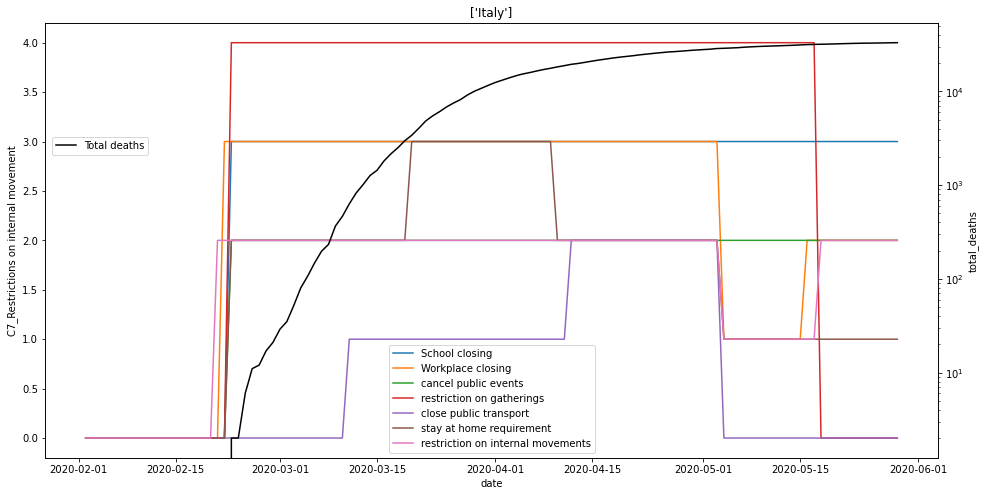

In [692]:
# Lockdown
country = ['Italy']
temp2 = df[df.location.isin(country)]
#temp2 = temp2[temp2['total_cases'] > 100]
temp2 = temp2[(temp2['date'] > '2020-02-01') & (temp2['date'] < '2020-05-30')]

f, ax = plt.subplots(figsize=(16, 8))
ax = sns.lineplot(data=temp2, x="date", y="C1_School closing", label='School closing')
ax = sns.lineplot(data=temp2, x="date", y="C2_Workplace closing", label='Workplace closing')
ax = sns.lineplot(data=temp2, x="date", y="C3_Cancel public events", label='cancel public events')
ax = sns.lineplot(data=temp2, x="date", y="C4_Restrictions on gatherings", label='restriction on gatherings')
ax = sns.lineplot(data=temp2, x="date", y="C5_Close public transport", label='close public transport')
ax = sns.lineplot(data=temp2, x="date", y="C6_Stay at home requirements", label='stay at home requirement')
ax = sns.lineplot(data=temp2, x="date", y="C7_Restrictions on internal movement", label='restriction on internal movements')

#Plot 2
ax2 = ax.twinx()
ax2 = sns.lineplot(data=temp2, x="date", y="total_deaths", label='Total deaths', color='black')
ax2.set(yscale='log')
plt.legend(bbox_to_anchor=(0.121, .75))

#ax.set(xlim=(10, 1000000))
#ax.set(xscale='log')
plt.title(country)
plt.savefig('output/Stringency_Sweden_deaths' + '.png', format="PNG", dpi=300)
plt.show()

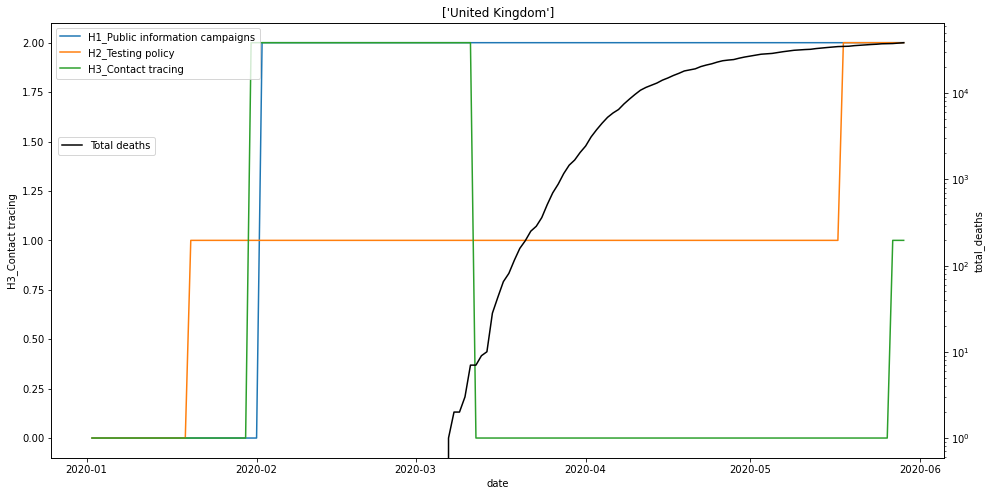

In [682]:
# Health
country = ['United Kingdom']
temp2 = df[df.location.isin(country)]
#temp2 = temp2[temp2['total_cases'] > 100]
temp2 = temp2[(temp2['date'] > '2020-01-01') & (temp2['date'] < '2020-05-30')]

f, ax = plt.subplots(figsize=(16, 8))
ax = sns.lineplot(data=temp2, x="date", y="H1_Public information campaigns", label='H1_Public information campaigns')
ax = sns.lineplot(data=temp2, x="date", y="H2_Testing policy", label='H2_Testing policy')
ax = sns.lineplot(data=temp2, x="date", y="H3_Contact tracing", label='H3_Contact tracing')
#ax = sns.lineplot(data=temp2, x="date", y="H4_Emergency investment in healthcare", label='H4_Emergency investment in healthcare')

#Plot 2
ax2 = ax.twinx()
ax2 = sns.lineplot(data=temp2, x="date", y="total_deaths", label='Total deaths', color='black')
ax2.set(yscale='log')
plt.legend(bbox_to_anchor=(0.121, .75))

#ax.set(xlim=(10, 1000000))
#ax.set(xscale='log')
plt.title(country)
plt.savefig('output/Stringency_Sweden_Eco_deaths' + '.png', format="PNG", dpi=300)
plt.show()

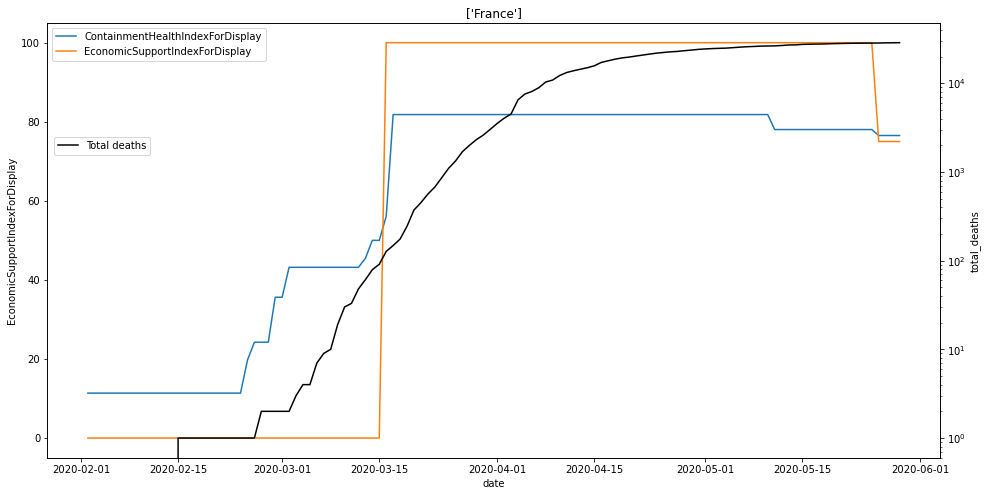

In [690]:
# indexes
country = ['France']
temp2 = df[df.location.isin(country)]
#temp2 = temp2[temp2['total_cases'] > 100]
temp2 = temp2[(temp2['date'] > '2020-02-01') & (temp2['date'] < '2020-05-30')]

f, ax = plt.subplots(figsize=(16, 8))
ax = sns.lineplot(data=temp2, x="date", y="ContainmentHealthIndexForDisplay", label='ContainmentHealthIndexForDisplay')
ax = sns.lineplot(data=temp2, x="date", y="EconomicSupportIndexForDisplay", label='EconomicSupportIndexForDisplay')

#Plot 2
ax2 = ax.twinx()
ax2 = sns.lineplot(data=temp2, x="date", y="total_deaths", label='Total deaths', color='black')
ax2.set(yscale='log')
plt.legend(bbox_to_anchor=(0.121, .75))

#ax.set(xlim=(10, 1000000))
#ax.set(xscale='log')
plt.title(country)
plt.savefig('output/Stringency_Sweden_Eco_deaths' + '.png', format="PNG", dpi=300)
plt.show()

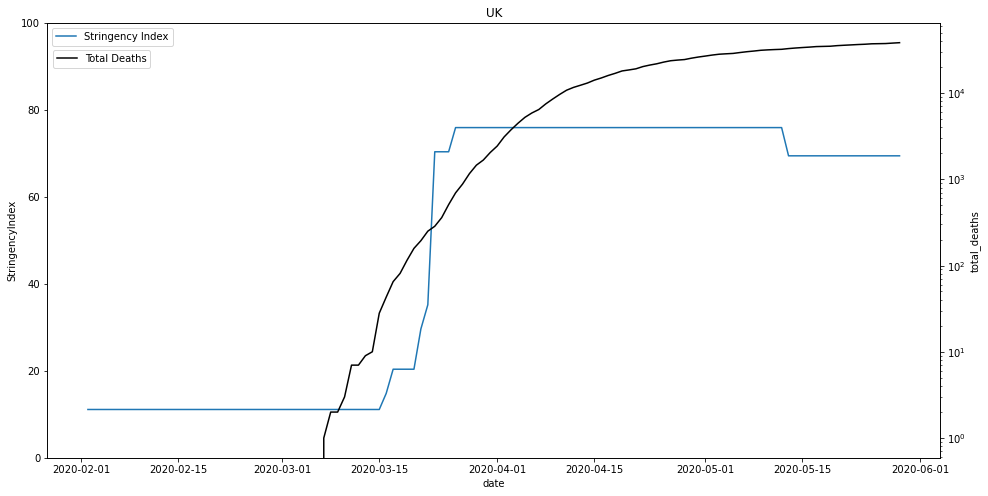

In [672]:
# comparison google index per country below
temp2 = df[df.location.isin(['United Kingdom'])]
temp2 = temp2[(temp2['date'] > '2020-02-01') & (temp2['date'] < '2020-05-30')]

f, ax = plt.subplots(figsize=(16, 8))
ax = sns.lineplot(data=temp2, x="date", y="StringencyIndex", label='Stringency Index')
ax.set(ylim=(0, 100))
plt.legend(loc=2)

#Plot 2
ax2 = ax.twinx()
ax2 = sns.lineplot(data=temp2, x="date", y="total_deaths", color='black', label='Total Deaths')
ax2.set(yscale='log')
#ax2.set(ylim=(0, 2000))
plt.legend(bbox_to_anchor=(.121, .95))

#ax.set(xscale='log')

plt.title('UK')
plt.savefig('output/UK_stringencyindex-deaths' + '.png', format="PNG", dpi=300)
plt.show()

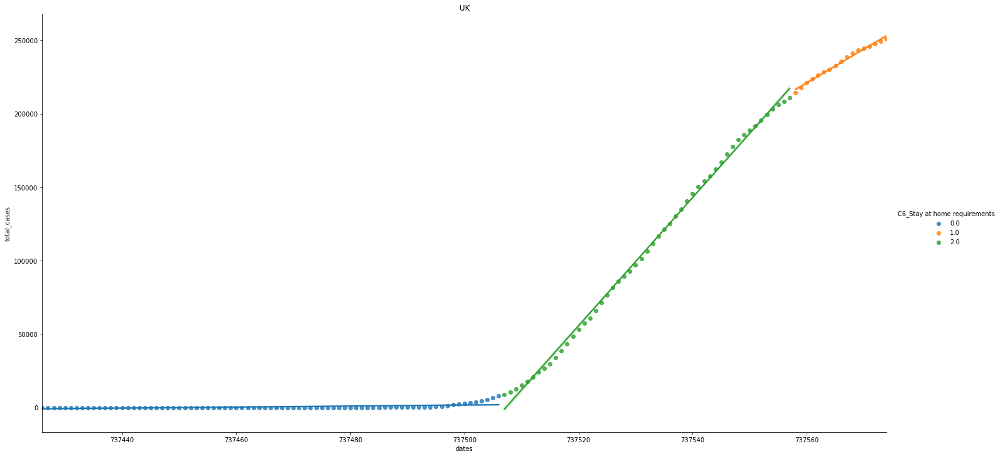

In [673]:
temp = df
temp = temp[(temp['date'] > '2020-01-01') & (temp['date'] < '2020-05-30')]

#temp.index = temp['date']
temp = temp[temp.location == 'United Kingdom']

#Create num dates
import matplotlib.dates as mdates
temp['dates'] = mdates.date2num(temp.date)

f = sns.lmplot(data=temp, x="dates", y='total_cases', hue="C6_Stay at home requirements", height=10, aspect=2)

plt.title('UK')
plt.savefig('output/UK' + '.png', format="PNG", dpi=300)
plt.show()

/Users/leonardveillon/anaconda3/envs/corona/lib/python3.7/site-packages/ipykernel_launcher.py:20: MatplotlibDeprecationWarning: Passing unsupported keyword arguments to axis() will raise a TypeError in 3.3.


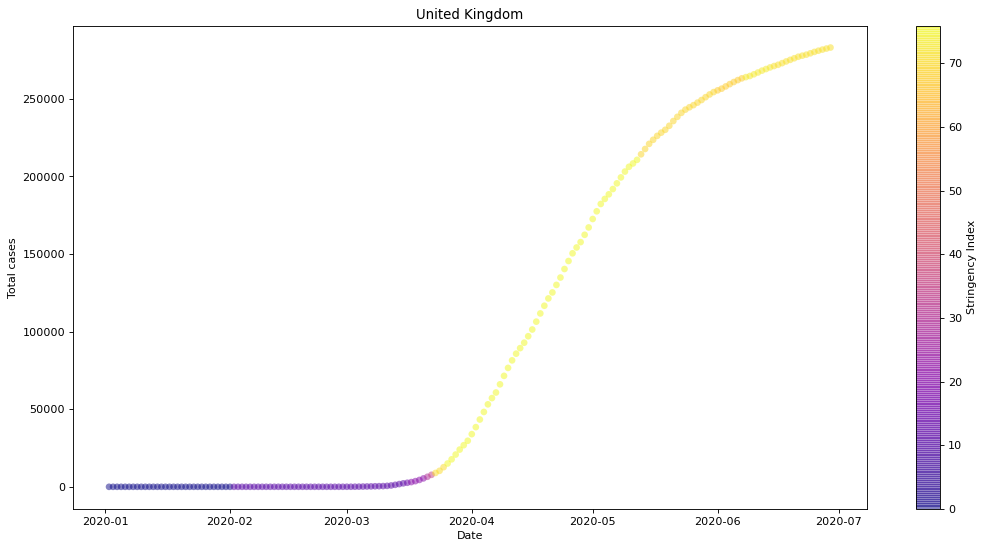

In [674]:
dstart = '2020-01-01'
dend = '2020-06-30'
country = 'United Kingdom'

temp = df
temp = temp[(temp['date'] > dstart ) & (temp['date'] < dend )]
#temp.index = temp['date']
temp = temp[temp.location == country]

# Extract the data we're interested in
x, y = temp['date'], temp['total_cases']
color = temp['StringencyIndex']

# Scatter the points, using size and color but no label

plt.figure(figsize=(16, 8), dpi=80)
plt.scatter(x, y, label=None,
            c=color, cmap='plasma',
            linewidth=0, alpha=0.5)
plt.axis(aspect='equal')
ax.set_yscale('log')
plt.xlabel('Date')
plt.ylabel('Total cases')
plt.colorbar(label='Stringency Index')
#plt.clim(0, 3)

plt.savefig('output/UK_stringency' + '.png', format="PNG", dpi=300)
plt.title(country);

In [808]:
temp = []
temp = mf


temp['test'] = temp['gdp_per_capita'] * temp['life_expectancy'] * temp['hospital_beds_per_thousand'] 
temp['death_rate'] = temp['total_deaths_per_million'] / temp['total_cases_per_million']
temp['ratio'] = temp['new_deaths'].pct_change()

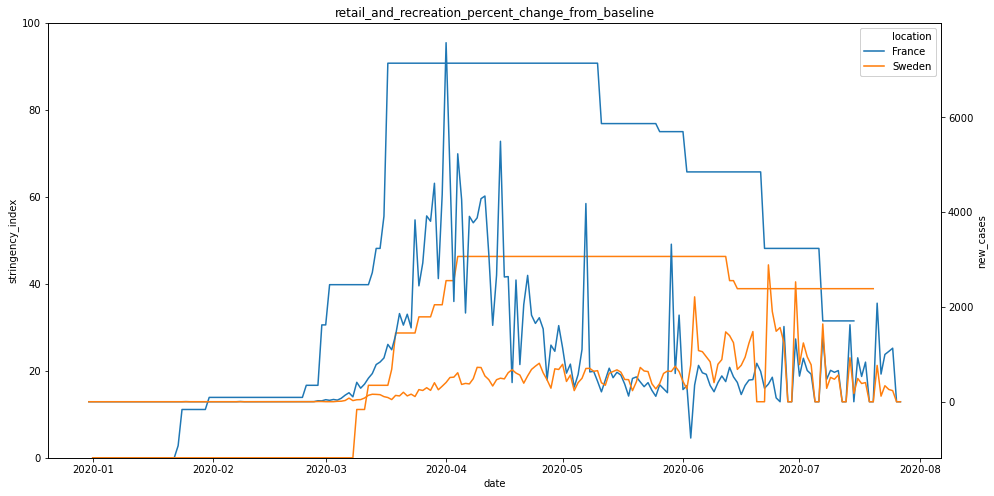

In [118]:
# comparison google index per country below
temp2 = temp[temp.location.isin(['Sweden', 'France'])]

f, ax = plt.subplots(figsize=(16, 8))
ax = sns.lineplot(data=temp2, x="date", y="stringency_index", hue='location')

#Total cases plot
ax2 = ax.twinx()
ax2 = sns.lineplot(data=temp2, x="date", y="new_cases", hue='location')
#ax2.set(yscale='log')
#plt.legend(bbox_to_anchor=(0.15, 0.8))


#axis
ax.set(ylim=(0, 100))
#ax.set(yscale='log')
plt.title('retail_and_recreation_percent_change_from_baseline') 
plt.show()

United States


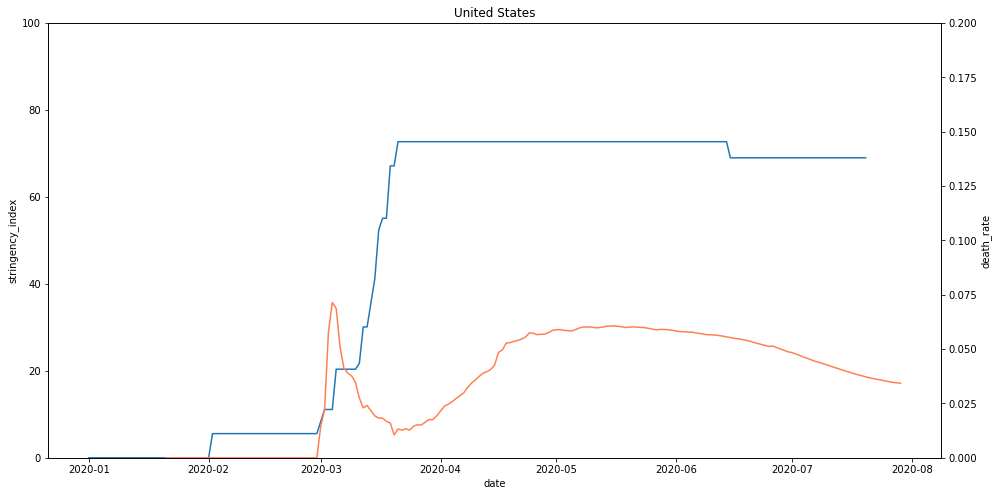

France


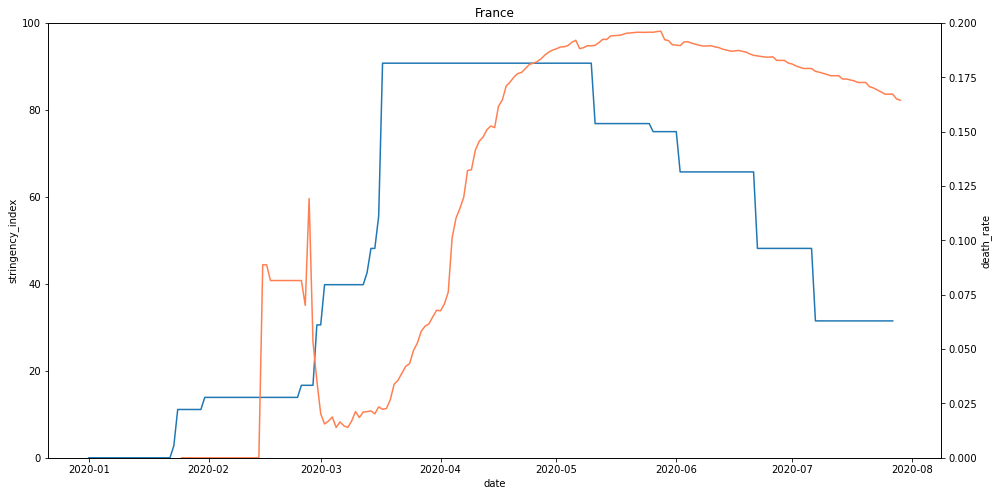

Spain


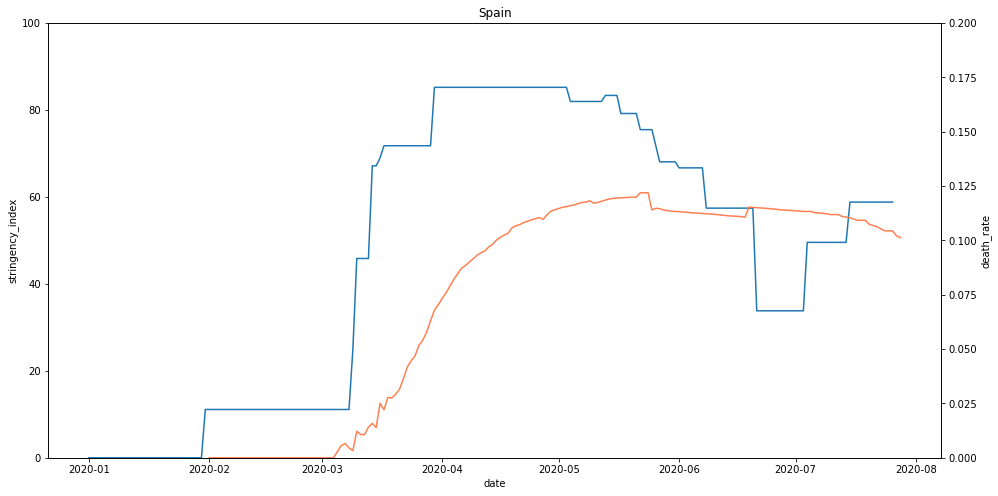

Switzerland


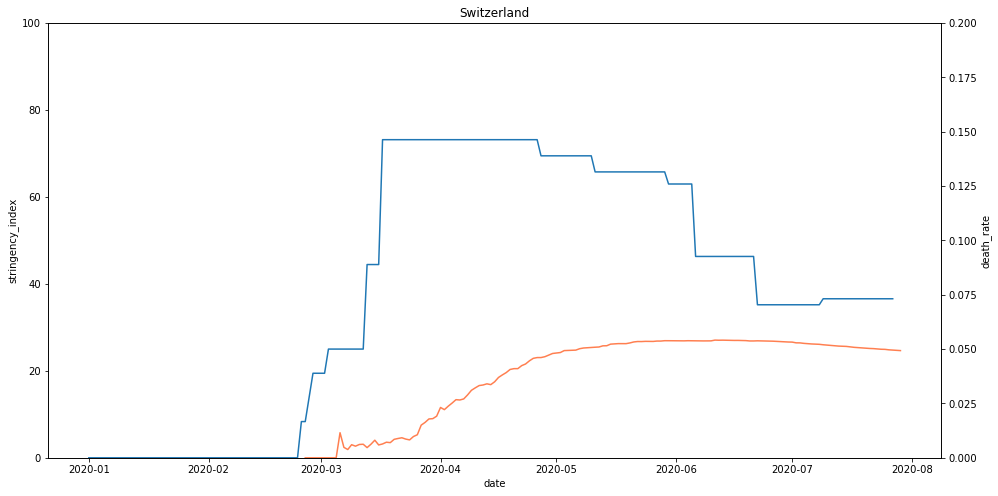

In [625]:
# comparison google index per country below

# google indexes per countries selected below
countries1 = ['United States', 'France', 'Spain', 'Switzerland']

for i in countries1:
    print(i)
    temp2 = []
    temp2 = temp[temp.location.isin([i])]
    
    f, ax = plt.subplots(figsize=(16, 8))
    ax = sns.lineplot(data=temp2, x="date", y="stringency_index")
    ax.set(ylim=(0, 100))
    
    #Total cases plot
    ax2 = ax.twinx()
    ax2 = sns.lineplot(data=temp2, x="date", y="death_rate", color='coral')
    ax2.set(ylim=(0, .2))
    #ax2.set(yscale='log')
    #plt.legend(bbox_to_anchor=(0.15, 0.8))
    
    #axis
    #ax.set(yscale='log')
    plt.title(i) 
    plt.savefig('output/Stringency_death_rate_' + i + '.png', format="PNG", dpi=300)
    plt.show()

United States


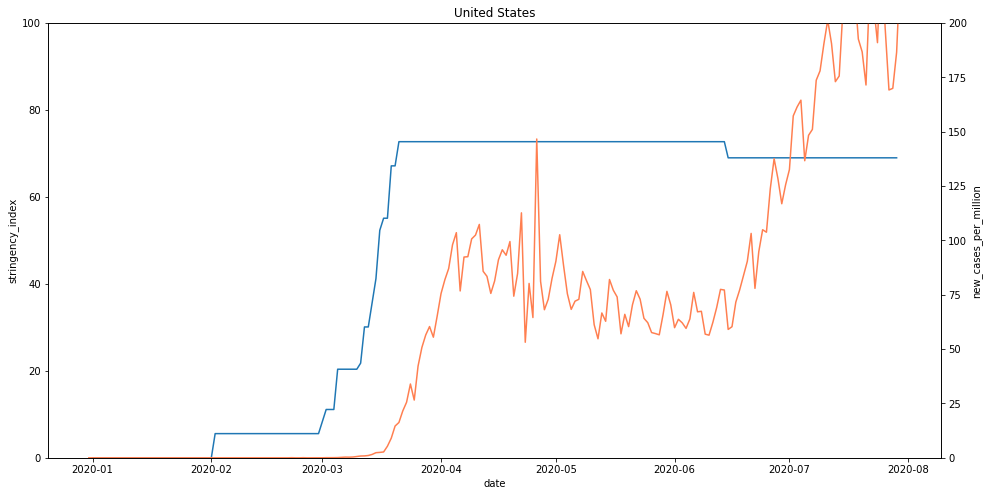

France


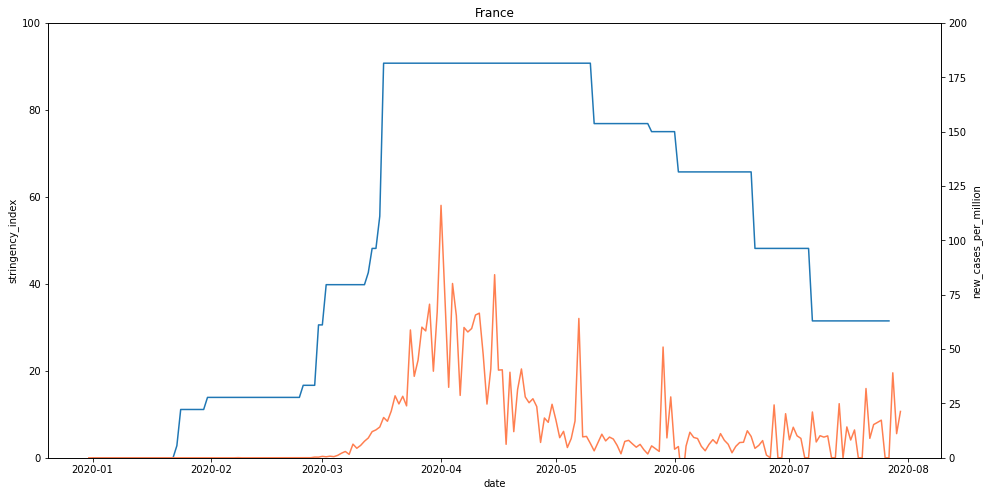

Spain


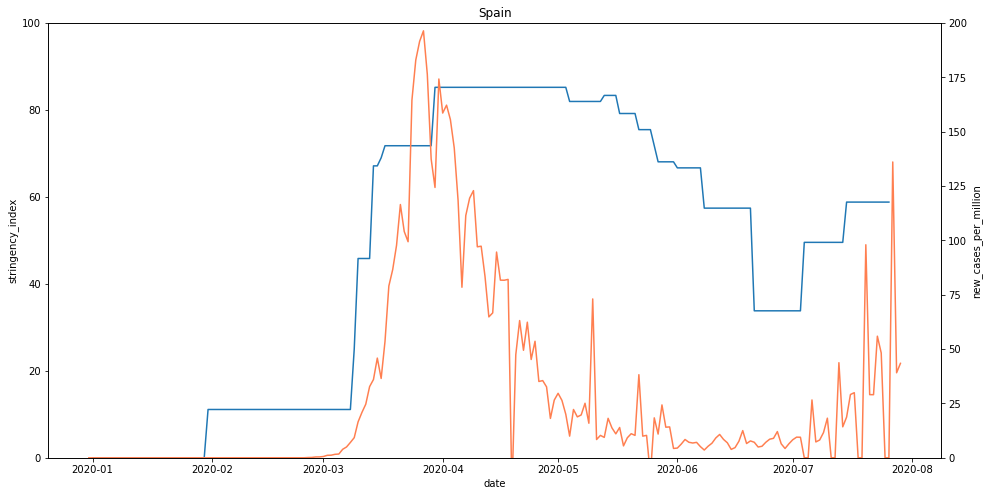

Switzerland


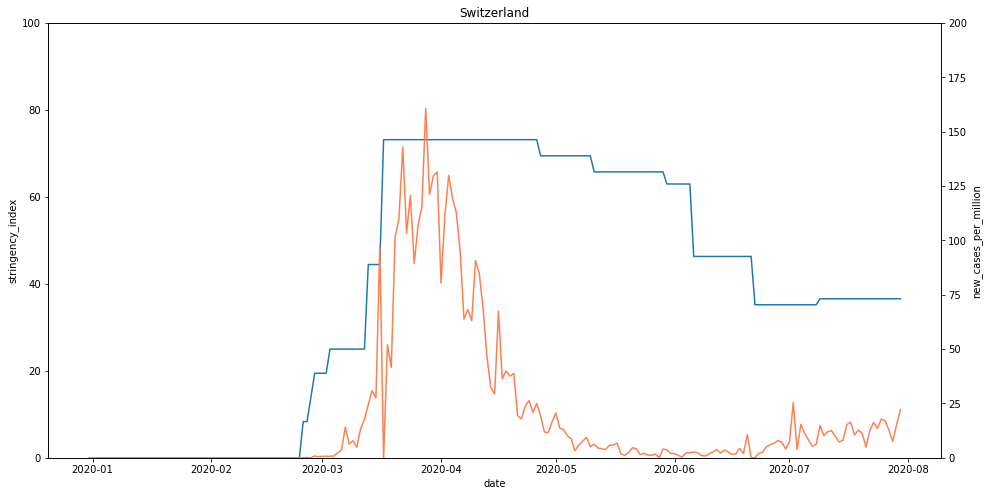

Sweden


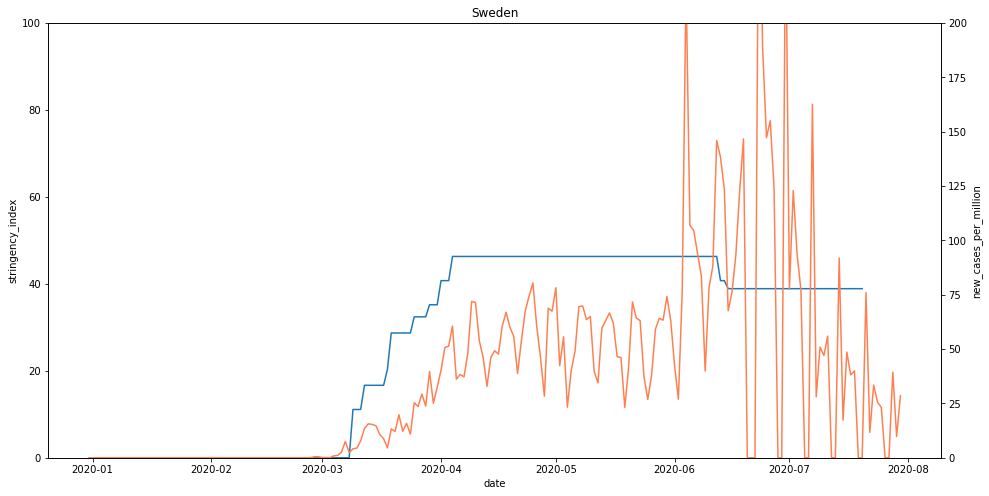

Italy


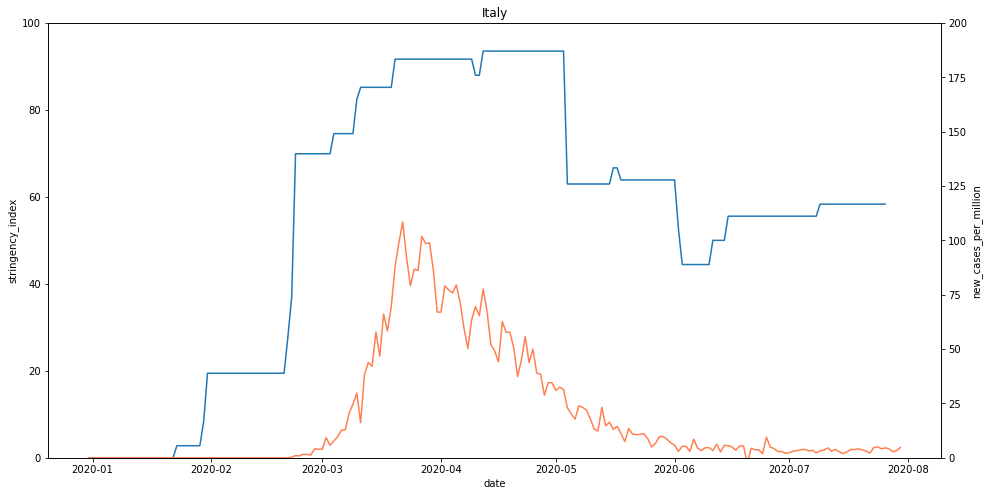

United Kingdom


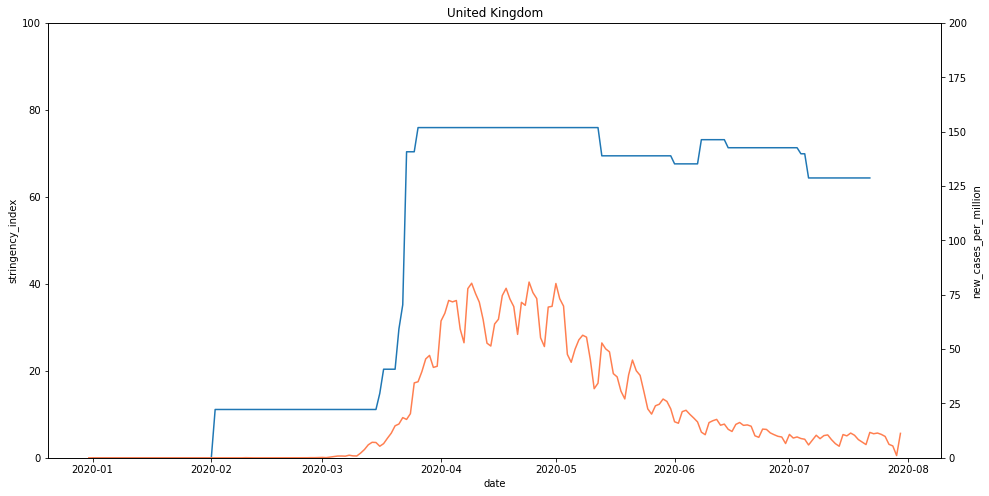

Germany


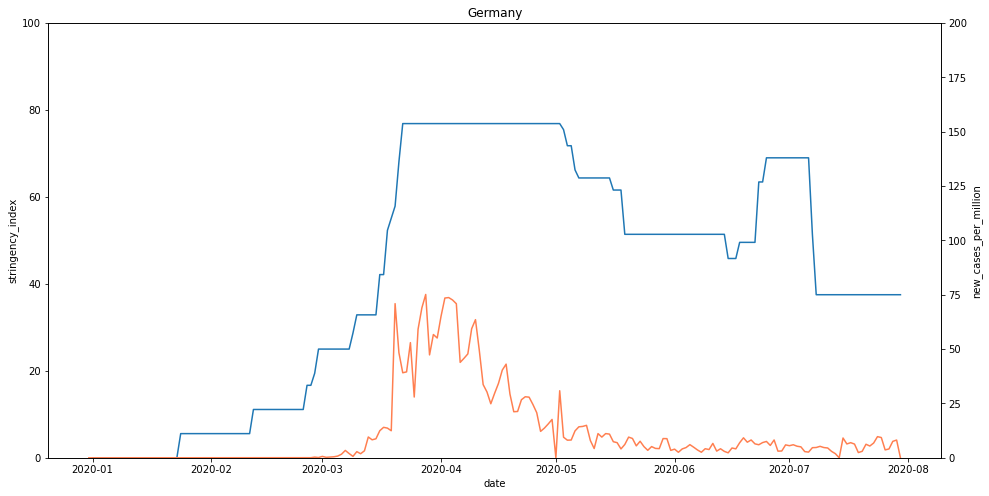

South Korea


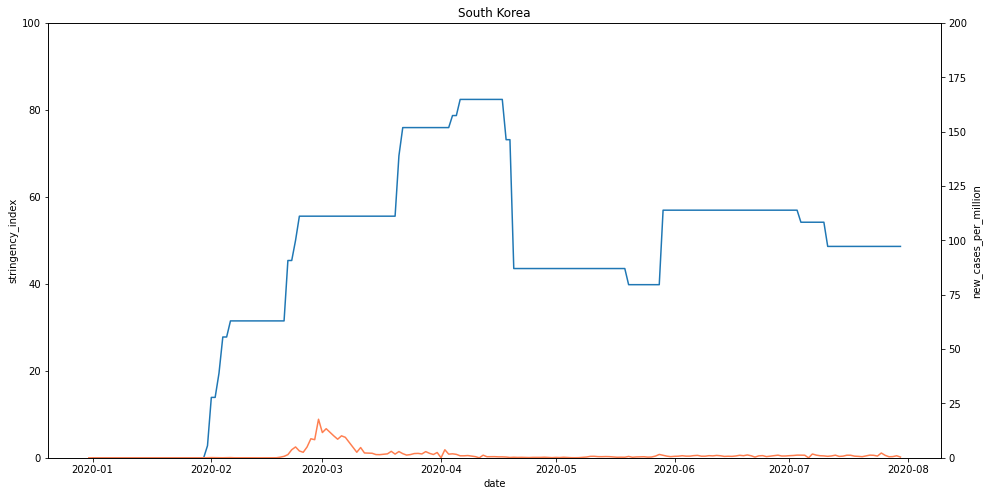

In [651]:
# comparison google index per country below

# google indexes per countries selected below
countries1 = ['United States', 'France', 'Spain', 'Switzerland', 'Sweden', 'Italy', 'United Kingdom', 'Germany', 'South Korea']

for i in countries1:
    print(i)
    temp2 = []
    temp2 = mf[mf.location.isin([i])]
    
    f, ax = plt.subplots(figsize=(16, 8))
    ax = sns.lineplot(data=temp2, x="date", y="stringency_index")
    ax.set(ylim=(0, 100))
    
    #Total cases plot
    ax2 = ax.twinx()
    ax2 = sns.lineplot(data=temp2, x="date", y="new_cases_per_million", color='coral')
    ax2.set(ylim=(0, 200))
    #ax2.set(yscale='log')
    #plt.legend(bbox_to_anchor=(0.15, 0.8))
    
    #axis
    #ax.set(yscale='log')
    plt.title(i) 
    plt.savefig('output/Stringency_new_cases_per_million_' + i + '.png', format="PNG", dpi=300)
    plt.show()

In [710]:
# comparison google index per country below

# google indexes per countries selected below
countries1 = ['United States', 'France', 'Spain', 'Switzerland', 'Sweden', 'Italy', 'United Kingdom',
              'Germany', 'South Korea']

for i in countries1:
    print(i)
    temp2 = []
    temp2 = mf[mf.location.isin([i])]
    temp2 = temp2[['new_cases', 'stringency_index']]

    
    #mf_corr = temp2.drop(['death_rate_per_m', 'test', 'ratio'], axis=1)
    temp2_corr = temp2.corr()
    print(temp2_corr)

#     #corr heat map
#     fig, ax = plt.subplots(figsize=(16,8))
#     sns.heatmap(temp2_corr, center=0, cmap="RdBu", ax=ax)
#     plt.savefig('output/Corr_' + i + '.png', format="PNG", dpi=300, bbox_inches='tight')
#     plt.show()


United States
                  new_cases  stringency_index
new_cases          1.000000          0.718949
stringency_index   0.718949          1.000000
France
                  new_cases  stringency_index
new_cases          1.000000          0.617435
stringency_index   0.617435          1.000000
Spain
                  new_cases  stringency_index
new_cases          1.000000          0.555428
stringency_index   0.555428          1.000000
Switzerland
                  new_cases  stringency_index
new_cases          1.000000          0.536102
stringency_index   0.536102          1.000000
Sweden
                  new_cases  stringency_index
new_cases          1.000000          0.617056
stringency_index   0.617056          1.000000
Italy
                  new_cases  stringency_index
new_cases          1.000000          0.710152
stringency_index   0.710152          1.000000
United Kingdom
                  new_cases  stringency_index
new_cases           1.00000           0.71225
stringency_in

United States


/Users/leonardveillon/anaconda3/envs/corona/lib/python3.7/site-packages/pandas/core/frame.py:3997: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


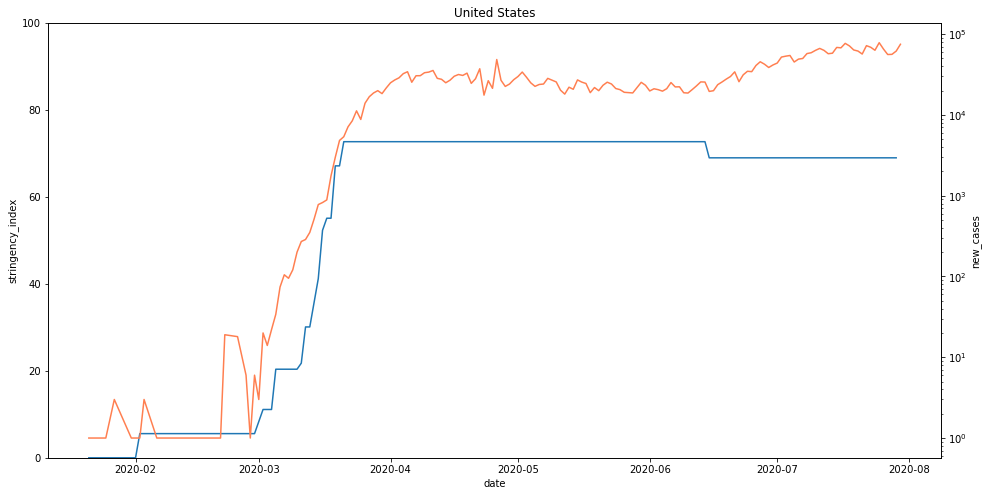

France


/Users/leonardveillon/anaconda3/envs/corona/lib/python3.7/site-packages/pandas/core/frame.py:3997: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


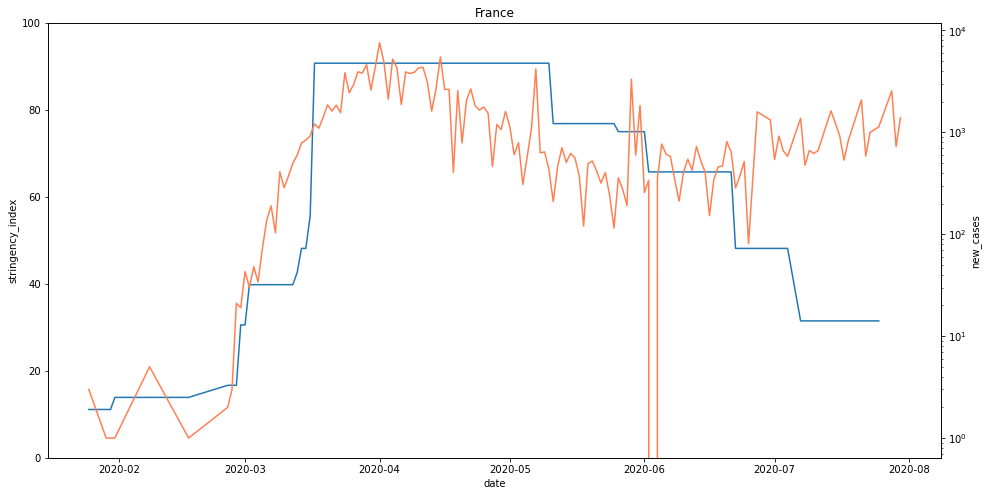

Spain


/Users/leonardveillon/anaconda3/envs/corona/lib/python3.7/site-packages/pandas/core/frame.py:3997: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


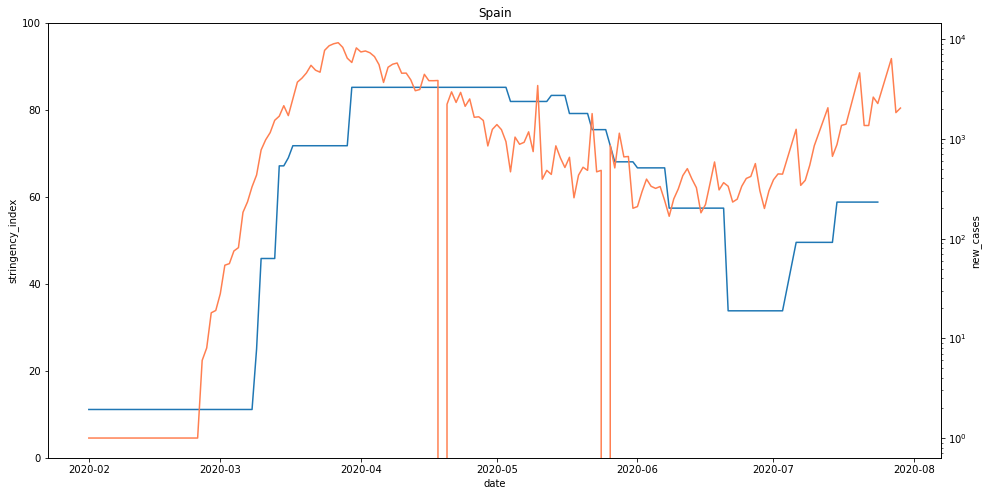

Switzerland


/Users/leonardveillon/anaconda3/envs/corona/lib/python3.7/site-packages/pandas/core/frame.py:3997: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


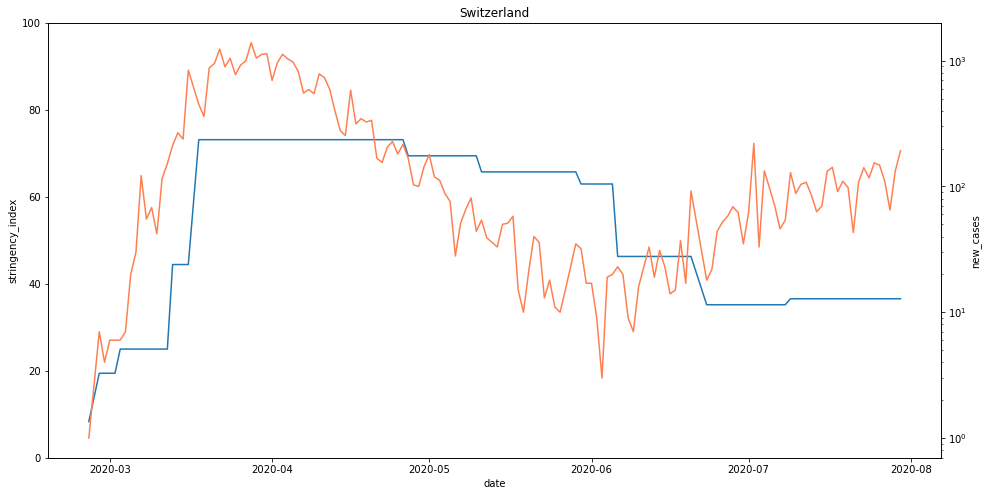

Sweden


/Users/leonardveillon/anaconda3/envs/corona/lib/python3.7/site-packages/pandas/core/frame.py:3997: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


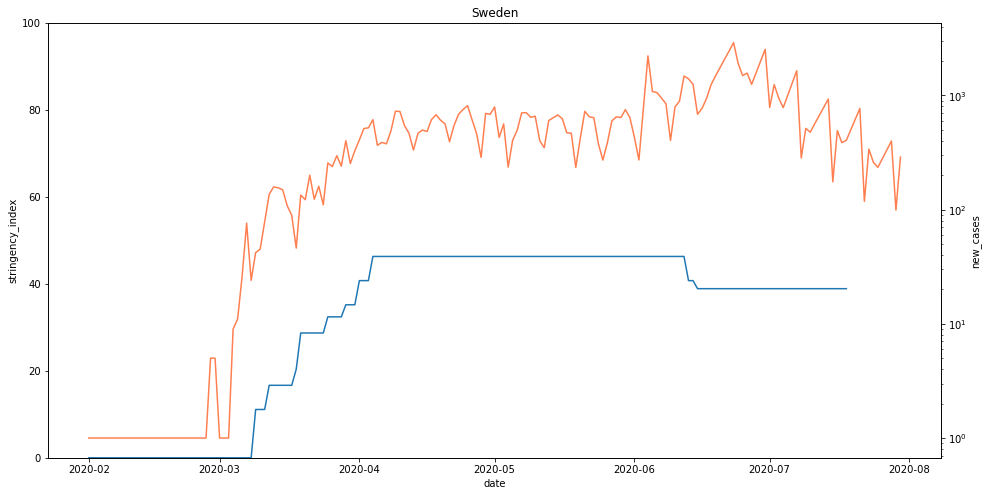

Italy


/Users/leonardveillon/anaconda3/envs/corona/lib/python3.7/site-packages/pandas/core/frame.py:3997: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


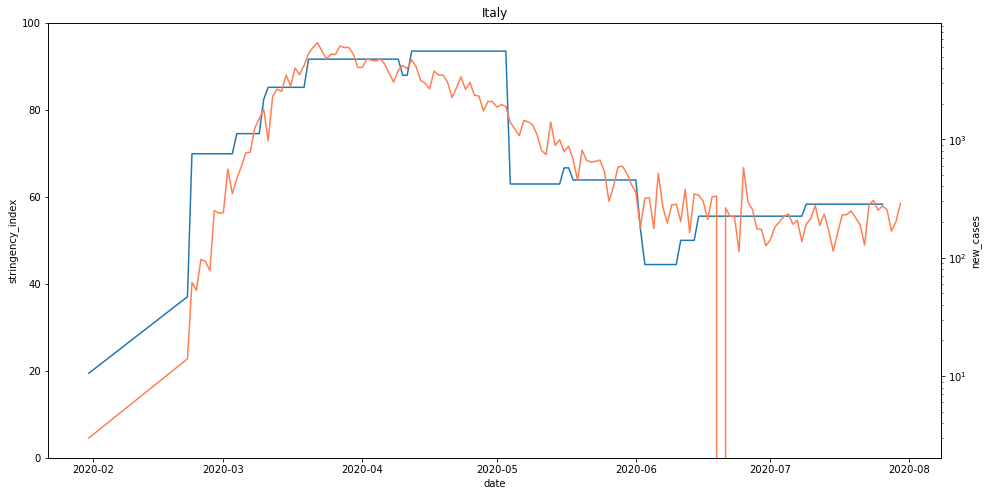

United Kingdom


/Users/leonardveillon/anaconda3/envs/corona/lib/python3.7/site-packages/pandas/core/frame.py:3997: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


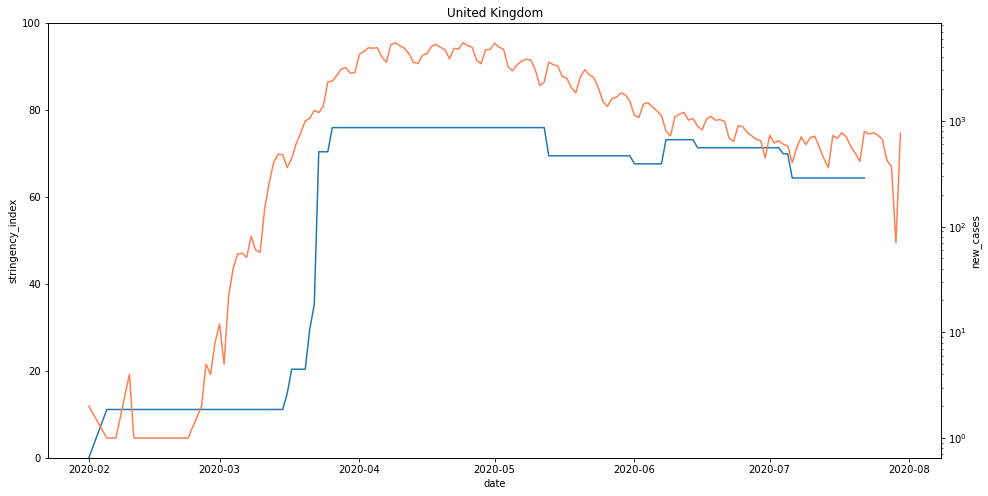

Germany


/Users/leonardveillon/anaconda3/envs/corona/lib/python3.7/site-packages/pandas/core/frame.py:3997: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


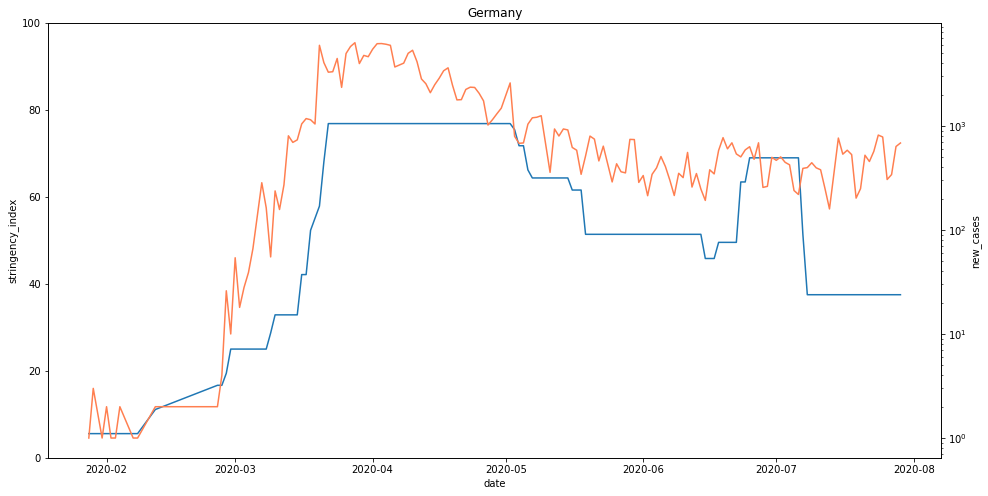

South Korea


/Users/leonardveillon/anaconda3/envs/corona/lib/python3.7/site-packages/pandas/core/frame.py:3997: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


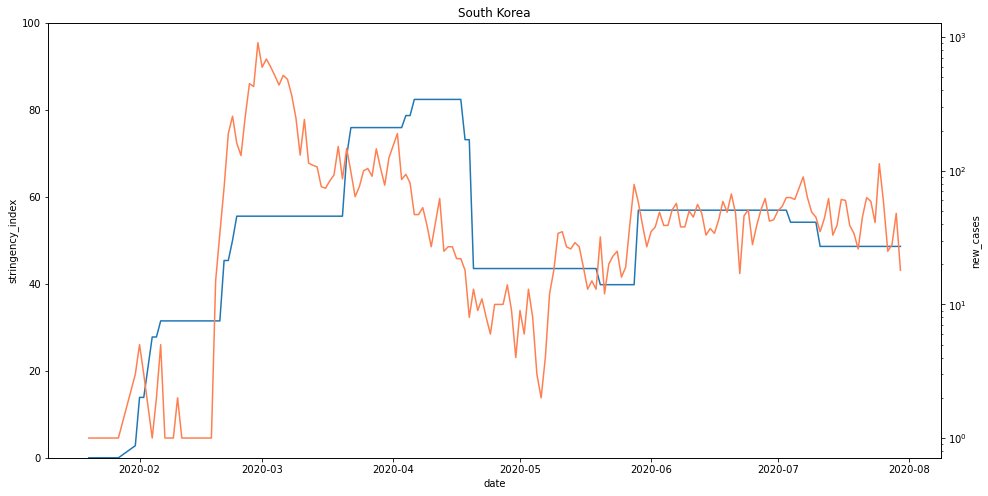

In [660]:
# comparison google index per country below

# google indexes per countries selected below
countries1 = ['United States', 'France', 'Spain', 'Switzerland', 'Sweden', 'Italy', 'United Kingdom', 'Germany', 'South Korea']

for i in countries1:
    print(i)
    temp2 = []
    temp2 = mf[mf.location.isin([i])]
    temp2.drop(temp2[temp2.new_cases == 0].index, inplace=True)

    
    f, ax = plt.subplots(figsize=(16, 8))
    ax = sns.lineplot(data=temp2, x="date", y="stringency_index")
    ax.set(ylim=(0, 100))
    
    #Total cases plot
    ax2 = ax.twinx()
    ax2 = sns.lineplot(data=temp2, x="date", y="new_cases", color='coral')
    #ax2.set(ylim=(0, 200))
    ax2.set(yscale='log')
    #plt.legend(bbox_to_anchor=(0.15, 0.8))
    
    #axis
    #ax.set(yscale='log')
    plt.title(i) 
    plt.savefig('output/Stringency_new_cases_' + i + '.png', format="PNG", dpi=300)
    plt.show()

United States


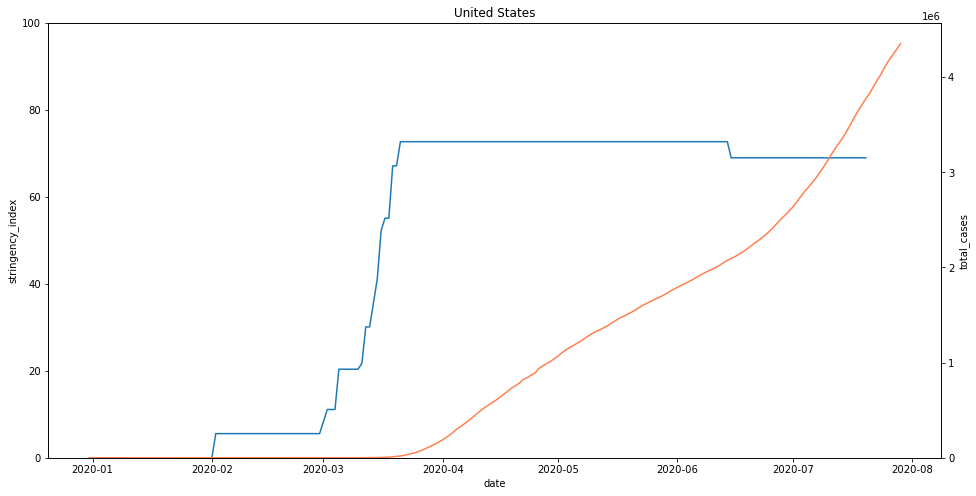

France


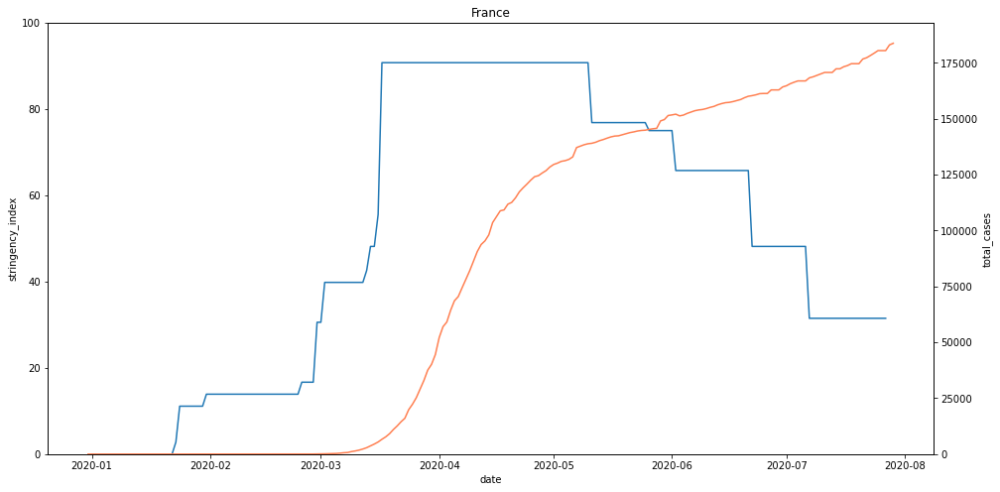

Spain


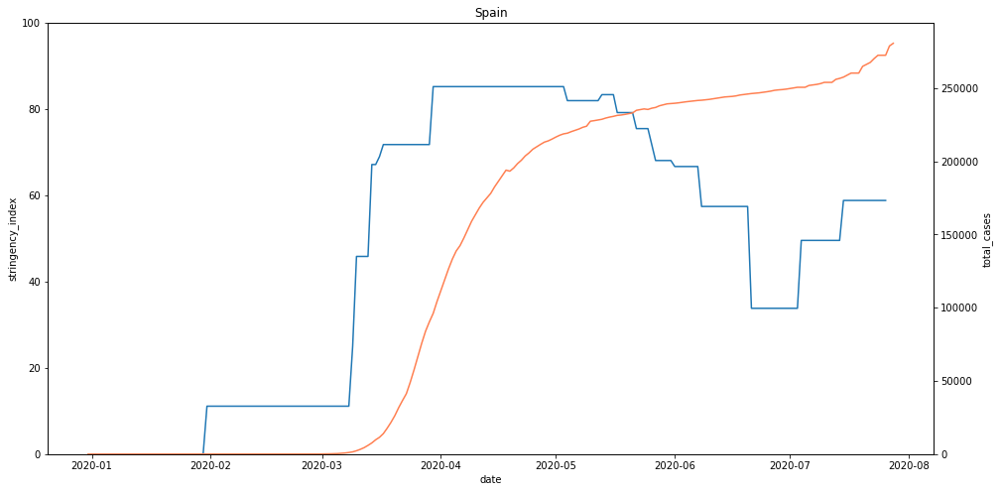

Switzerland


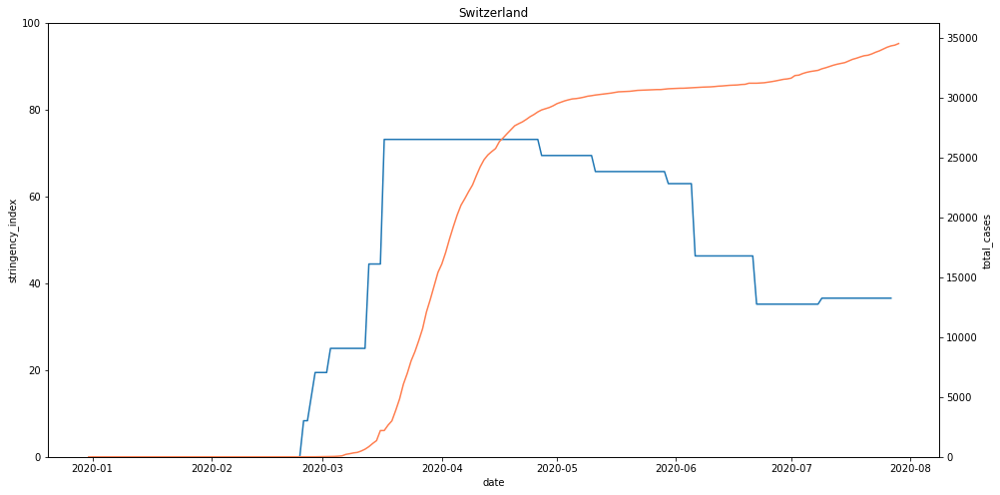

Sweden


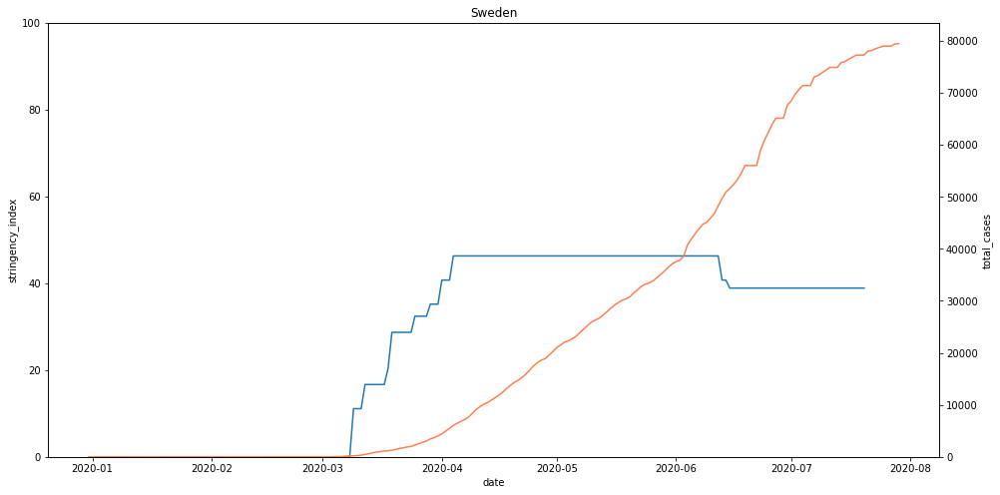

South Korea


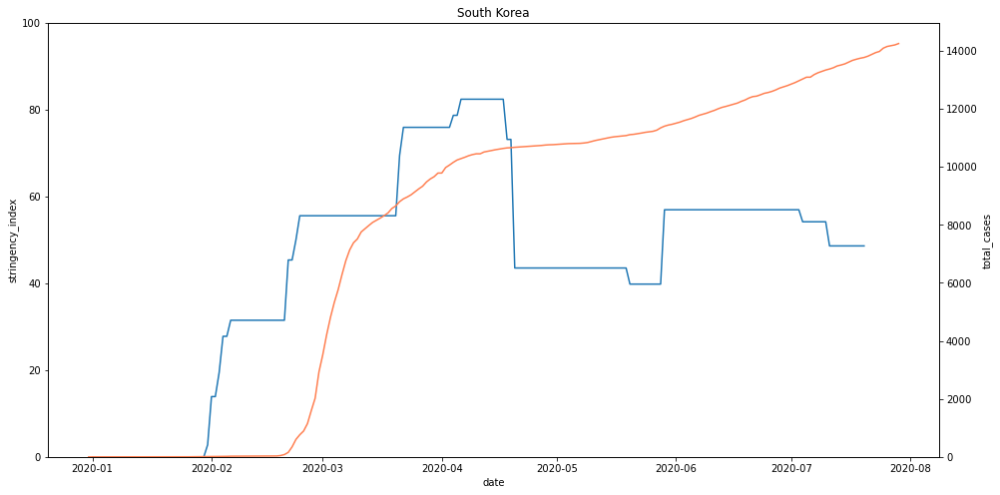

In [627]:
# comparison google index per country below

# google indexes per countries selected below
countries1 = ['United States', 'France', 'Spain', 'Switzerland', 'Sweden', 'South Korea']

for i in countries1:
    print(i)
    temp2 = []
    temp2 = temp[temp.location.isin([i])]
    
    f, ax = plt.subplots(figsize=(16, 8))
    ax = sns.lineplot(data=temp2, x="date", y="stringency_index")
    ax.set(ylim=(0, 100))
    
    #Total cases plot
    ax2 = ax.twinx()
    ax2 = sns.lineplot(data=temp2, x="date", y="total_cases", color='coral')
    ax2.set(ylim=(0, None))
    #ax2.set(yscale='log')
    #plt.legend(bbox_to_anchor=(0.15, 0.8))
    
    #axis
    #ax.set(yscale='log')
    plt.title(i) 
    plt.savefig('output/Stringency_total_cases' + '.png', format="PNG", dpi=300)
    plt.show()




United States


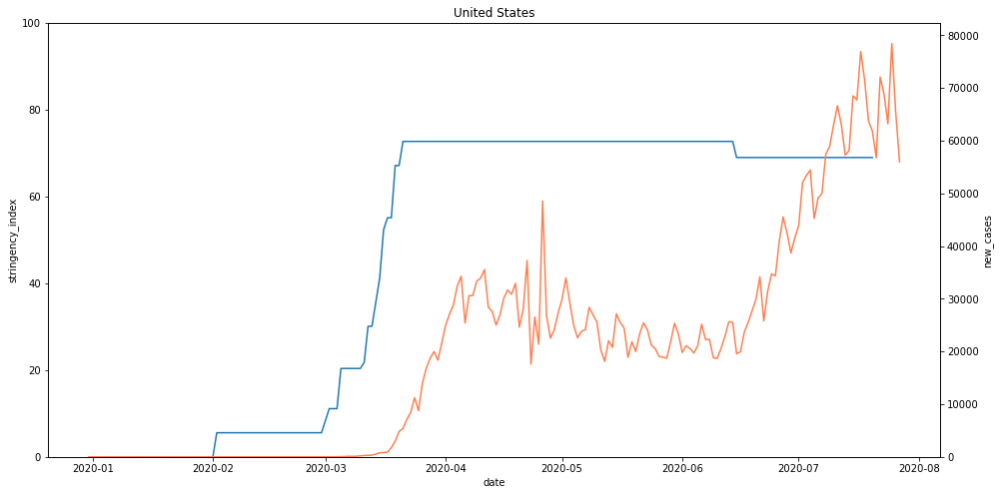

France


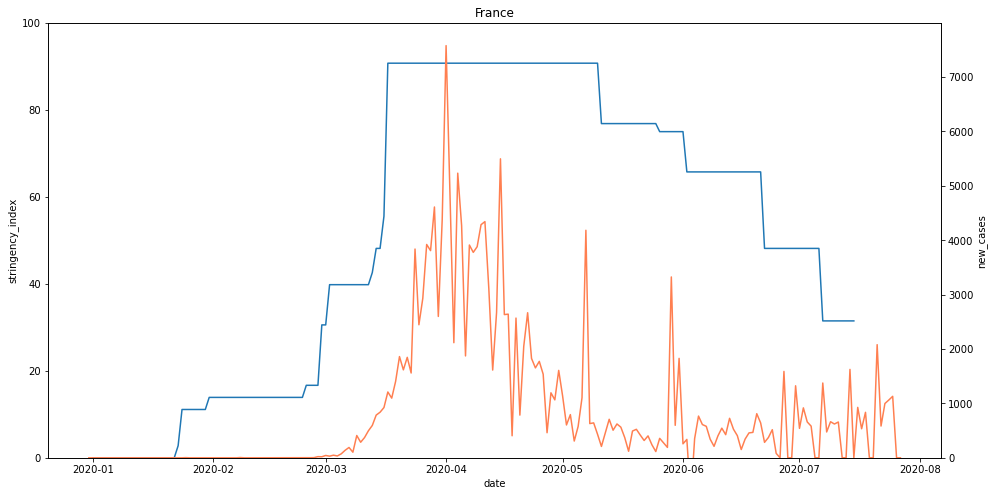

Spain


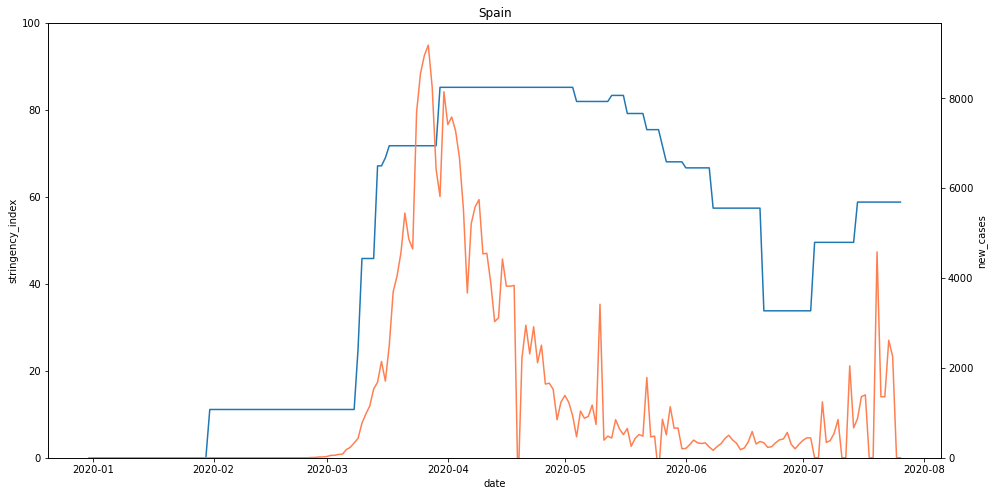

Switzerland


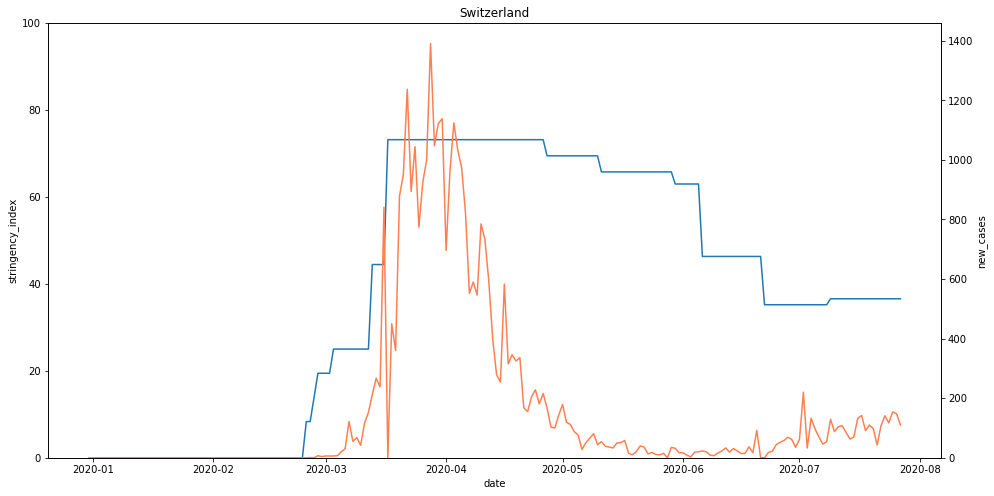

Sweden


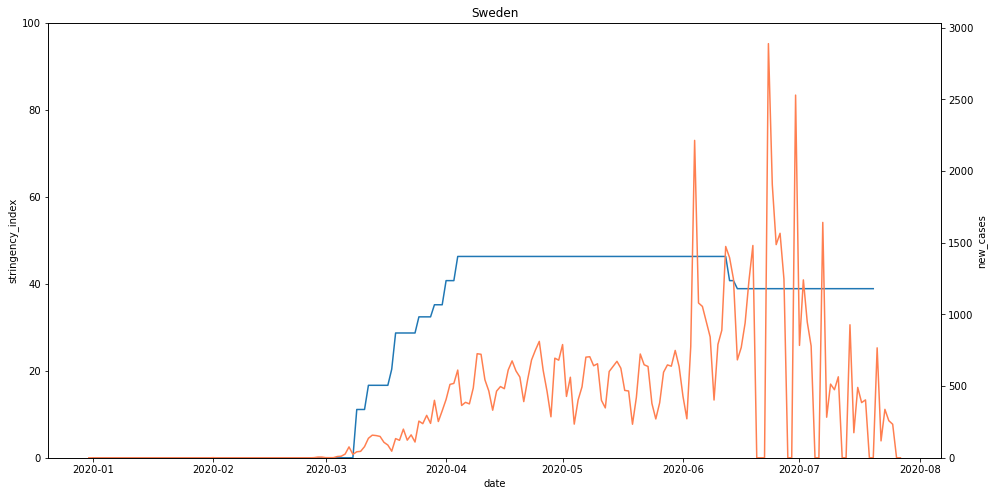

United Kingdom


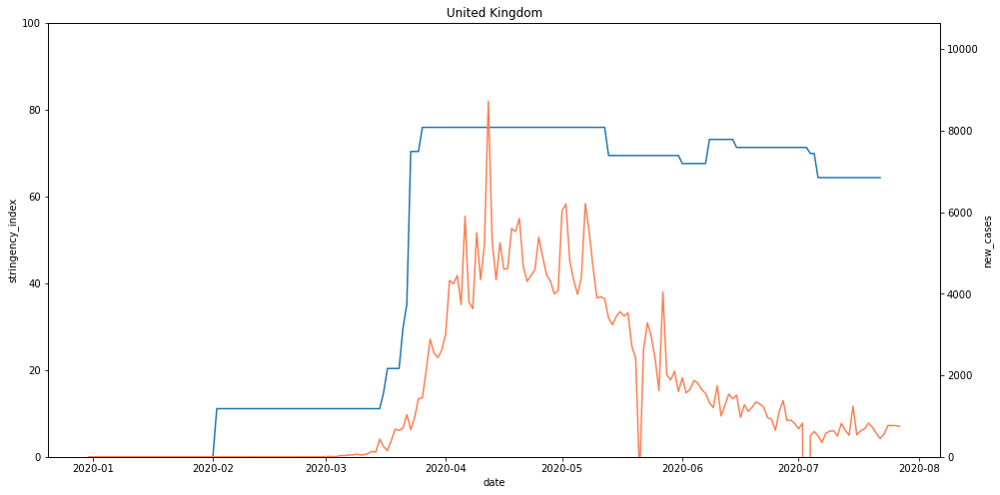

In [147]:
# comparison google index per country below

# google indexes per countries selected below
countries1 = ['United States', 'France', 'Spain', 'Switzerland', 'Sweden', 'United Kingdom']

for i in countries1:
    print(i)
    temp2 = []
    temp2 = temp[temp.location.isin([i])]
    
    f, ax = plt.subplots(figsize=(16, 8))
    ax = sns.lineplot(data=temp2, x="date", y="stringency_index")
    ax.set(ylim=(0, 100))
    
    #Total cases plot
    ax2 = ax.twinx()
    ax2 = sns.lineplot(data=temp2, x="date", y="new_cases", color='coral')
    ax2.set(ylim=(0, None))
    #ax2.set(yscale='log')
    #plt.legend(bbox_to_anchor=(0.15, 0.8))
    
    #axis
    #ax.set(yscale='log')
    plt.title(i) 
    plt.savefig('output/Stringency_new_cases' + '.png', format="PNG", dpi=300)
    plt.show()




In [830]:
death_rate = temp.groupby(['location'])['death_rate'].mean()
gdp = temp.groupby(['location'])['gdp_per_capita'].mean()
pop_density = temp.groupby(['location'])['population_density'].mean()
max_deaths = temp.groupby(['location'])['total_deaths'].max()
max_cases = temp.groupby(['location'])['total_cases'].max()
max_cases_per_m = temp.groupby(['location'])['total_cases_per_million'].max()
max_deaths_per_m = temp.groupby(['location'])['total_deaths_per_million'].max()
pop = temp.groupby(['location'])['population'].max()
beds = temp.groupby(['location'])['hospital_beds_per_thousand'].max()
test = temp.groupby(['location'])['total_tests_per_thousand'].mean()
y65 = temp.groupby(['location'])['aged_65_older'].mean()


#beef_series = pd.Series(author) 
#article_series = pd.Series(article) 

frame = {'death_rate': death_rate, 'gdp': gdp, 'pop_density': pop_density, 'max_cases': max_cases, 'max_cases_per_m': max_cases_per_m, 'max_deaths': max_deaths, 'max_deaths_per_m': max_deaths_per_m, 'pop': pop, 'beds': beds, 'test': test, 'y65': y65} 
  
death_rate_gdp = pd.DataFrame(frame)


# Remove countries with less than 1M people, 0 deaths, 0 death rate
death_rate_gdp = death_rate_gdp[(death_rate_gdp['pop'] >= 1000000)]
death_rate_gdp = death_rate_gdp[(death_rate_gdp['death_rate'] > 0)]
death_rate_gdp = death_rate_gdp[(death_rate_gdp['max_deaths'] > 0)]


print(death_rate_gdp)

             death_rate        gdp  pop_density   max_cases  max_cases_per_m  \
location                                                                       
Afghanistan    0.022994   1803.987       54.422     36710.0          943.015   
Albania        0.033558  11803.431      104.871      5396.0         1875.043   
Algeria        0.075283  13913.839       17.348     30950.0          705.798   
Angola         0.065084   5819.495       23.890      1114.0           33.895   
Argentina      0.032253  18933.907       16.177    191289.0         4232.453   
...                 ...        ...          ...         ...              ...   
Vietnam        0.000074   6171.884      308.127       590.0            6.061   
World          0.043208  15469.207       58.045  17841669.0         2288.920   
Yemen          0.195399   1479.147       53.508      1730.0           58.003   
Zambia         0.019485   3689.251       22.995      6228.0          338.774   
Zimbabwe       0.075400   1899.775      

In [822]:
merge100 = merge
merge100['death_rate'] = merge100['total_deaths_per_million'] / merge100['total_cases_per_million']

death_rate = []
gdp = []
pop_density = []
max_deaths = []
max_cases = []
max_cases_per_m = []
max_deaths_per_m = []
pop = []
beds = []
y65 = []

death_rate = merge100.groupby(['continent'])['death_rate'].mean()
gdp = merge100.groupby(['continent'])['gdp_per_capita'].mean()
pop_density = merge100.groupby(['continent'])['population_density'].mean()
max_deaths = merge100.groupby(['continent'])['total_deaths'].max()
max_cases = merge100.groupby(['continent'])['total_cases'].max()
max_cases_per_m = merge100.groupby(['continent'])['total_cases_per_million'].max()
max_deaths_per_m = merge100.groupby(['continent'])['total_deaths_per_million'].max()
pop = merge100.groupby(['continent'])['population'].max()
beds = merge100.groupby(['continent'])['hospital_beds_per_thousand'].max()
y65 = merge100.groupby(['continent'])['aged_65_older'].mean()

frame3 = {'death_rate': death_rate, 'gdp': gdp, 'pop_density': pop_density, 'max_cases': max_cases, 'max_cases_per_m': max_cases_per_m, 'max_deaths': max_deaths, 'max_deaths_per_m': max_deaths_per_m, 'pop': pop, 'beds': beds, 'y65': y65} 
continents1 = pd.DataFrame(frame3)

continents1.describe()

,death_rate,gdp,pop_density,max_cases,max_cases_per_m,max_deaths,max_deaths_per_m,pop,beds,y65
count,6.000000,6.000000,6.000000,6.000000e+00,6.000000,6.000000,6.000000,6.000000e+00,6.000000,6.000000
mean,0.031648,21137.707066,267.644795,1.646456e+06,17071.092667,54908.166667,445.062500,3.934100e+08,7.965000,9.506530
std,0.010994,10192.065716,257.295235,1.628812e+06,12482.966100,56816.399490,436.709154,5.219597e+08,4.316729,4.762209
min,0.017261,5697.823548,25.970929,1.558200e+04,2097.368000,176.000000,34.748000,2.549988e+07,3.840000,3.733759
25%,0.022954,15976.285891,74.911748,5.605898e+05,9623.521500,14364.750000,156.224000,1.609857e+08,5.200000,7.116400
50%,0.033407,23094.012574,177.896876,1.206391e+06,16527.410500,40464.500000,350.500500,2.093495e+08,6.050000,9.174590
75%,0.040063,25443.736515,444.176751,2.310147e+06,20420.836250,79090.750000,541.832500,3.013918e+08,11.362500,10.291847
max,0.044065,35109.705539,650.584011,4.426982e+06,38233.497000,150713.000000,1237.551000,1.439324e+09,13.800000,17.861636


In [810]:
death_rate_gdp.describe()

,death_rate,gdp,pop_density,max_cases,max_cases_per_m,max_deaths,max_deaths_per_m,pop,beds,test,y65
count,152.000000,148.000000,149.000000,1.520000e+02,152.000000,152.000000,152.000000,1.520000e+02,133.000000,1.300000e+02,149.000000
mean,0.033931,18436.105649,197.158758,2.345134e+05,3011.979599,9014.776316,89.286467,1.019680e+08,2.936992,5.860466e+06,8.897564
std,0.030696,19103.660659,674.501287,1.509736e+06,4969.123346,57564.806332,154.617532,6.495501e+08,2.470193,7.487694e+06,6.465246
min,0.000074,661.240000,3.078000,9.100000e+01,6.061000,1.000000,0.051000,1.160164e+06,0.100000,1.194685e+04,1.144000
25%,0.011881,3789.708250,35.879000,2.489250e+03,275.827000,57.500000,4.635250,5.450043e+06,1.100000,4.888819e+05,3.165000
50%,0.028113,12265.791000,80.291000,1.494550e+04,949.170500,213.500000,19.391000,1.200699e+07,2.220000,2.725791e+06,6.378000
75%,0.042534,26910.234250,147.674000,6.757250e+04,3689.988500,1707.500000,86.771250,3.811704e+07,4.200000,9.282563e+06,14.738000
max,0.195399,116935.600000,7915.731000,1.784167e+07,38496.595000,685281.000000,849.467000,7.794799e+09,13.050000,4.307489e+07,27.049000


In [805]:
death_rate_gdp_2 = death_rate_gdp[(death_rate_gdp['max_cases_per_m'] >= 952.22)]
death_rate_gdp_2.describe()

,death_rate,gdp,pop_density,max_cases_per_m,max_deaths,max_deaths_per_m,pop,beds,test,y65
count,75.000000,75.000000,75.000000,75.000000,75.000000,75.000000,7.500000e+01,70.000000,7.000000e+01,74.000000
mean,0.032925,26699.804133,266.710440,5331.800880,8292.413333,162.497573,5.143325e+07,3.454071,7.637739e+06,11.163230
std,0.027394,21718.541858,937.819203,5760.901929,21280.749462,184.717966,1.657183e+08,2.328113,6.750678e+06,6.659612
min,0.000944,661.240000,4.037000,952.220000,26.000000,4.615000,1.160164e+06,0.530000,3.523087e+04,1.144000
25%,0.011973,11147.915500,39.915500,2222.231000,269.000000,42.640000,4.739712e+06,1.600000,1.803953e+06,4.795000
50%,0.027220,22267.037000,85.129000,3487.349000,1063.000000,82.276000,9.904608e+06,2.790000,6.494062e+06,10.975500
75%,0.042655,39179.457500,162.994500,5812.842000,5769.500000,210.103500,3.903455e+07,4.697500,1.116956e+07,17.729000
max,0.123952,116935.600000,7915.731000,37939.161000,146935.000000,847.396000,1.380004e+09,11.000000,2.942796e+07,23.021000


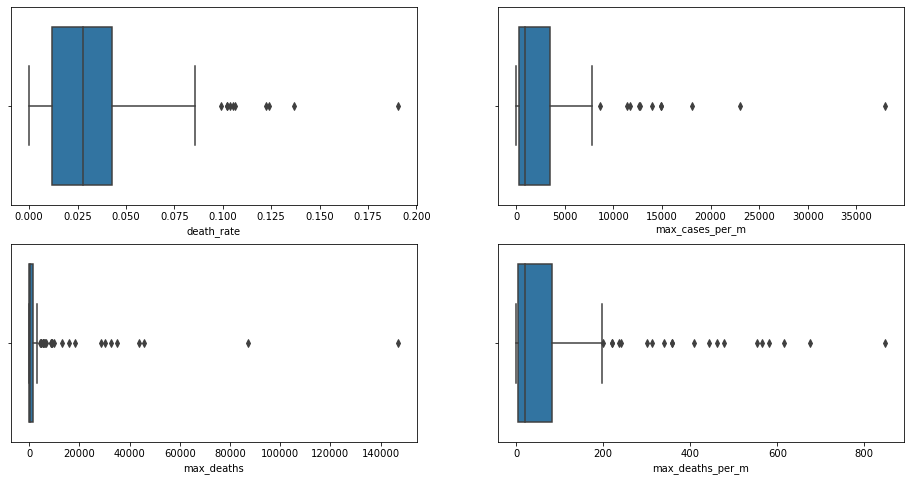

In [415]:
# plot with various axes scales
plt.figure(figsize=(16, 8))

# linear
plt.subplot(221)
sns.boxplot(x='death_rate', data=death_rate_gdp)

# linear
plt.subplot(222)
sns.boxplot(x='max_cases_per_m', data=death_rate_gdp)

# linear
plt.subplot(223)
sns.boxplot(x='max_deaths', data=death_rate_gdp)

# linear
plt.subplot(224)
sns.boxplot(x='max_deaths_per_m', data=death_rate_gdp)

plt.savefig('output/death_rate_gdp_describe' + '.png', format="PNG", dpi=300)
plt.show()

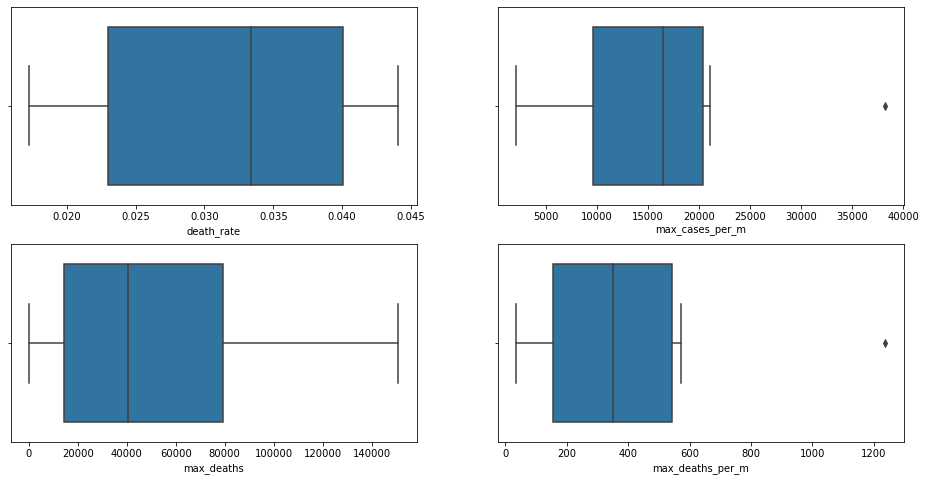

In [823]:
# plot with various axes scales
plt.figure(figsize=(16, 8))

# linear
plt.subplot(221)
sns.boxplot(x='death_rate', data=continents1)

# linear
plt.subplot(222)
sns.boxplot(x='max_cases_per_m', data=continents1)

# linear
plt.subplot(223)
sns.boxplot(x='max_deaths', data=continents1)

# linear
plt.subplot(224)
sns.boxplot(x='max_deaths_per_m', data=continents1)

plt.savefig('output/death_rate_gdp_describe' + '.png', format="PNG", dpi=300)
plt.show()

In [846]:
ff = death_rate_gdp[death_rate_gdp.death_rate > .05]
ff[ff.y65 < 15] 

,death_rate,gdp,pop_density,max_cases,max_cases_per_m,max_deaths,max_deaths_per_m,pop,beds,test,y65
location,,,,,,,,,,,
Algeria,0.075283,13913.839,17.348,30950.0,705.798,1223.0,27.890,43851043.0,1.90,NaN,6.211
Angola,0.065084,5819.495,23.890,1114.0,33.895,52.0,1.582,32866268.0,NaN,NaN,2.405
Burkina Faso,0.053781,1703.102,70.151,1149.0,54.967,53.0,2.535,20903278.0,0.40,NaN,2.409
Chad,0.061389,1768.153,11.833,936.0,56.983,75.0,4.566,16425859.0,NaN,NaN,2.486
Ecuador,0.060101,10581.936,66.939,86232.0,4887.588,5736.0,325.114,17643060.0,1.50,4.046000,7.104
Gambia,0.082377,1561.767,207.566,498.0,206.069,9.0,3.724,2416664.0,1.10,NaN,2.339
Indonesia,0.062945,11188.744,145.725,109936.0,401.925,5193.0,18.986,273523621.0,1.04,0.945371,5.319
Iran,0.067960,19082.620,49.831,306752.0,3652.116,16982.0,202.184,83992953.0,1.50,13.318873,5.440
Liberia,0.071367,752.788,49.127,1189.0,235.088,75.0,14.829,5057677.0,0.80,NaN,3.057


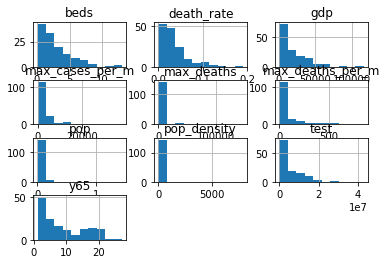

In [804]:
t = death_rate_gdp.sort_values(by=['max_cases_per_m'], ascending=[False]).hist()

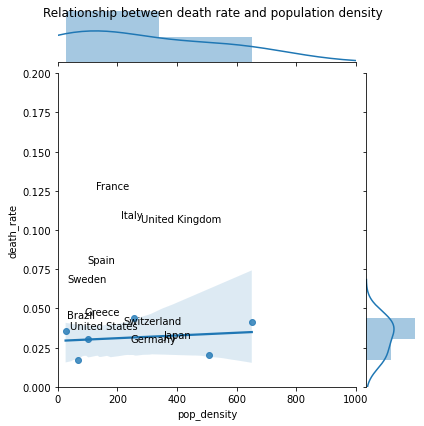

In [824]:
g = sns.jointplot(x='pop_density', y='death_rate', data=death_rate_gdp,
              kind="reg", dropna=True, ylim=(0,0.2), xlim=(0,1000));
# g.ax_joint.set_xscale('log')

#indices to annotate
head = death_rate_gdp[death_rate_gdp.index.isin(['Japan', 'Brazil', 'United States', 'Switzerland', 'Spain', 'Germany', 'Sweden', 'Greece', 'Italy', 'France', 'United Kingdom'])]


def ann(row):
    ind = row[0]
    r = row[1]
    plt.gca().annotate(ind, xy=(r["pop_density"], r["death_rate"]), 
            xytext=(2,2) , textcoords ="offset points", )

for i in head.iterrows():
    ann(i)
#for row in tail.iterrows():
#    ann(row)

g.fig.suptitle("Relationship between death rate and population density")

plt.savefig('output/death_rate_pop_density' + '.png', format="PNG", dpi=300)
plt.show()

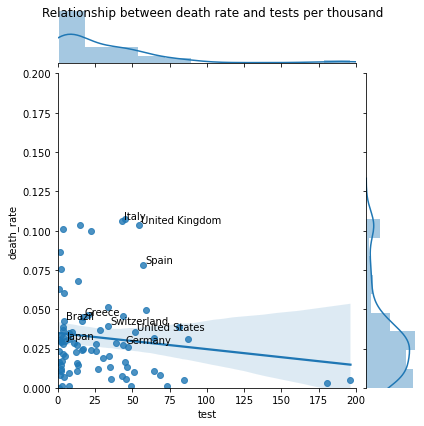

In [841]:
g = sns.jointplot(x='test', y='death_rate', data=death_rate_gdp,
              kind="reg", dropna=True, ylim=(0,0.2), xlim=(0,200));
# g.ax_joint.set_xscale('log')

#indices to annotate
head = death_rate_gdp[death_rate_gdp.index.isin(['Japan', 'Brazil', 'United States', 'Switzerland', 'Spain', 'Germany', 'Sweden', 'Greece', 'Italy', 'France', 'United Kingdom'])]


def ann(row):
    ind = row[0]
    r = row[1]
    plt.gca().annotate(ind, xy=(r["test"], r["death_rate"]), 
            xytext=(2,2) , textcoords ="offset points", )

for i in head.iterrows():
    ann(i)
#for row in tail.iterrows():
#    ann(row)

g.fig.suptitle("Relationship between death rate and tests per thousand")

plt.savefig('output/test_deathrate' + '.png', format="PNG", dpi=300)
plt.show()

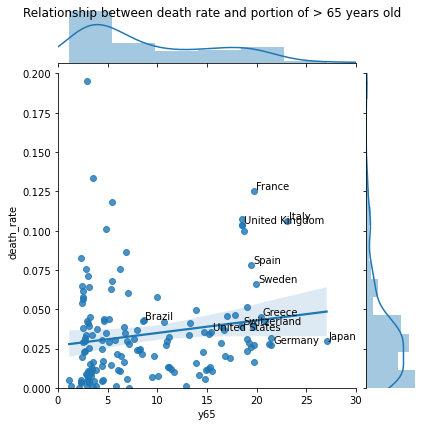

In [840]:
g = sns.jointplot(x='y65', y='death_rate', data=death_rate_gdp,
              kind="reg", dropna=True, ylim=(0,0.2), xlim=(0,30));
# g.ax_joint.set_xscale('log')

#indices to annotate
head = death_rate_gdp[death_rate_gdp.index.isin(['Japan', 'Brazil', 'United States', 'Switzerland', 'Spain', 'Germany', 'Sweden', 'Greece', 'Italy', 'France', 'United Kingdom'])]


def ann(row):
    ind = row[0]
    r = row[1]
    plt.gca().annotate(ind, xy=(r["y65"], r["death_rate"]), 
            xytext=(2,2) , textcoords ="offset points", )

for i in head.iterrows():
    ann(i)
#for row in tail.iterrows():
#    ann(row)

g.fig.suptitle("Relationship between death rate and portion of > 65 years old")

plt.savefig('output/y65_deathrate' + '.png', format="PNG", dpi=300)
plt.show()

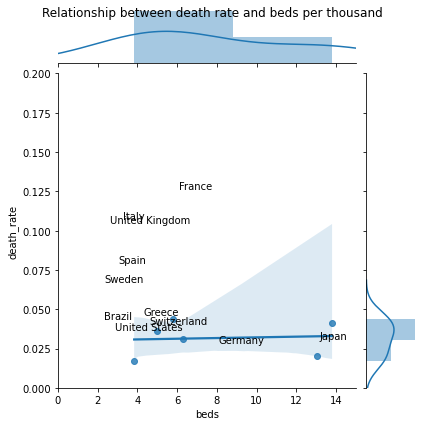

In [826]:
g = sns.jointplot(x='beds', y='death_rate', data=death_rate_gdp,
              kind="reg", dropna=True, ylim=(0,0.2), xlim=(0,15));
# g.ax_joint.set_xscale('log')

#indices to annotate
head = death_rate_gdp[death_rate_gdp.index.isin(['Japan', 'Brazil', 'United States', 'Switzerland', 'Spain', 'Germany', 'Sweden', 'Greece', 'Italy', 'France', 'United Kingdom'])]


def ann(row):
    ind = row[0]
    r = row[1]
    plt.gca().annotate(ind, xy=(r["beds"], r["death_rate"]), 
            xytext=(2,2) , textcoords ="offset points", )

for i in head.iterrows():
    ann(i)
#for row in tail.iterrows():
#    ann(row)

g.fig.suptitle("Relationship between death rate and beds per thousand")

plt.savefig('output/death_rate_beds' + '.png', format="PNG", dpi=300)
plt.show()

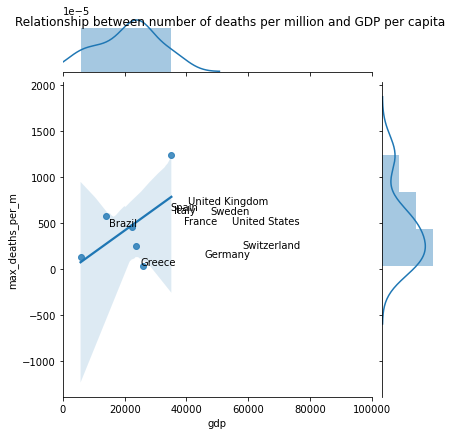

In [827]:
g = sns.jointplot(x='gdp', y='max_deaths_per_m', data=death_rate_gdp,
              kind="reg", dropna=True, xlim=(0,100000));
#g.ax_joint.set_xscale('log')

#indices to annotate
head = death_rate_gdp[death_rate_gdp.index.isin(['Brazil', 'United States', 'Switzerland', 'Spain', 'Germany', 'Sweden', 'Greece', 'Italy', 'France', 'United Kingdom'])]
        
def ann(row):
    ind = row[0]
    r = row[1]
    plt.gca().annotate(ind, xy=(r["gdp"], r["max_deaths_per_m"]), 
            xytext=(2,2) , textcoords ="offset points", )

for i in head.iterrows():
    ann(i)
#for row in tail.iterrows():
#    ann(row)

g.fig.suptitle("Relationship between number of deaths per million and GDP per capita")

plt.savefig('output/deaths_gdp' + '.png', format="PNG", dpi=300)
plt.show()

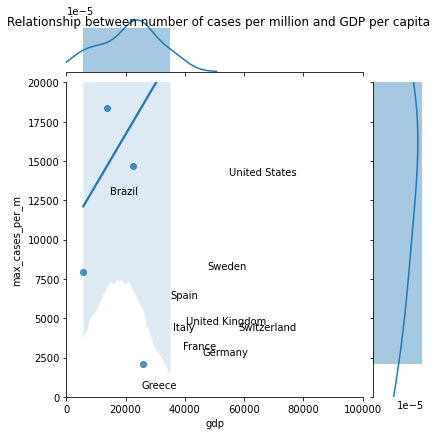

In [828]:
g = sns.jointplot(x='gdp', y='max_cases_per_m', data=death_rate_gdp,
              kind="reg", dropna=True, xlim=(0,100000), ylim=(0,20000));
#g.ax_joint.set_xscale('log')

#indices to annotate
head = death_rate_gdp[death_rate_gdp.index.isin(['Brazil', 'United States', 'Switzerland', 'Spain', 'Germany', 'Sweden', 'Greece', 'Italy', 'France', 'United Kingdom'])]
        
def ann(row):
    ind = row[0]
    r = row[1]
    plt.gca().annotate(ind, xy=(r["gdp"], r["max_cases_per_m"]), 
            xytext=(2,2) , textcoords ="offset points", )

for i in head.iterrows():
    ann(i)
#for row in tail.iterrows():
#    ann(row)

g.fig.suptitle("Relationship between number of cases per million and GDP per capita")

plt.savefig('output/cases_gdp' + '.png', format="PNG", dpi=300)
plt.show()

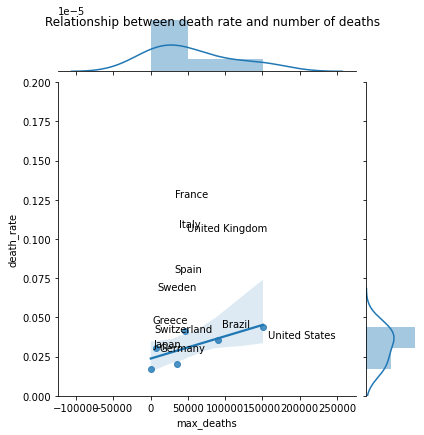

In [829]:
g = sns.jointplot(x='max_deaths', y='death_rate', data=death_rate_gdp,
              kind="reg", dropna=True, ylim=(0,0.2));
#g.ax_joint.set_xscale('log')

#indices to annotate
head = death_rate_gdp[death_rate_gdp.index.isin(['Japan', 'Brazil', 'United States', 'Switzerland', 'Spain', 'Germany', 'Sweden', 'Greece', 'Italy', 'France', 'United Kingdom'])]
        
def ann(row):
    ind = row[0]
    r = row[1]
    plt.gca().annotate(ind, xy=(r["max_deaths"], r["death_rate"]), 
            xytext=(2,2) , textcoords ="offset points", )

for i in head.iterrows():
    ann(i)
#for row in tail.iterrows():
#    ann(row)


g.fig.suptitle("Relationship between death rate and number of deaths")
plt.savefig('output/death_rate_deaths' + '.png', format="PNG", dpi=300)
plt.show()

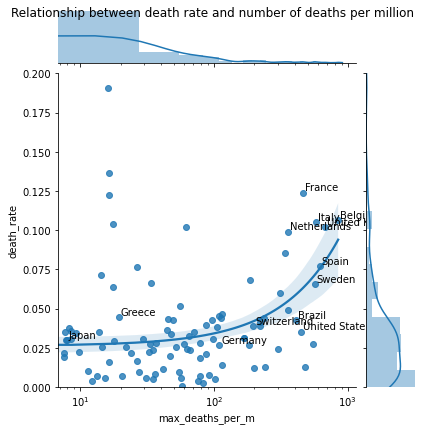

In [324]:


g = sns.jointplot(x='max_deaths_per_m', y='death_rate', data=death_rate_gdp,
              kind="reg", dropna=True, ylim=(0,0.2));
g.ax_joint.set_xscale('log')

#indices to annotate
head = death_rate_gdp[death_rate_gdp.index.isin(['Japan', 'Netherlands', 'Belgium', 'Brazil', 'United States', 'Switzerland', 'Spain', 'Germany', 'Sweden', 'Greece', 'Italy', 'France', 'United Kingdom'])]
        
def ann(row):
    ind = row[0]
    r = row[1]
    plt.gca().annotate(ind, xy=(r["max_deaths_per_m"], r["death_rate"]), 
            xytext=(2,2) , textcoords ="offset points", )

for i in head.iterrows():
    ann(i)
#for row in tail.iterrows():
#    ann(row)


g.fig.suptitle("Relationship between death rate and number of deaths per million")

plt.savefig('output/death_rate_deaths_per_m' + '.png', format="PNG", dpi=300)
plt.show()


In [297]:
countries = ['Japan', 'France']

head2 = mf[mf.date == '2020-05-01']
head2 = head2[head2.location.isin(countries)]
head2

,iso_code,continent,location,date,total_cases,new_cases,total_deaths,new_deaths,total_cases_per_million,new_cases_per_million,...,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,death_rate,ratio
10740,FRA,Europe,France,2020-05-01,129581.0,1139.0,24376.0,289.0,1985.200,17.450,...,NaN,86.06,4.77,30.1,35.6,NaN,5.98,82.66,0.188114,-0.323185
15661,JPN,Asia,Japan,2020-05-01,14281.0,193.0,432.0,17.0,112.914,1.526,...,NaN,79.37,5.72,11.2,33.7,NaN,13.05,84.63,0.030250,-0.346154


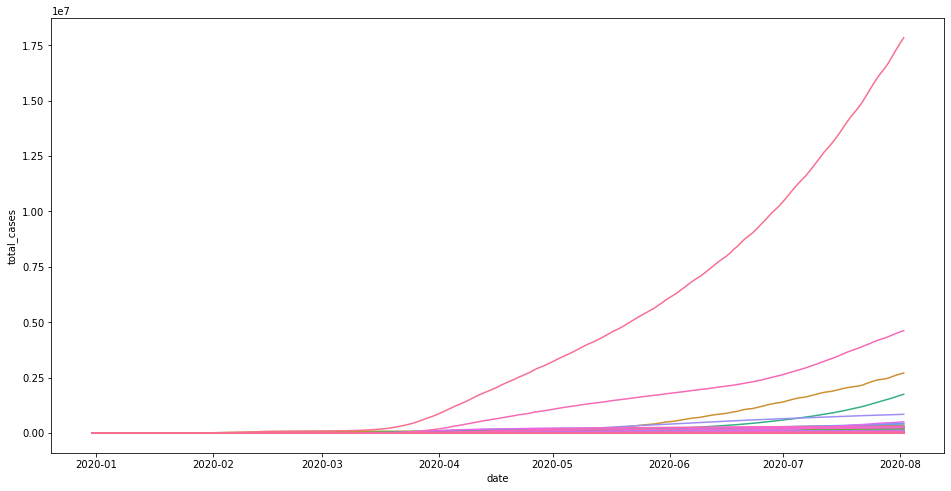

In [857]:
f, ax = plt.subplots(figsize=(16, 8))
ax = sns.lineplot(data=mf, x="date", y="total_cases", hue='location', estimator='mean', legend=None)

#ax.set(xlim=(10, 1000000))
#ax.set(ylim=(10, 100000))
#ax.set(xscale='log')
#ax.set(yscale='log')



plt.savefig('output/total_cases' + '.png', format="PNG", dpi=300)
plt.show()

#axplt.show()

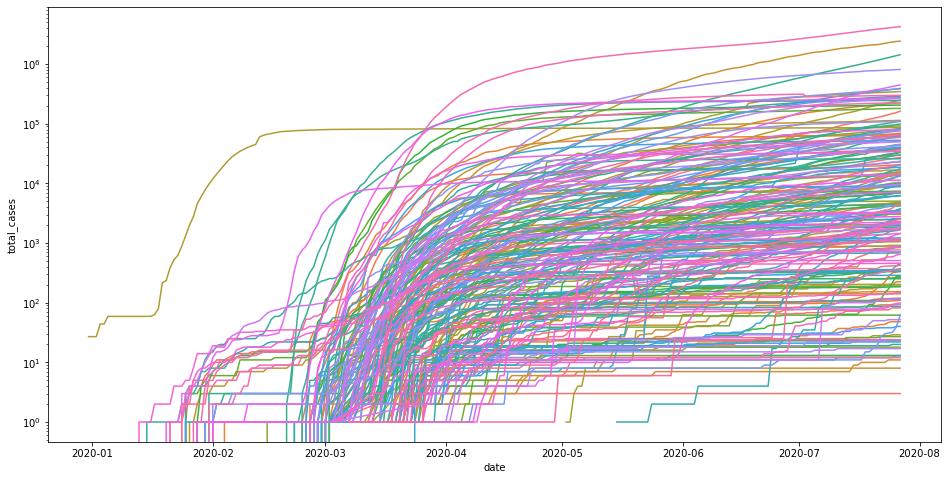

In [290]:
f, ax = plt.subplots(figsize=(16, 8))
ax = sns.lineplot(data=mf, x="date", y="total_cases", hue='location', estimator='mean', legend=None)

#ax.set(xlim=(10, 1000000))
#ax.set(ylim=(None, None))
#ax.set(xscale='log')
ax.set(yscale='log')

plt.savefig('output/total_cases_log' + '.png', format="PNG", dpi=300)
plt.show()

#axplt.show()

In [231]:
t = death_rate_gdp.sort_values(by=['death_rate'], ascending=[False]).head(10)
t

,death_rate,gdp,pop_density,max_deaths,max_deaths_per_m
location,,,,,
Yemen,0.190482,1479.147,53.508,479.0,16.060
Sint Maarten (Dutch part),0.171852,36327.232,1209.088,15.0,349.797
Sudan,0.136475,4466.507,23.258,717.0,16.351
France,0.124055,38605.671,122.578,30192.0,462.546
Nicaragua,0.122188,5321.444,51.667,108.0,16.303
British Virgin Islands,0.108904,NaN,207.973,1.0,33.072
Guyana,0.107126,7435.047,3.952,20.0,25.427
Belgium,0.106368,42658.576,375.564,9821.0,847.396
Italy,0.105182,35220.084,205.859,35107.0,580.647


In [246]:
t = death_rate_gdp.sort_values(by=['death_rate'], ascending=[True]).head(20)
t

,death_rate,gdp,pop_density,max_deaths,max_deaths_per_m,pop
location,,,,,,
Mongolia,0.000000,11840.846,1.980,0.0,0.000,3278292.0
Vietnam,0.000000,6171.884,308.127,0.0,0.000,97338583.0
Laos,0.000000,6397.360,29.715,0.0,0.000,7275556.0
Papua New Guinea,0.000000,3823.194,18.220,0.0,0.000,8947027.0
Cambodia,0.000000,3645.070,90.672,0.0,0.000,16718971.0
Eritrea,0.000000,1510.459,44.304,0.0,0.000,3546427.0
Timor,0.000000,6570.102,87.176,0.0,0.000,1318442.0
Uganda,0.000028,1697.707,213.759,2.0,0.044,45741000.0
Namibia,0.000358,9541.808,3.078,8.0,3.148,2540916.0


In [48]:
#collapse-hide
from IPython.display import display, Markdown

#display(Markdown('Data as of %s' % todays_date))

reported_mortality_rate = mf['new_deaths'].sum() / mf['new_cases'].sum()
#display(Markdown('Overall reported mortality rate: %.2f%%' % (100.0 * reported_mortality_rate)))

mf_highest = mf.sort_values('total_cases', ascending=False).head(15)
mortality_rate = pd.Series(
    data=(mf_highest['new_deaths']/mf_highest['new_cases']).values,
    index=map(lambda x: '%s (%i new_cases)' % (x, mf_highest.loc[x]['new_cases']),
              mf_highest.index))
ax = mortality_rate.plot.bar(
    figsize=(14,7), title='Reported Mortality Rate by Country (countries w/ highest case counts)')
ax.axhline(reported_mortality_rate, color='k', ls='--')

plt.show()

31387 (55993 new_cases)    0.008483
31386 (65498 new_cases)    0.013955
31385 (78427 new_cases)    0.016627
31384 (63196 new_cases)    0.016647
31383 (68848 new_cases)    0.016326
31382 (72048 new_cases)    0.016100
31381 (56750 new_cases)    0.006555
31380 (61796 new_cases)    0.006716
31379 (63749 new_cases)    0.013381
31378 (71494 new_cases)    0.012700
31377 (76930 new_cases)    0.012206
31376 (67717 new_cases)    0.014073
31375 (68518 new_cases)    0.012566
31374 (58114 new_cases)    0.006883
31373 (57258 new_cases)    0.006829
dtype: float64

In [ ]:
reported_mortality_rate = mf['new_deaths'].sum() / mf['new_cases'].sum()

mf_highest = mf.sort_values('total_cases', ascending=False).head(15)
mortality_rate = pd.Series(
    data=(mf_highest['total_deaths']/mf_highest['total_cases']).values,
    index=map(lambda x: '%s (%i new_cases)' % (x, mf_highest.loc[x]['new_cases']),
              mf_highest.index))


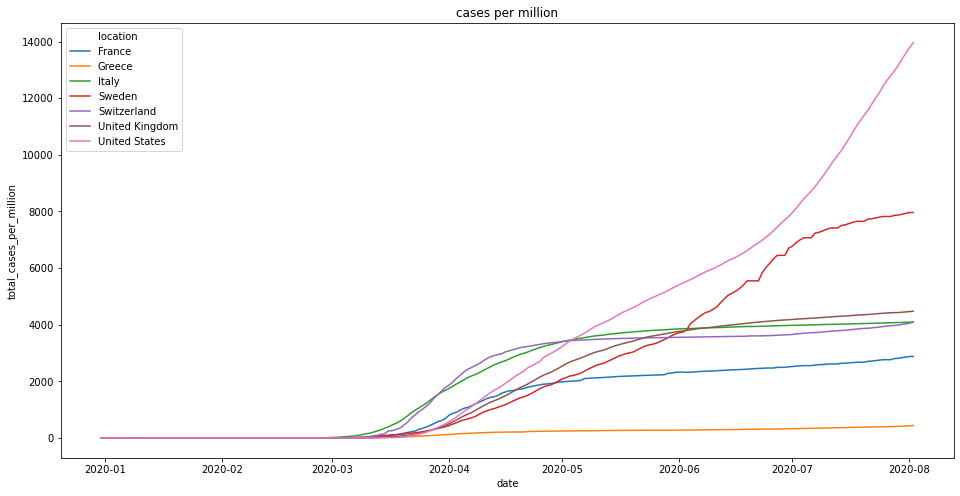

In [858]:
# comparison google index per country below
temp = mf[mf.location.isin(['United States', 'France', 'United Kingdom',
                             'Switzerland', 'Sweden', 'Greece', 'Italy'])]

f, ax = plt.subplots(figsize=(16, 8))
ax = sns.lineplot(data=temp, x="date", y="total_cases_per_million", hue='location')

#axis
#ax.set(xlim=(10, 1000000))
#ax.set(yscale='log')
plt.title('cases per million') 
plt.show()

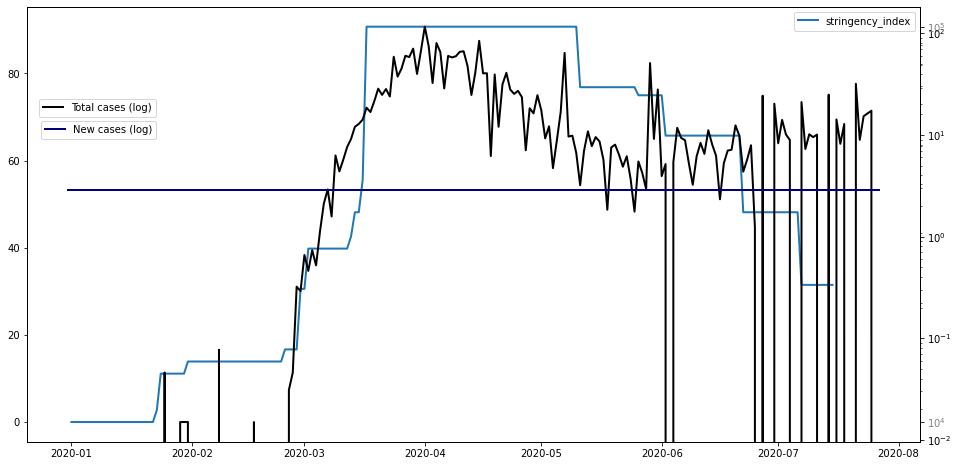

In [36]:
#Countries
temp = mf[mf.location.isin(['France'])]
temp.index = temp.date


#Indexes plot
f, ax = plt.subplots(figsize=(16, 8))
plt.plot('stringency_index', data=temp, marker='', color='tab:blue', linewidth=2)
plt.legend()
#plt.title('Gov indexes') 

#Total cases plot
ax2 = ax.twinx()
plt.plot('new_cases_per_million', data=temp, marker='', color='black', linewidth=2, label='Total cases (log)')
ax2.set(yscale='log')
plt.legend(bbox_to_anchor=(0.15, 0.8))

#New cases plot
ax3 = ax.twinx()
plt.plot('gdp_per_capita', data=temp, marker='', color='navy', linewidth=2, label='New cases (log)')
plt.legend(bbox_to_anchor=(0.15, 0.75))
ax3.set(yscale='log')
ax3.tick_params(axis='y', labelcolor='grey')
ax3.yaxis.set_label_coords(5.1, 0)
         
#ax.set(xlim=(10, 1000000))
#ax.set(ylim=(10, 100000))
#ax.set(xscale='log')
#ax.set(yscale='log')
#axplt.show()

In [12]:
# mf columns
df.dtypes

location                                         object
iso_code                                         object
date                                              int64
C1_School closing                               float64
C1_Flag                                         float64
C2_Workplace closing                            float64
C2_Flag                                         float64
C3_Cancel public events                         float64
C3_Flag                                         float64
C4_Restrictions on gatherings                   float64
C4_Flag                                         float64
C5_Close public transport                       float64
C5_Flag                                         float64
C6_Stay at home requirements                    float64
C6_Flag                                         float64
C7_Restrictions on internal movement            float64
C7_Flag                                         float64
C8_International travel controls                

In [991]:
# mf columns
gf.dtypes

iso_code                                                      object
continent                                                     object
location                                                      object
sub_region_1                                                  object
sub_region_2                                                  object
metro_area                                                    object
iso_3166_2_code                                               object
census_fips_code                                             float64
date                                                  datetime64[ns]
retail_and_recreation_percent_change_from_baseline           float64
grocery_and_pharmacy_percent_change_from_baseline            float64
parks_percent_change_from_baseline                           float64
transit_stations_percent_change_from_baseline                float64
workplaces_percent_change_from_baseline                      float64
residential_percent_change_from_ba

In [860]:
gf['iso_code'] = np.where((gf.location == 'Namibia'),'NA',gf.iso_code)
#gf[gf.location.isin(['Namibia'])]

In [990]:
# add continent to google database

# get all countries
iso_codes = np.asarray(gf["iso_code"])

# Continent codes to continent names
continents = {
    'NA': 'North America',
    'SA': 'South America', 
    'AS': 'Asia',
    'OC': 'Australia',
    'AF': 'Africa',
    'EU' : 'Europe',
    'na' : 'Others'
}

# Function for getting continent code for country
def iso_to_continent(iso_code):
    try:
        return pc.country_alpha2_to_continent_code(iso_code)
    except :
        return 'na'

# update database
gf.insert(1,"continent", [continents[iso_to_continent(iso_code)] for iso_code in iso_codes[:]])

ValueError: cannot insert continent, already exists

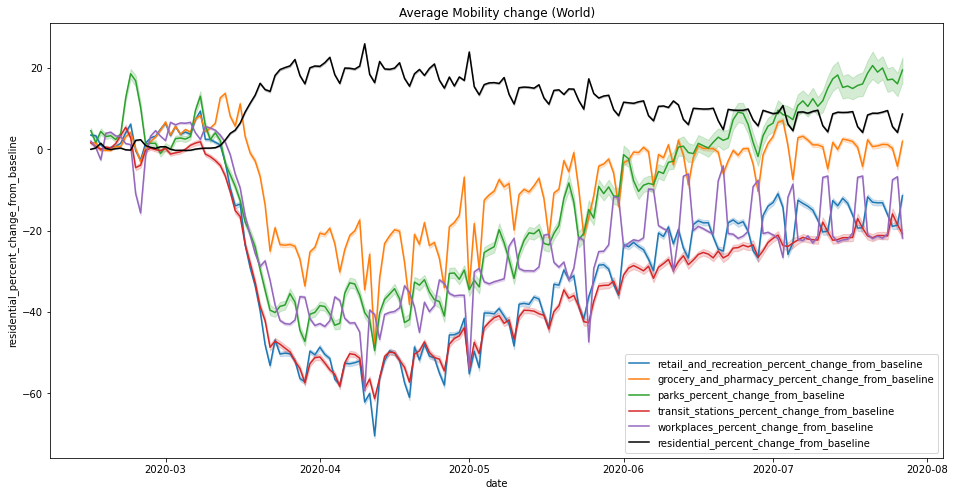

In [862]:
# Google indexes
f, ax = plt.subplots(figsize=(16, 8))
ax = sns.lineplot(data=gf, x="date", y="retail_and_recreation_percent_change_from_baseline", label='retail_and_recreation_percent_change_from_baseline')
ax = sns.lineplot(data=gf, x="date", y="grocery_and_pharmacy_percent_change_from_baseline", label='grocery_and_pharmacy_percent_change_from_baseline')
ax = sns.lineplot(data=gf, x="date", y="parks_percent_change_from_baseline", label='parks_percent_change_from_baseline')
ax = sns.lineplot(data=gf, x="date", y="transit_stations_percent_change_from_baseline", label='transit_stations_percent_change_from_baseline')
ax = sns.lineplot(data=gf, x="date", y="workplaces_percent_change_from_baseline", label='workplaces_percent_change_from_baseline')
ax = sns.lineplot(data=gf, x="date", y="residential_percent_change_from_baseline", label='residential_percent_change_from_baseline', color='black')

#ax.set(xlim=(10, 1000000))
#ax.set(xscale='log')
plt.title('Average Mobility change (World)')
plt.savefig('output/Google_indexes_World' + '.png', format="PNG", dpi=300)
plt.show()

In [ ]:
# # double plot

# country1 = 'United States'
# country2 = 'Switzerland'

# temp1 = gf[gf.location.isin([country1])]
# temp2 = gf[gf.location.isin([country2])]

# # Plot graphs
# fig = plt.figure(figsize=(10,10))
# ax1 = fig.add_subplot(211)
# ax1 = sns.lineplot(data=temp1, x="date", y="retail_and_recreation_percent_change_from_baseline", label='retail_and_recreation_percent_change_from_baseline')
# ax1 = sns.lineplot(data=temp1, x="date", y="grocery_and_pharmacy_percent_change_from_baseline", label='grocery_and_pharmacy_percent_change_from_baseline')
# ax1 = sns.lineplot(data=temp1, x="date", y="parks_percent_change_from_baseline", label='parks_percent_change_from_baseline')
# ax1 = sns.lineplot(data=temp1, x="date", y="transit_stations_percent_change_from_baseline", label='transit_stations_percent_change_from_baseline')
# ax1 = sns.lineplot(data=temp1, x="date", y="workplaces_percent_change_from_baseline", label='workplaces_percent_change_from_baseline')
# ax1 = sns.lineplot(data=temp1, x="date", y="residential_percent_change_from_baseline", label='residential_percent_change_from_baseline')
# ax1.set_ylabel('Indexes')
# ax1.set_ylim(-100,100)
# ax1.title.set_text(country1) 
# ax1.get_legend().remove()

# # Second graph
# ax2 = fig.add_subplot(212)
# ax2 = sns.lineplot(data=temp2, x="date", y="retail_and_recreation_percent_change_from_baseline", label='retail_and_recreation_percent_change_from_baseline')
# ax2 = sns.lineplot(data=temp2, x="date", y="grocery_and_pharmacy_percent_change_from_baseline", label='grocery_and_pharmacy_percent_change_from_baseline')
# ax2 = sns.lineplot(data=temp2, x="date", y="parks_percent_change_from_baseline", label='parks_percent_change_from_baseline')
# ax2 = sns.lineplot(data=temp2, x="date", y="transit_stations_percent_change_from_baseline", label='transit_stations_percent_change_from_baseline')
# ax2 = sns.lineplot(data=temp2, x="date", y="workplaces_percent_change_from_baseline", label='workplaces_percent_change_from_baseline')
# ax2 = sns.lineplot(data=temp2, x="date", y="residential_percent_change_from_baseline", label='residential_percent_change_from_baseline')
# ax2.set_ylim(-100,100)
# ax2.set_ylabel('Indexes')
# ax2.title.set_text(country2) 

# plt.legend(loc= 3, bbox_to_anchor=(0, -0.6))
# plt.show()

In [992]:
# List of continent present in the dataframe
continent = gf.continent.unique()
continent

array(['Asia', 'North America', 'Africa', 'South America', 'Europe',
       'Australia'], dtype=object)

In [740]:
# List of sub-regions
regions = gf.sub_region_1.unique()
len(regions)

1845

In [734]:
# check if every row has a continent
#gf[gf.continent.isin(['Others'])]

,iso_code,continent,location,sub_region_1,sub_region_2,iso_3166_2_code,census_fips_code,date,retail_and_recreation_percent_change_from_baseline,grocery_and_pharmacy_percent_change_from_baseline,parks_percent_change_from_baseline,transit_stations_percent_change_from_baseline,workplaces_percent_change_from_baseline,residential_percent_change_from_baseline


Asia


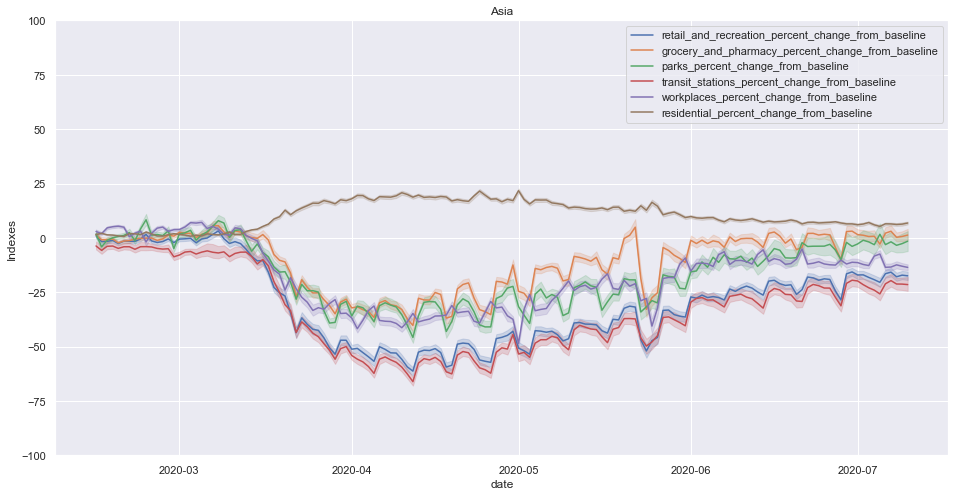

North America


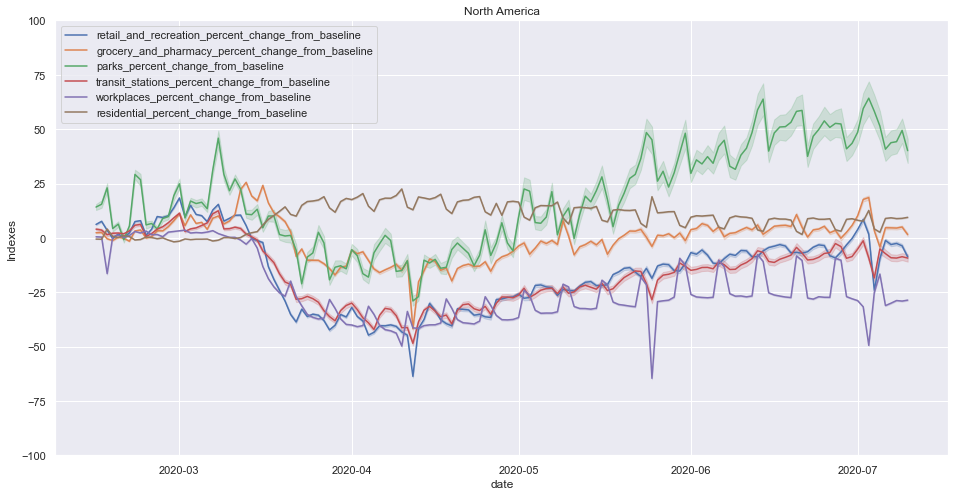

Africa


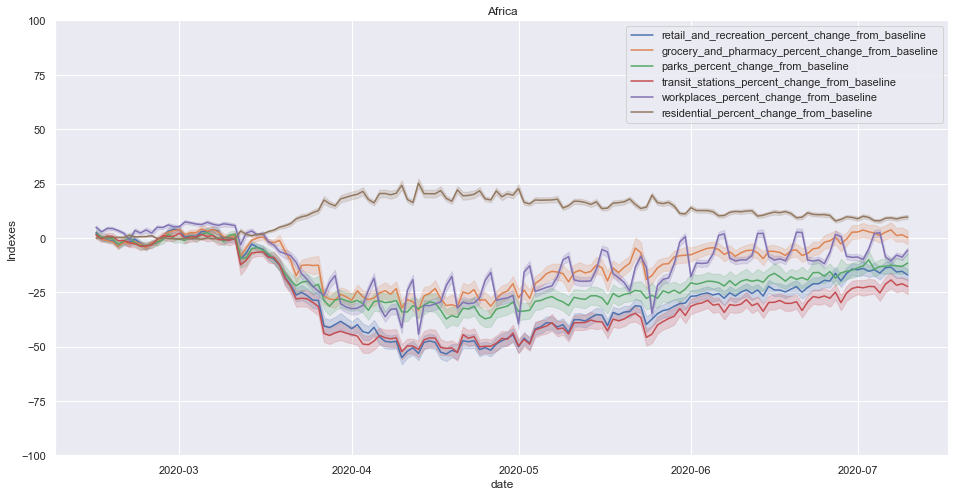

South America


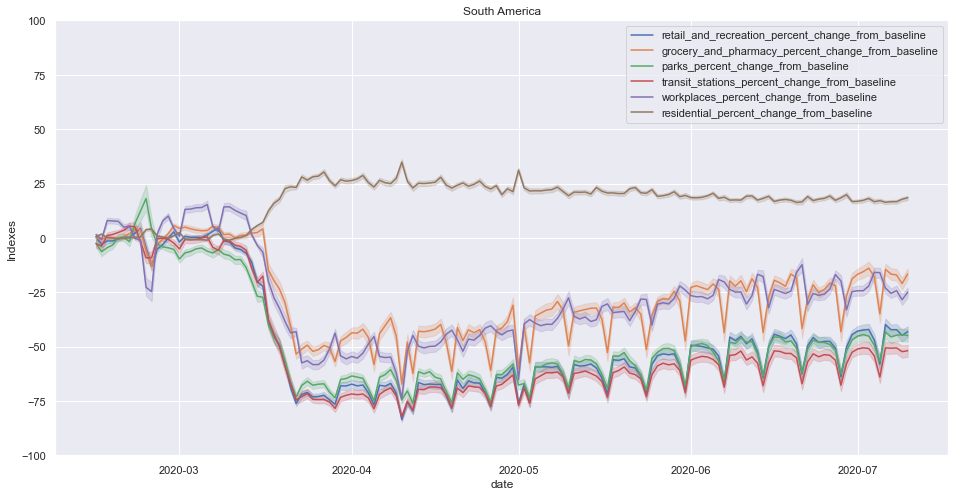

Europe


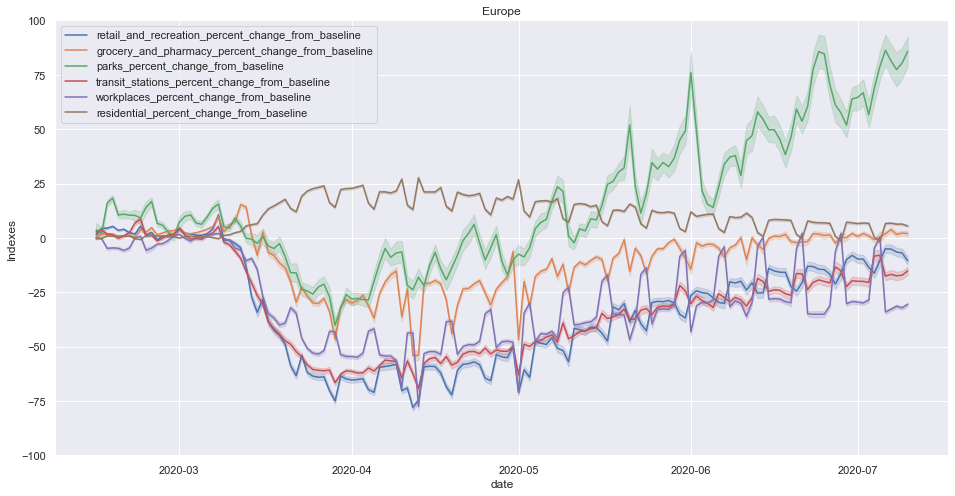

Australia


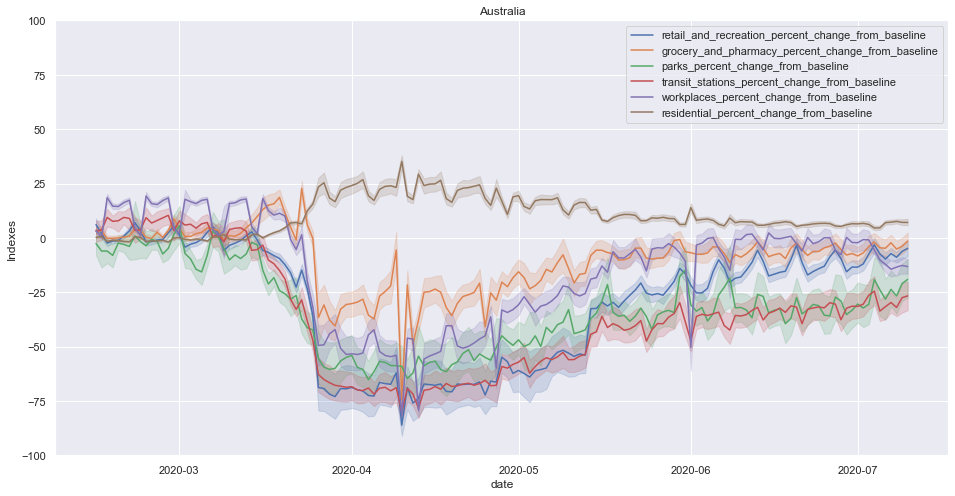

In [725]:
# google indexes per continent 
for i in continent:
    print(i)
    temp = []
    temp = gf[gf.continent.isin([i])]
    
    f, ax1 = plt.subplots(figsize=(16, 8))
    ax1 = sns.lineplot(data=temp, x="date", y="retail_and_recreation_percent_change_from_baseline", label='retail_and_recreation_percent_change_from_baseline')
    ax1 = sns.lineplot(data=temp, x="date", y="grocery_and_pharmacy_percent_change_from_baseline", label='grocery_and_pharmacy_percent_change_from_baseline')
    ax1 = sns.lineplot(data=temp, x="date", y="parks_percent_change_from_baseline", label='parks_percent_change_from_baseline')
    ax1 = sns.lineplot(data=temp, x="date", y="transit_stations_percent_change_from_baseline", label='transit_stations_percent_change_from_baseline')
    ax1 = sns.lineplot(data=temp, x="date", y="workplaces_percent_change_from_baseline", label='workplaces_percent_change_from_baseline')
    ax1 = sns.lineplot(data=temp, x="date", y="residential_percent_change_from_baseline", label='residential_percent_change_from_baseline')
    ax1.set_ylabel('Indexes')

    ax1.set_ylim(-100,100)
    ax1.title.set_text(i) 
    #ax1.get_legend().remove()
    #plt.legend(loc= 3, bbox_to_anchor=(0, -0.6))
    plt.show()

United States


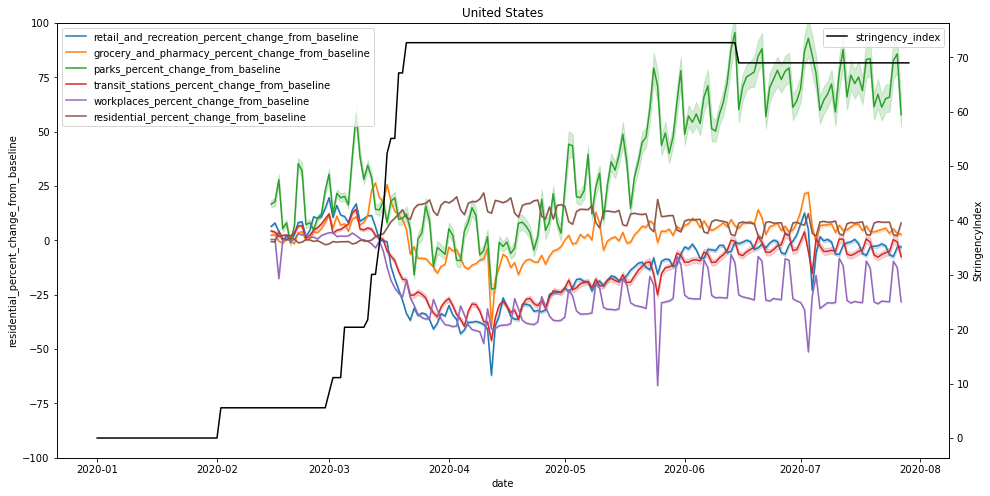

France


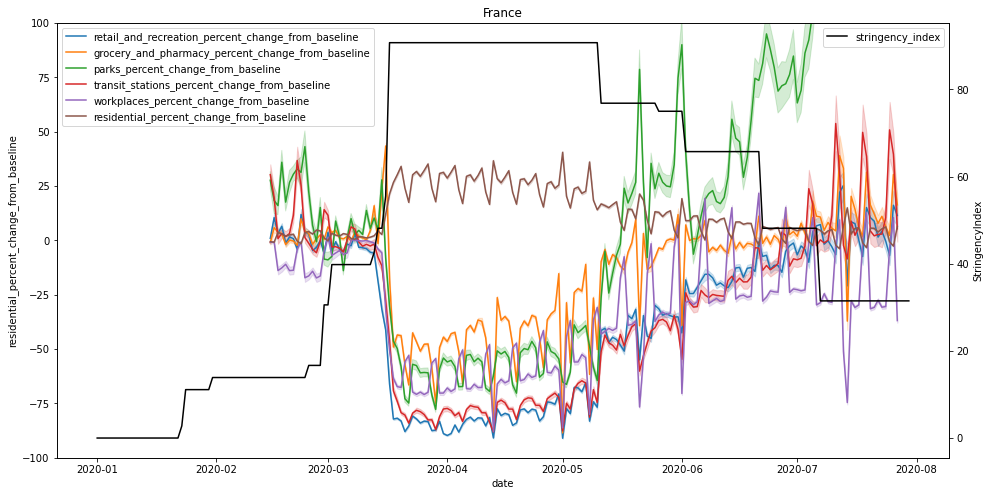

In [888]:
countries = ['United States', 'France']

for i in countries:
    print(i)
    temp = []
    
    temp2 = gf[gf.location.isin([i])]
    #temp2 = temp2[temp2['total_cases'] > 100]
    #temp2 = temp2[(temp2['date'] > '2020-01-01') & (temp2['date'] < '2020-05-30')]
    temp3 = df[df.location.isin([i])]
    
    f, ax = plt.subplots(figsize=(16, 8))
    ax1 = sns.lineplot(data=temp2, x="date", y="retail_and_recreation_percent_change_from_baseline", label='retail_and_recreation_percent_change_from_baseline')
    ax1 = sns.lineplot(data=temp2, x="date", y="grocery_and_pharmacy_percent_change_from_baseline", label='grocery_and_pharmacy_percent_change_from_baseline')
    ax1 = sns.lineplot(data=temp2, x="date", y="parks_percent_change_from_baseline", label='parks_percent_change_from_baseline')
    ax1 = sns.lineplot(data=temp2, x="date", y="transit_stations_percent_change_from_baseline", label='transit_stations_percent_change_from_baseline')
    ax1 = sns.lineplot(data=temp2, x="date", y="workplaces_percent_change_from_baseline", label='workplaces_percent_change_from_baseline')
    ax1 = sns.lineplot(data=temp2, x="date", y="residential_percent_change_from_baseline", label='residential_percent_change_from_baseline')
    ax.set(ylim=(-100, 100))
    plt.legend(loc=2)
    
    #Plot 2
    ax2 = ax.twinx()
    ax2 = sns.lineplot(data=temp3, x="date", y="StringencyIndex", label='stringency_index', color='black')
    #ax2.set(yscale='log')
    plt.legend(loc=1)
    
    #ax.set(xlim=(10, 1000000))
    #ax.set(xscale='log')
    plt.title(i)
    plt.savefig('output/Stringency_index_vs_mobility_indexes_' + i + '.png', format="PNG", dpi=300)
    plt.show()

Vaud


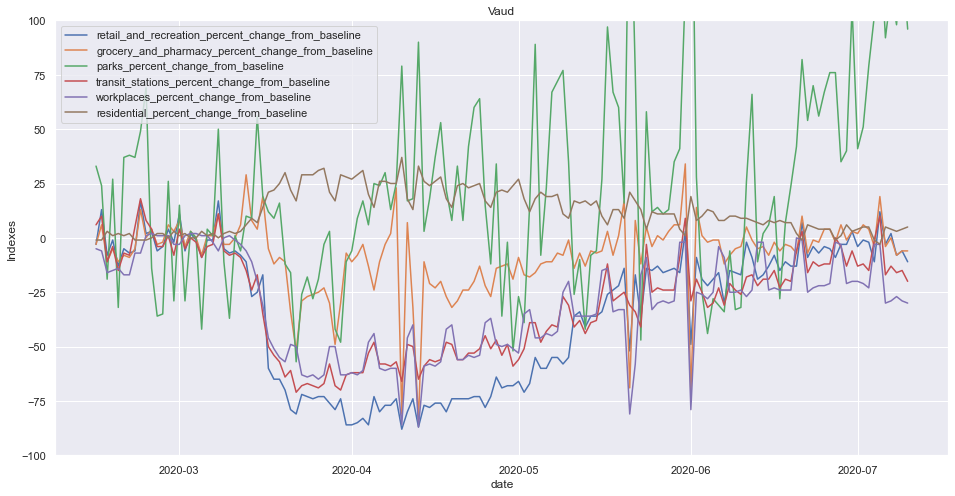

Lombardy


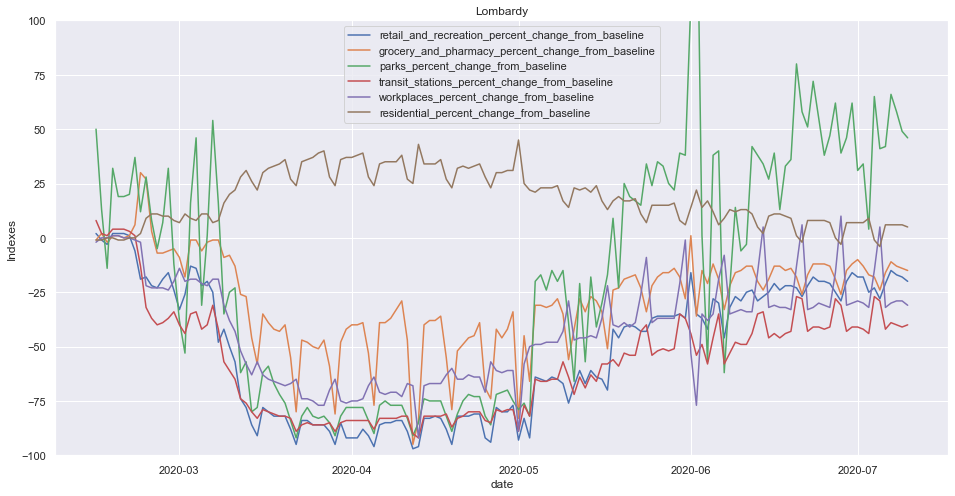

Lazio


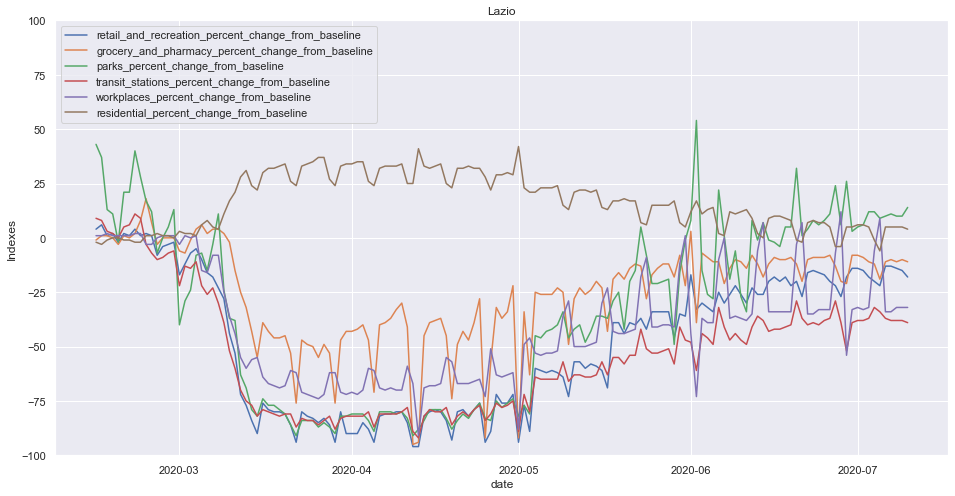

Veneto


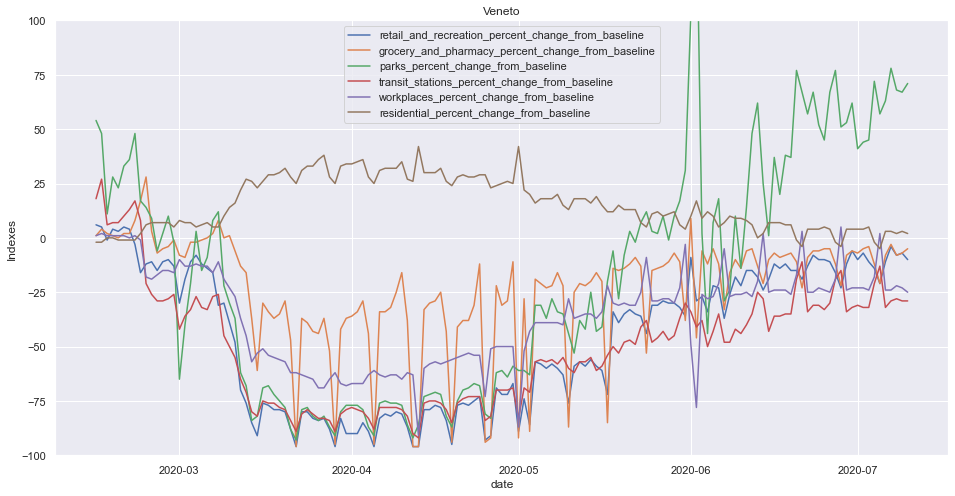

In [742]:
# google indexes per sub regions below
sub_region_1 = ['Vaud', 'Lombardy', 'Lazio', 'Veneto']

for i in sub_region_1:
    print(i)
    temp = []
    temp = gf[gf.sub_region_1.isin([i])]
    
    f, ax1 = plt.subplots(figsize=(16, 8))
    ax1 = sns.lineplot(data=temp, x="date", y="retail_and_recreation_percent_change_from_baseline", label='retail_and_recreation_percent_change_from_baseline')
    ax1 = sns.lineplot(data=temp, x="date", y="grocery_and_pharmacy_percent_change_from_baseline", label='grocery_and_pharmacy_percent_change_from_baseline')
    ax1 = sns.lineplot(data=temp, x="date", y="parks_percent_change_from_baseline", label='parks_percent_change_from_baseline')
    ax1 = sns.lineplot(data=temp, x="date", y="transit_stations_percent_change_from_baseline", label='transit_stations_percent_change_from_baseline')
    ax1 = sns.lineplot(data=temp, x="date", y="workplaces_percent_change_from_baseline", label='workplaces_percent_change_from_baseline')
    ax1 = sns.lineplot(data=temp, x="date", y="residential_percent_change_from_baseline", label='residential_percent_change_from_baseline')
    ax1.set_ylabel('Indexes')
    ax1.set_ylim(-100,100)
    ax1.title.set_text(i) 
    #ax1.get_legend().remove()
    #plt.legend(loc= 3, bbox_to_anchor=(0, -0.6))
    plt.savefig('output/Google_indexes_' + i + '.png', format="PNG", dpi=300)
    plt.show()

Bronx County


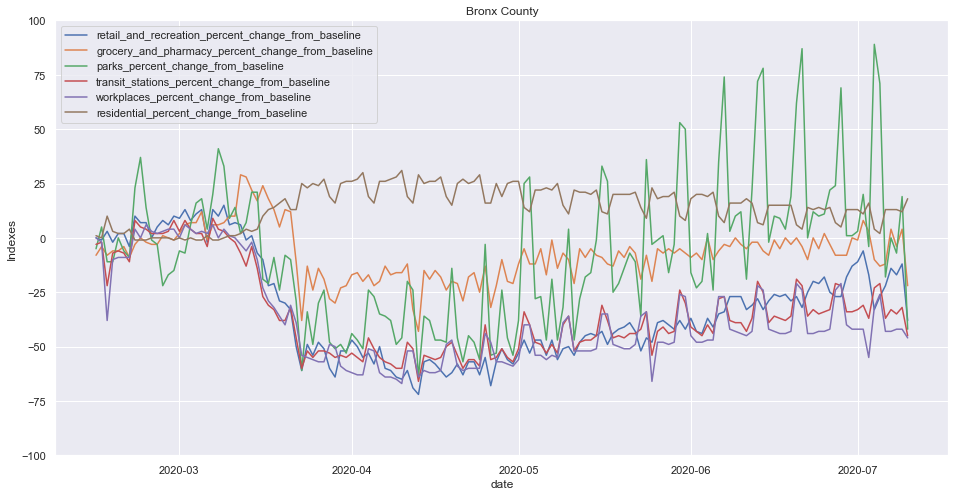

New York County


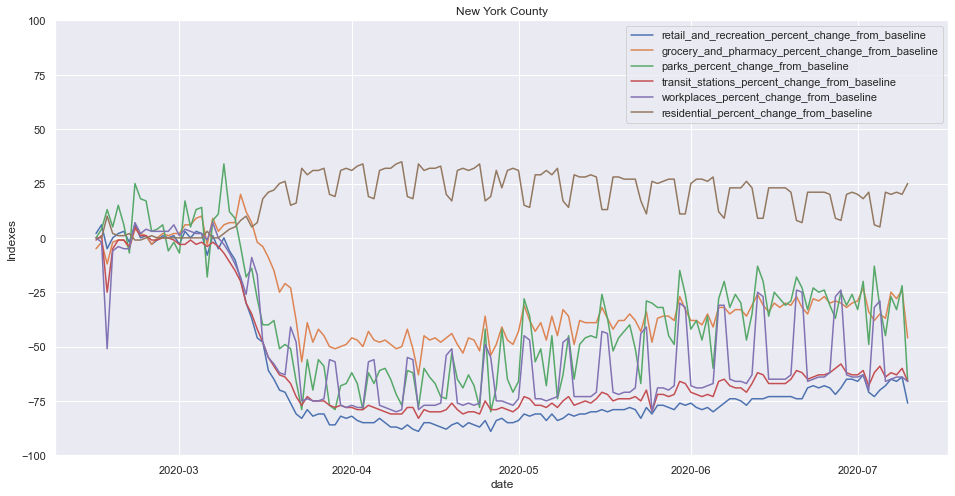

Salt Lake County


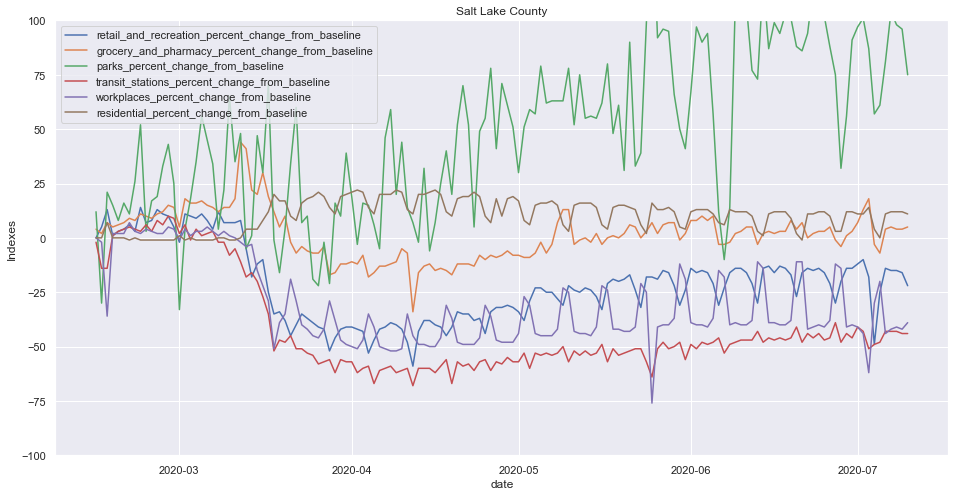

In [741]:
# google indexes per sub regions below
sub_region_2 = ['Bronx County', 'New York County', 'Salt Lake County']

for i in sub_region_2:
    print(i)
    temp = []
    temp = gf[gf.sub_region_2.isin([i])]
    
    f, ax1 = plt.subplots(figsize=(16, 8))
    ax1 = sns.lineplot(data=temp, x="date", y="retail_and_recreation_percent_change_from_baseline", label='retail_and_recreation_percent_change_from_baseline')
    ax1 = sns.lineplot(data=temp, x="date", y="grocery_and_pharmacy_percent_change_from_baseline", label='grocery_and_pharmacy_percent_change_from_baseline')
    ax1 = sns.lineplot(data=temp, x="date", y="parks_percent_change_from_baseline", label='parks_percent_change_from_baseline')
    ax1 = sns.lineplot(data=temp, x="date", y="transit_stations_percent_change_from_baseline", label='transit_stations_percent_change_from_baseline')
    ax1 = sns.lineplot(data=temp, x="date", y="workplaces_percent_change_from_baseline", label='workplaces_percent_change_from_baseline')
    ax1 = sns.lineplot(data=temp, x="date", y="residential_percent_change_from_baseline", label='residential_percent_change_from_baseline')
    ax1.set_ylabel('Indexes')
    ax1.set_ylim(-100,100)
    ax1.title.set_text(i) 
    #ax1.get_legend().remove()
    #plt.legend(loc= 3, bbox_to_anchor=(0, -0.6))
    plt.savefig('output/Google_indexes_' + i + '.png', format="PNG", dpi=300)
    plt.show()

In [4]:
#Import Apple latest database
#af_original = pd.read_csv('https://covid19-static.cdn-apple.com/covid19-mobility-data/2011HotfixDev17/v3/en-us/applemobilitytrends-2020-07-07.csv')
#af_original['date'] = pd.to_datetime(gf_original.date,format='%Y-%m-%d') 
#af = af_original

In [5]:
#Remove NaN values:
#df = df.replace(np.nan, '', regex=True)
#gf = gf.replace(np.nan, '', regex=True)

In [6]:
#gf.index = gf.date

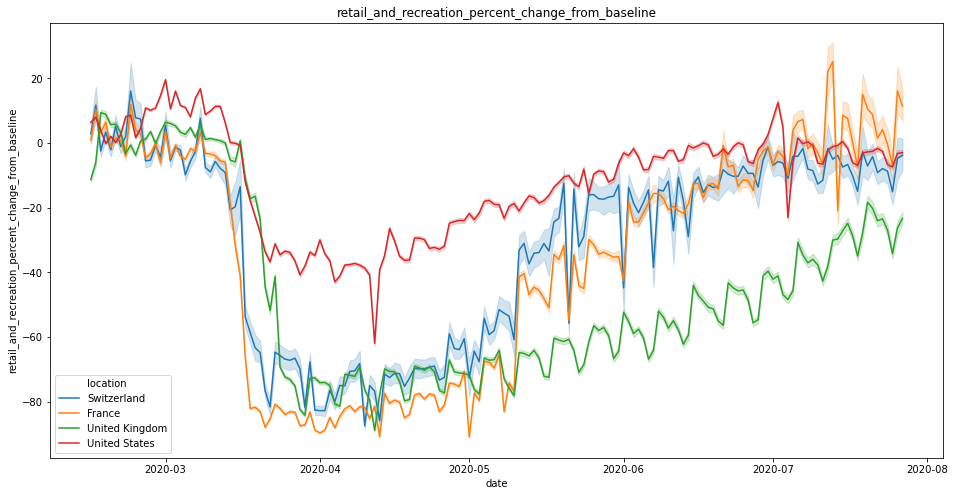

In [863]:
# comparison google index per country below
temp2 = gf[gf.location.isin(['United States', 'France', 'United Kingdom',
                             'Switzerland'])]

f, ax = plt.subplots(figsize=(16, 8))
ax = sns.lineplot(data=temp2, x="date", y="retail_and_recreation_percent_change_from_baseline", hue='location')

#axis
#ax.set(xlim=(10, 1000000))
#ax.set(xscale='log')
plt.title('retail_and_recreation_percent_change_from_baseline') 
plt.show()

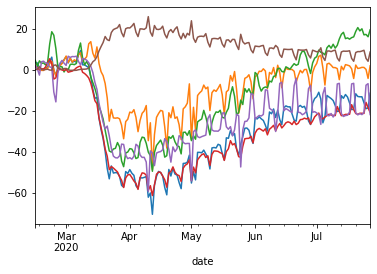

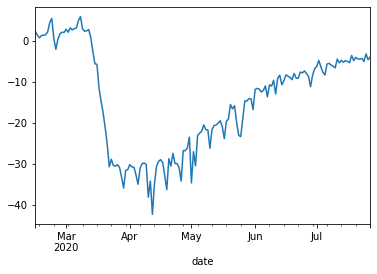

In [894]:
#Mean of all indexes
gf_mean = gf.groupby(['date']).mean()
gf_mean = gf_mean.drop(columns=['census_fips_code'])

# mean of means
gf_mean2 = gf_mean.mean(1)
gf_mean2 = pd.DataFrame(gf_mean2)
gf_mean2 = gf_mean2.rename(columns={0: "index_mean"})

# dataframe with means
gf_mean = pd.DataFrame(gf_mean)

# plots
gf_mean.plot().get_legend().remove()
gf_mean2.plot().get_legend().remove()

In [864]:
#Check duplicates
x = mf.location.unique()
y = df.location.unique()

def list_diff(list1, list2): 
	return (list(set(list1) - set(list2))) 

# Run Test
print(list_diff(x, y))

['New Caledonia', 'Kyrgyzstan', 'Slovakia', 'Macedonia', 'Faeroe Islands', 'Bonaire Sint Eustatius and Saba', 'Curacao', 'Timor', 'British Virgin Islands', 'Monaco', 'Swaziland', 'Grenada', 'Turks and Caicos Islands', 'Jersey', 'Sint Maarten (Dutch part)', 'International', 'Guernsey', 'Western Sahara', 'Antigua and Barbuda', 'United States Virgin Islands', 'Saint Vincent and the Grenadines', 'Maldives', 'Sao Tome and Principe', 'Liechtenstein', 'Vatican', 'Cayman Islands', 'Montserrat', 'Isle of Man', 'World', 'Malta', 'Montenegro', 'Guinea-Bissau', 'French Polynesia', 'Falkland Islands', 'Northern Mariana Islands', 'Comoros', 'Bahamas', 'Equatorial Guinea', 'Saint Lucia', 'Saint Kitts and Nevis', 'Armenia']


In [865]:
#Delete 'International' and 'World' entries
mf.drop(mf[mf.location == 'World'].index, inplace=True)
mf.drop(mf[mf.location == 'International'].index, inplace=True)

#Check
mf[mf.location.isin(['International', 'World'])]

,iso_code,continent,location,date,total_cases,new_cases,total_deaths,new_deaths,total_cases_per_million,new_cases_per_million,...,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,test,death_rate,ratio


In [19]:
#Death rate
df['death_rate'] = df.ConfirmedDeaths / df.ConfirmedCases

AttributeError: 'DataFrame' object has no attribute 'ConfirmedDeaths'

In [24]:
# Describe all coumns
with pd.option_context('display.max_columns', 40):
    print(mf.describe(include='all'))

       iso_code continent location                 date   total_cases  \
count     29751     29751    29751                29751  2.944000e+04   
unique      210         6      210                  196           NaN   
top         ISL    Europe  Belarus  2020-07-04 00:00:00           NaN   
freq        196      8297      196                  210           NaN   
first       NaN       NaN      NaN  2019-12-31 00:00:00           NaN   
last        NaN       NaN      NaN  2020-07-13 00:00:00           NaN   
mean        NaN       NaN      NaN                  NaN  2.050184e+04   
std         NaN       NaN      NaN                  NaN  1.241690e+05   
min         NaN       NaN      NaN                  NaN  0.000000e+00   
25%         NaN       NaN      NaN                  NaN  1.800000e+01   
50%         NaN       NaN      NaN                  NaN  3.240000e+02   
75%         NaN       NaN      NaN                  NaN  3.591750e+03   
max         NaN       NaN      NaN                 

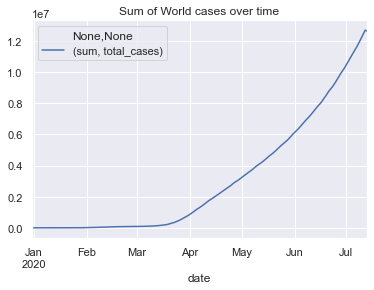

In [536]:
#Sum of World cases
mf_pivot = pd.pivot_table(mf,index=["date"], values=["total_cases"],aggfunc=[np.sum])
mf_pivot.plot(title='Sum of World cases over time')

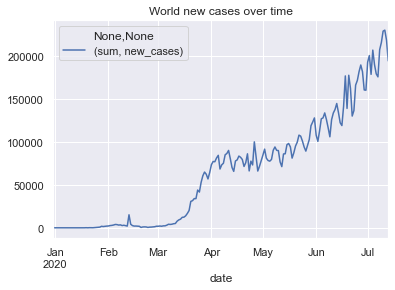

In [537]:
#Sum of cases
mf_pivot2 = pd.pivot_table(mf,index=["date"], values=["new_cases"],aggfunc=[np.sum])
mf_pivot2.plot(title='World new cases over time')

In [27]:
#how to create an index
df.index = df.Date

In [28]:
#how to create a sub dataframe
#mf2 = mf[["date", "location", "total_cases"]]

In [29]:
#how to filter values
#temp_df = df[["Date", "CountryName", "C7_Restrictions on internal movement"]]
#temp_df = temp_df[temp_df.CountryName == 'United States']
#temp_df.tail()

In [31]:
#Countries
#mf.location.unique()

In [422]:
#correlations
mf_corr = mf.drop(['death_rate_per_m', 'test', 'ratio'], axis=1)
mf_corr = mf_corr.corr()
mf_corr

,total_cases,new_cases,total_deaths,new_deaths,total_cases_per_million,new_cases_per_million,total_deaths_per_million,new_deaths_per_million,new_tests,total_tests,...,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,death_rate
total_cases,1.000000,0.892820,0.910986,0.596913,0.240417,0.164842,0.257231,0.108416,0.935383,0.919956,...,0.094673,-0.079904,-0.076028,0.031996,0.070377,-0.049255,0.061529,-0.003416,0.065302,0.072901
new_cases,0.892820,1.000000,0.762154,0.719120,0.181457,0.217584,0.161145,0.138731,0.872281,0.794803,...,0.063217,-0.066792,-0.060152,0.039790,0.036779,-0.065243,0.052882,-0.027582,0.037800,0.032936
total_deaths,0.910986,0.762154,1.000000,0.620434,0.219358,0.121602,0.406892,0.135669,0.827341,0.806650,...,0.119642,-0.097869,-0.138739,-0.004099,0.124706,-0.077702,0.097388,-0.002999,0.113412,0.201575
new_deaths,0.596913,0.719120,0.620434,1.000000,0.129533,0.157973,0.201451,0.316176,0.544945,0.414181,...,0.076639,-0.085892,-0.109289,0.013988,0.075394,-0.083746,0.097221,-0.025341,0.077241,0.130582
total_cases_per_million,0.240417,0.181457,0.219358,0.129533,1.000000,0.436938,0.574493,0.165212,0.186709,0.217989,...,0.383745,-0.197469,-0.190594,0.069334,0.098321,-0.049186,0.208295,0.026434,0.250416,0.039376
new_cases_per_million,0.164842,0.217584,0.121602,0.157973,0.436938,1.000000,0.163483,0.235978,0.149501,0.142461,...,0.255965,-0.136007,-0.119384,0.095592,0.014813,-0.037696,0.165886,-0.014335,0.124136,-0.038310
total_deaths_per_million,0.257231,0.161145,0.406892,0.201451,0.574493,0.163483,1.000000,0.243741,0.269155,0.304781,...,0.257285,-0.172692,-0.263370,-0.095161,0.291798,-0.083854,0.195180,0.067482,0.277947,0.375801
new_deaths_per_million,0.108416,0.138731,0.135669,0.316176,0.165212,0.235978,0.243741,1.000000,0.116706,0.078051,...,0.102912,-0.118770,-0.144548,-0.038998,0.142767,-0.055971,0.113481,0.018032,0.115448,0.139967
new_tests,0.935383,0.872281,0.827341,0.544945,0.186709,0.149501,0.269155,0.116706,1.000000,0.949181,...,0.116307,-0.067210,0.035314,0.109089,0.067577,0.015902,0.023566,0.009618,0.017932,0.101908
total_tests,0.919956,0.794803,0.806650,0.414181,0.217989,0.142461,0.304781,0.078051,0.949181,1.000000,...,0.113145,-0.064741,0.026983,0.088286,0.072082,0.019243,0.019724,0.022535,0.028001,0.111594


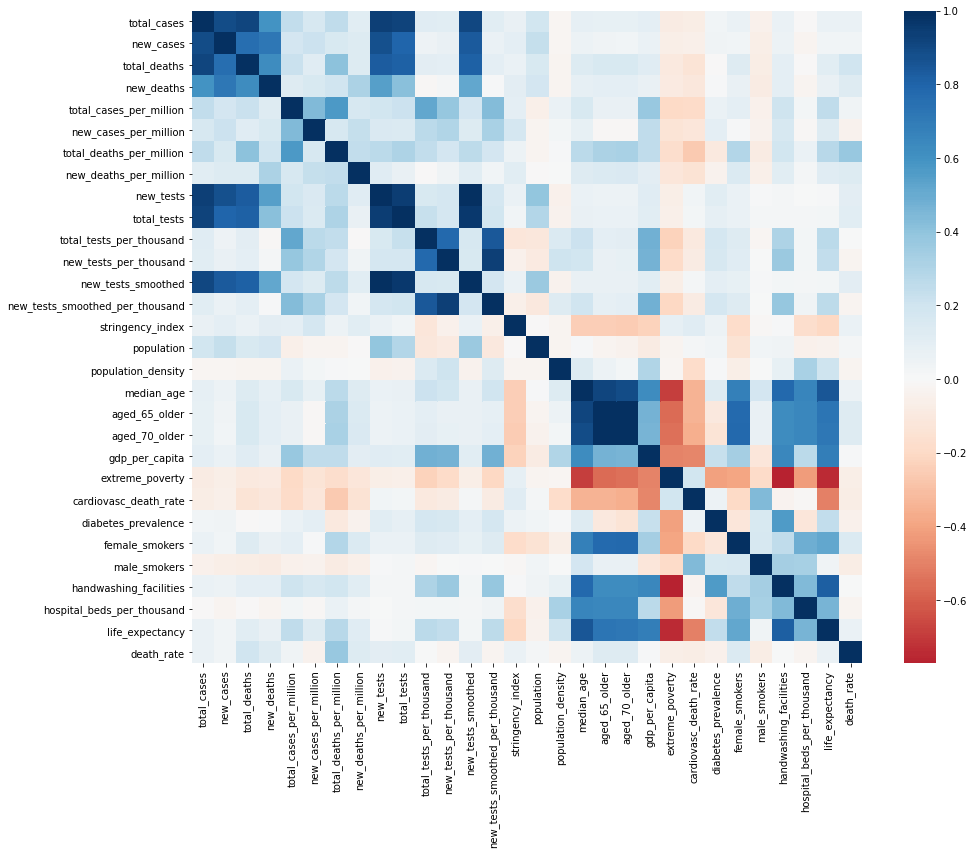

In [428]:
#corr heat map
fig, ax = plt.subplots(figsize=(15,12))
sns.heatmap(mf_corr, center=0, cmap="RdBu", ax=ax)
plt.savefig('output/Corr_' + '.png', format="PNG", dpi=300, bbox_inches='tight')
plt.show()

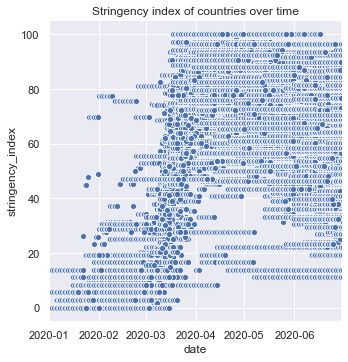

In [34]:
#Stringency index of countries over time
ax = sns.set()
ax = sns.relplot(x="date", y="stringency_index", data=mf)

#Range
dstart = datetime.datetime(2020,1,1)
dend = datetime.datetime(2020,6,30)
ax.set(xlim=(dstart, dend))

plt.title('Stringency index of countries over time') 
plt.show()

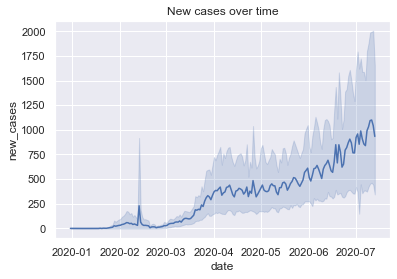

In [35]:
#New cases
sns.lineplot(data=mf, x="date", y="new_cases")

#Range
dstart = datetime.datetime(2020,1,1)
dend = datetime.datetime(2020,6,30)
ax.set(xlim=(dstart, dend))

plt.title('New cases over time') 
plt.show()

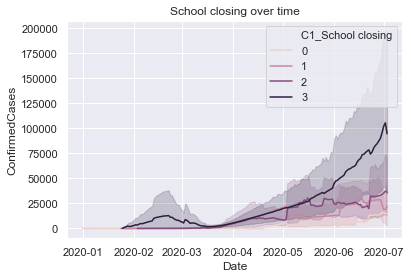

In [36]:
sns.lineplot(data=df, x="Date", y="ConfirmedCases", hue='C1_School closing')
plt.title('School closing over time') 

plt.show()

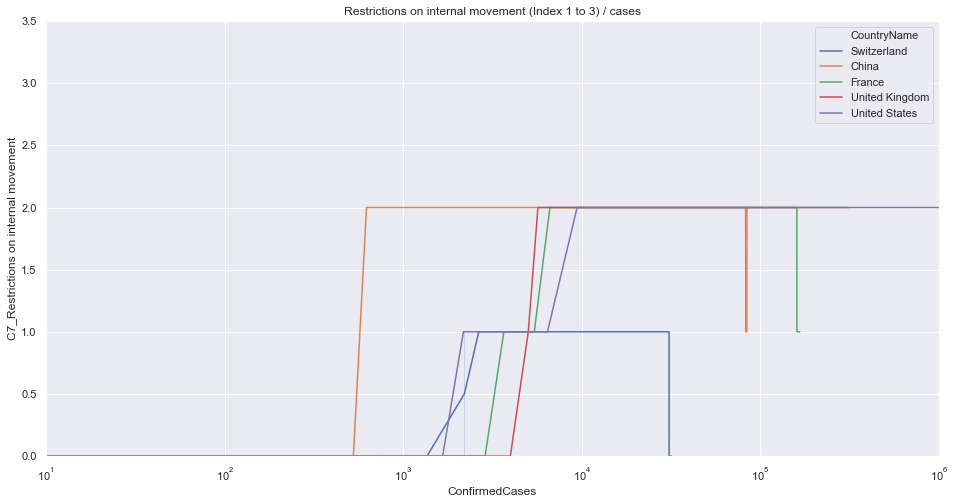

In [37]:
f, ax = plt.subplots(figsize=(16, 8))
df2 = df[df.CountryName.isin(['United States', 'France', 'United Kingdom', 'Switzerland', 'China'])]
ax = sns.lineplot(data=df2, x="ConfirmedCases", y="C7_Restrictions on internal movement", hue='CountryName')

#axes limit
ax.set(xlim=(10, 1000000))
ax.set(ylim=(0, 3.5))

#scale
ax.set(xscale='log')

plt.title('Restrictions on internal movement (Index 1 to 3) / cases') 
plt.show()

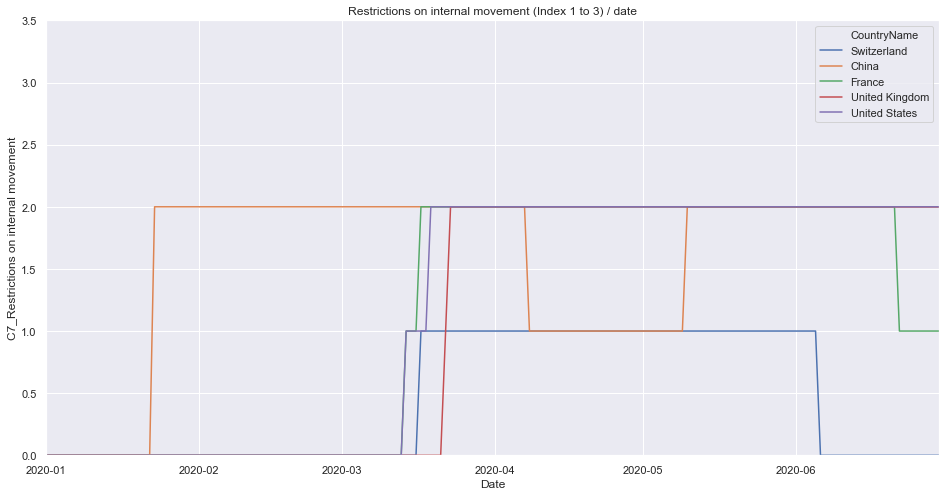

In [38]:
f, ax = plt.subplots(figsize=(16, 8))
df2 = df[df.CountryName.isin(['United States', 'France', 'United Kingdom', 'Switzerland', 'China'])]
ax = sns.lineplot(data=df2, x="Date", y="C7_Restrictions on internal movement", hue='CountryName')

#axis
ax.set(ylim=(0, 3.5))
#ax.set(xlim=(10, 1000000))
#ax.set(xscale='log')

#Range
dstart = datetime.datetime(2020,1,1)
dend = datetime.datetime(2020,6,30)
ax.set(xlim=(dstart, dend))

plt.title('Restrictions on internal movement (Index 1 to 3) / date')
plt.show()

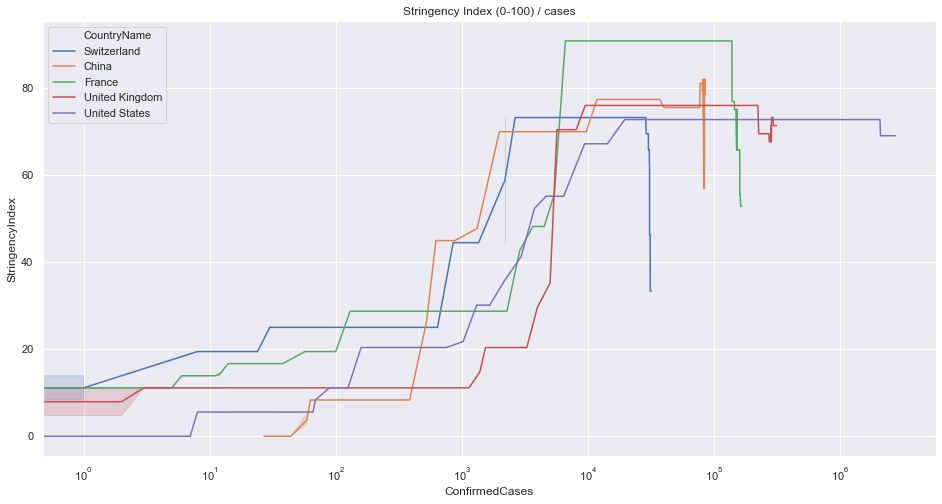

In [39]:
f, ax = plt.subplots(figsize=(16, 8))
df2 = df[df.CountryName.isin(['United States', 'France', 'United Kingdom', 'Switzerland', 'China'])]
ax = sns.lineplot(data=df2, x="ConfirmedCases", y="StringencyIndex", hue='CountryName')

#axes limit
#ax.set(xlim=(10, 1000000))
#ax.set(ylim=(0, 3.5))

#scale
ax.set(xscale='log')

plt.title('Stringency Index (0-100) / cases') 
plt.show()

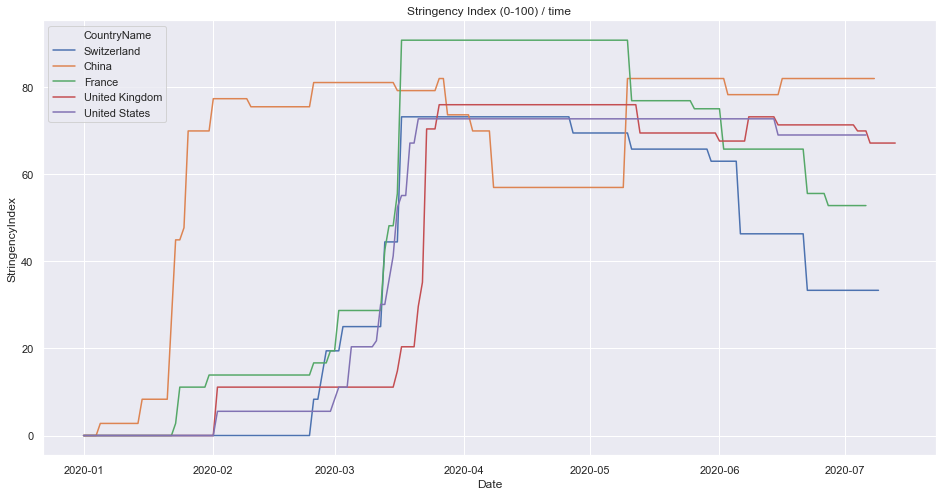

In [40]:
f, ax = plt.subplots(figsize=(16, 8))
df2 = df[df.CountryName.isin(['United States', 'France', 'United Kingdom', 'Switzerland', 'China'])]
ax = sns.lineplot(data=df2, x="Date", y="StringencyIndex", hue='CountryName')

#axes limit
#ax.set(xlim=(10, 1000000))
#ax.set(ylim=(0, 3.5))

#scale
#ax.set(xscale='log')

plt.title('Stringency Index (0-100) / time') 
plt.show()

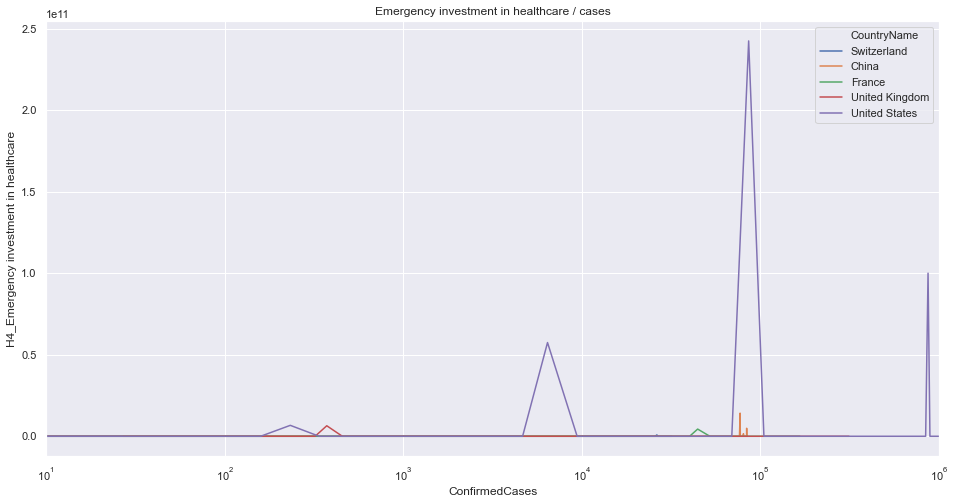

In [41]:
f, ax = plt.subplots(figsize=(16, 8))
df2 = df[df.CountryName.isin(['United States', 'France', 'United Kingdom', 'Switzerland', 'China'])]
ax = sns.lineplot(data=df2, x="ConfirmedCases", y="H4_Emergency investment in healthcare", hue='CountryName')

#axis
ax.set(xlim=(10, 1000000))
ax.set(xscale='log')

plt.title('Emergency investment in healthcare / cases') 
plt.show()

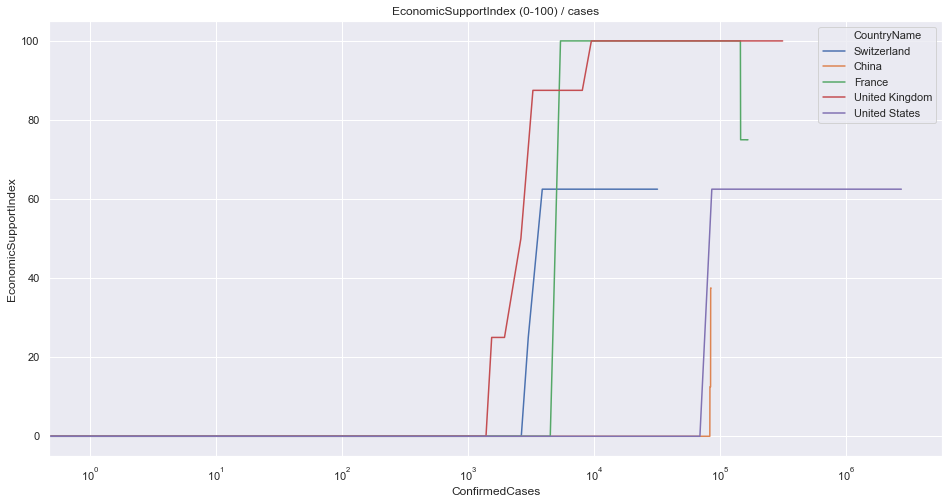

In [42]:
f, ax = plt.subplots(figsize=(16, 8))
df2 = df[df.CountryName.isin(['United States', 'France', 'United Kingdom', 'Switzerland', 'China'])]
ax = sns.lineplot(data=df2, x="ConfirmedCases", y="EconomicSupportIndex", hue='CountryName')

#axis
#ax.set(xlim=(10, 1000000))
ax.set(xscale='log')

plt.title('EconomicSupportIndex (0-100) / cases') 
plt.show()

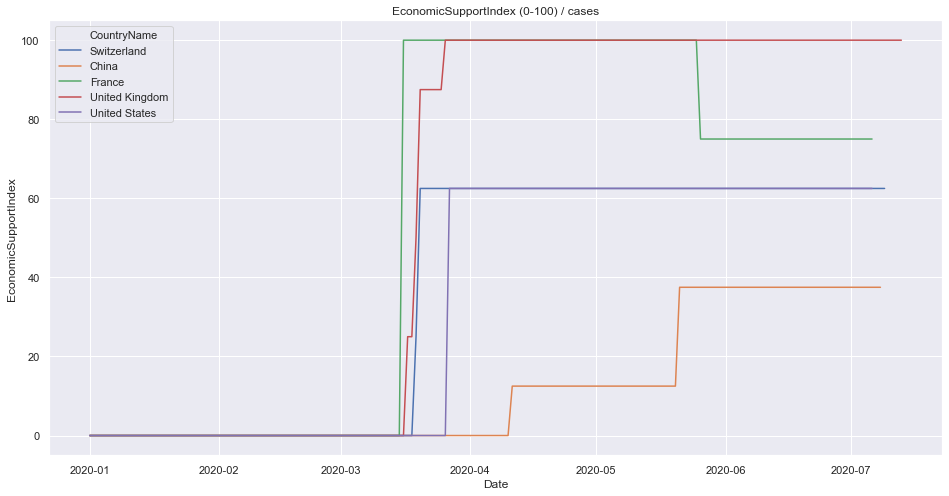

In [43]:
f, ax = plt.subplots(figsize=(16, 8))
df2 = df[df.CountryName.isin(['United States', 'France', 'United Kingdom', 'Switzerland', 'China'])]
ax = sns.lineplot(data=df2, x="Date", y="EconomicSupportIndex", hue='CountryName')

#axis
#ax.set(xlim=(10, 1000000))
#ax.set(xscale='log')

plt.title('EconomicSupportIndex (0-100) / cases') 
plt.show()

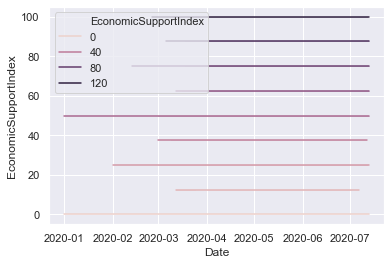

In [44]:
sns.lineplot(data=df, x="Date", y="EconomicSupportIndex", hue='EconomicSupportIndex')
plt.show()

[(10, 10000000)]

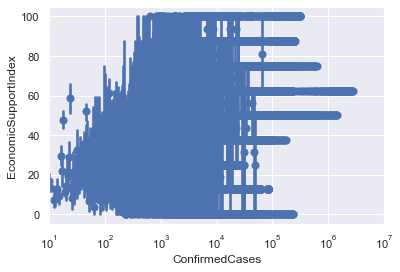

In [45]:
splot = sns.regplot(x="ConfirmedCases", y="EconomicSupportIndex", 
                    data=df, fit_reg=False, x_estimator=np.mean)
splot.set(xscale="log")

# control x and y limits
splot.set(xlim=(10, 10000000))
#splot.set(ylim=(0, 2000))

#sns.plt.show()

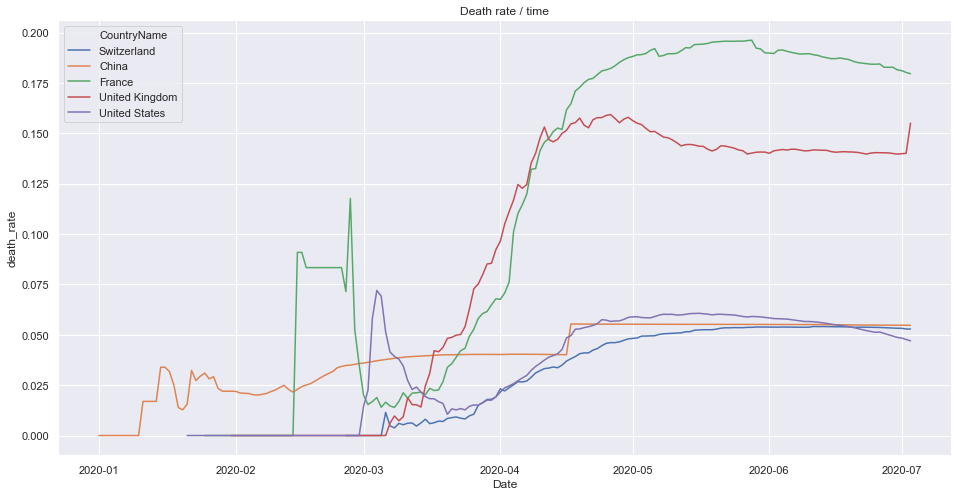

In [46]:
f, ax = plt.subplots(figsize=(16, 8))
df2 = df[df.CountryName.isin(['United States', 'France', 'United Kingdom', 'Switzerland', 'China'])]
ax = sns.lineplot(data=df2, x="Date", y="death_rate", hue='CountryName')

#axis
#ax.set(xlim=(10, 1000000))
#ax.set(xscale='log')

plt.title('Death rate / time') 
plt.show()

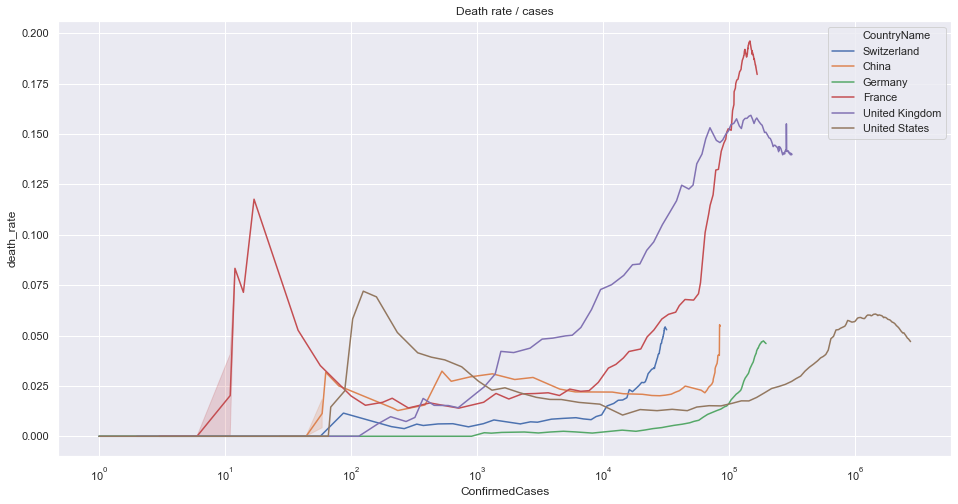

In [47]:
f, ax = plt.subplots(figsize=(16, 8))
df2 = df[df.CountryName.isin(['Germany','United States', 'France', 'United Kingdom', 'Switzerland', 'China'])]
ax = sns.lineplot(data=df2, x="ConfirmedCases", y="death_rate", hue='CountryName', estimator='mean')

#axis
ax.set(xscale='log')

plt.title('Death rate / cases') 
plt.show()

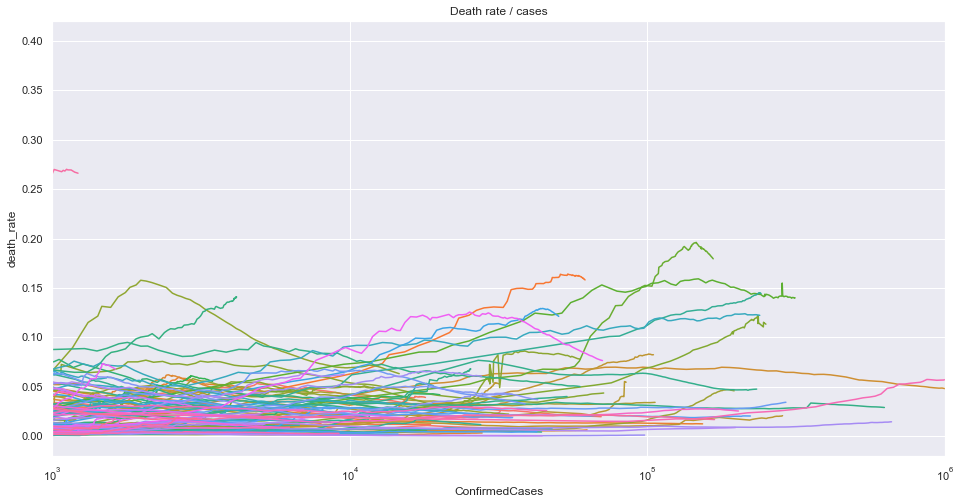

In [83]:
f, ax = plt.subplots(figsize=(16, 8))
df2 = df[df.CountryName.isin(['United States', 'France', 'United Kingdom', 'Switzerland', 'China'])]
ax = sns.lineplot(data=df, x="ConfirmedCases", y="death_rate", hue='CountryName', estimator='mean', legend=None)

#axis
ax.set(xscale='log')
ax.set(xlim=(1000, 1000000))

plt.title('Death rate / cases') 
plt.show()

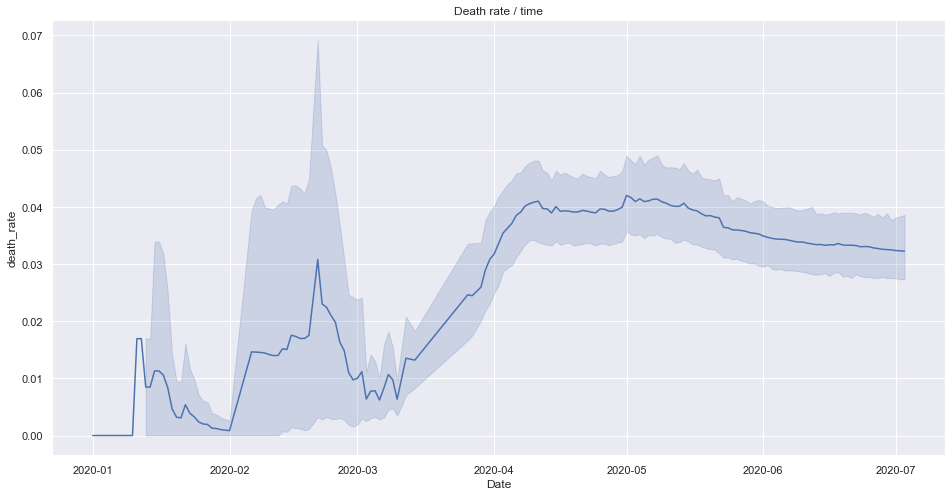

In [193]:
f, ax = plt.subplots(figsize=(16, 8))
ax = sns.lineplot(data=df, x="Date", y="death_rate")

#axis
#ax.set(xlim=(10, 1000000))
#ax.set(xscale='log')

plt.title('Death rate / time') 
plt.show()

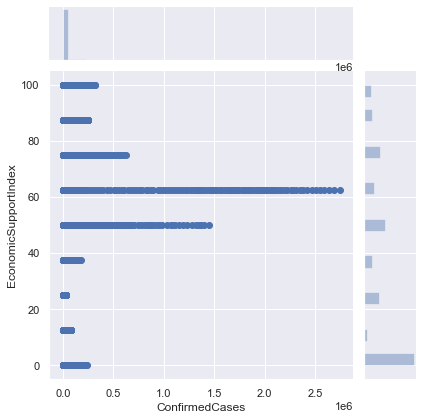

In [49]:
sns.jointplot(x='ConfirmedCases', y='EconomicSupportIndex', data=df);

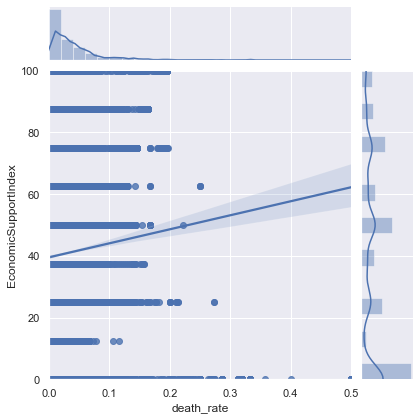

In [50]:
sns.jointplot(x='death_rate', y='EconomicSupportIndex', data=df, kind="reg", xlim=(0,0.5), ylim=(0,100));

2.6691621709549995


count    18857.000000
mean         0.034111
std          0.042275
min          0.000000
25%          0.005114
50%          0.022147
75%          0.046875
max          0.400000
Name: death_rate, dtype: float64

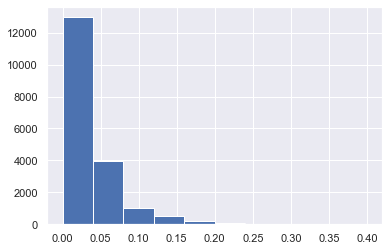

In [90]:
#duplicate dataframe
df3 = df

#describe death rate
df.death_rate.hist()
print(df['death_rate'].skew())
df['death_rate'].describe()

In [91]:
print("Quantile 0.1: ", df3['death_rate'].quantile(0.10))
print("Quantile 0.9: ", df3['death_rate'].quantile(0.90))
print("Skew number: ", df3['death_rate'].skew())

Quantile 0.1:  0.0
Quantile 0.9:  0.08066222904932588
Skew number:  2.6691621709549995


In [92]:
temp0 = df3[(df3['death_rate'] >= 0.5)|(df3['death_rate'] < 0)].index
df3.drop(temp0, inplace=True)
df3['death_rate'].describe()

count    18857.000000
mean         0.034111
std          0.042275
min          0.000000
25%          0.005114
50%          0.022147
75%          0.046875
max          0.400000
Name: death_rate, dtype: float64

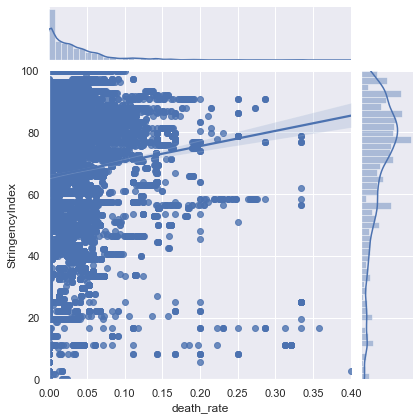

In [93]:
sns.jointplot(x='death_rate', y='StringencyIndex', data=df3, kind="reg", xlim=(0,0.4), ylim=(0,100));

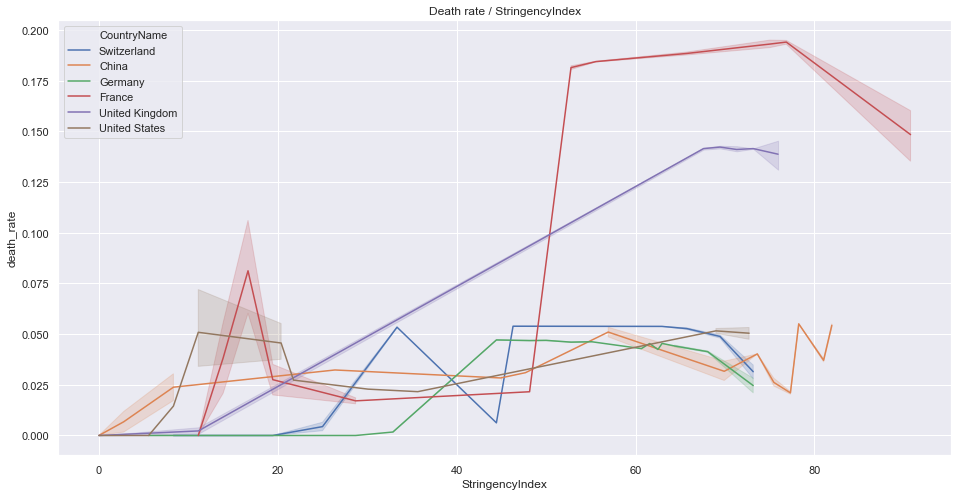

In [55]:
f, ax = plt.subplots(figsize=(16, 8))
df2 = df[df.CountryName.isin(['Germany','United States', 'France', 'United Kingdom', 'Switzerland', 'China'])]
ax = sns.lineplot(data=df2, x="StringencyIndex", y="death_rate", hue='CountryName')

#axis
#ax.set(xscale='log')

plt.title('Death rate / StringencyIndex') 
plt.show()

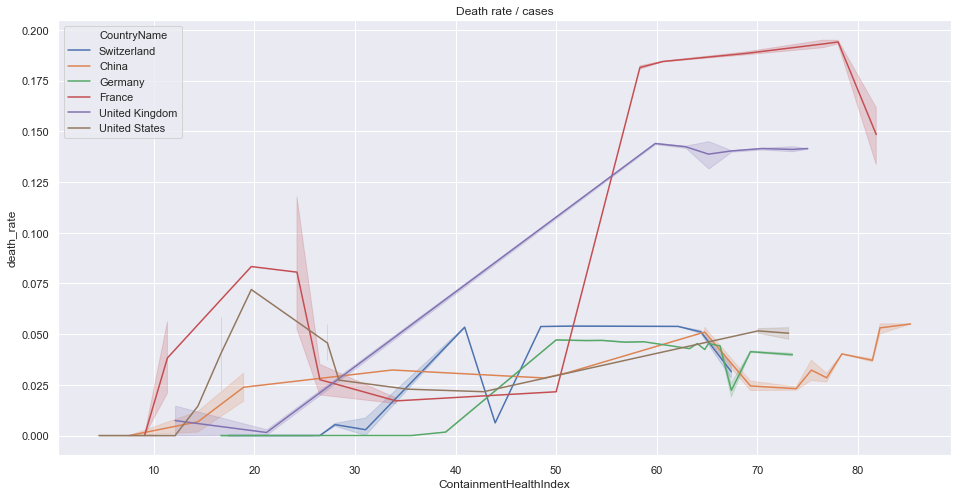

In [56]:
f, ax = plt.subplots(figsize=(16, 8))
df2 = df[df.CountryName.isin(['Germany','United States', 'France', 'United Kingdom', 'Switzerland', 'China'])]
ax = sns.lineplot(data=df2, x="ContainmentHealthIndex", y="death_rate", hue='CountryName', estimator='mean')

#axis
#ax.set(xscale='log')

plt.title('Death rate / cases') 
plt.show()


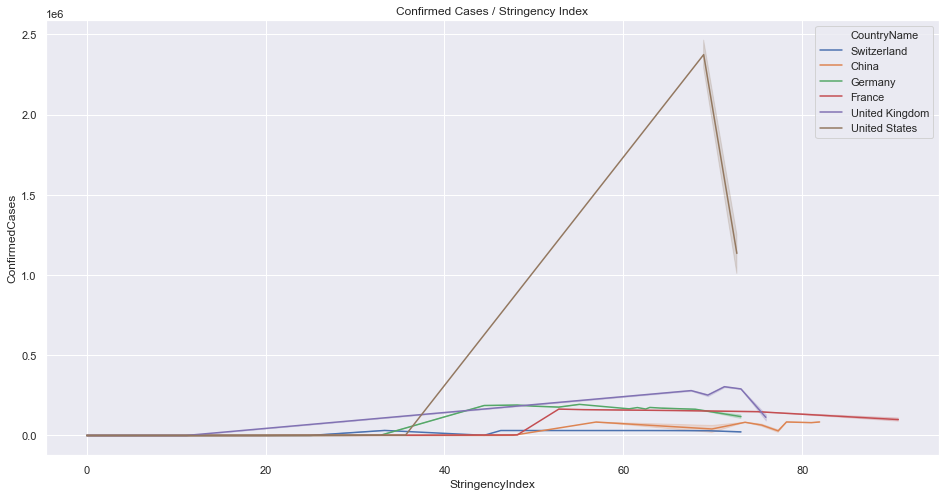

In [57]:
f, ax = plt.subplots(figsize=(16, 8))
df2 = df[df.CountryName.isin(['Germany','United States', 'France', 'United Kingdom', 'Switzerland', 'China'])]
ax = sns.lineplot(data=df2, x="StringencyIndex", y="ConfirmedCases", hue='CountryName', estimator='mean')

#axis
#ax.set(xscale='log')

plt.title('Confirmed Cases / Stringency Index') 
plt.show()


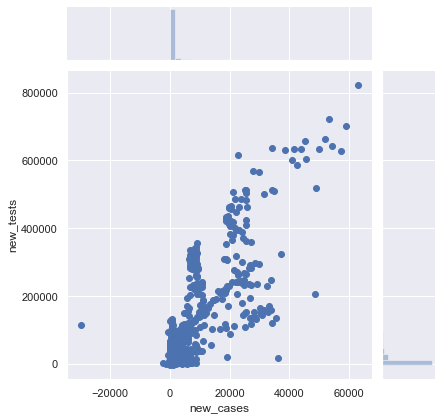

In [58]:
sns.jointplot(x='new_cases', y='new_tests', data=mf);

In [107]:
temp_mf = mf.groupby(['date']).sum()
temp_mf = temp_mf.drop(temp_mf.columns.difference(['date', 'new_cases','new_tests']), 1)
temp_mf = temp_mf.replace(np.nan, '', regex=True)

temp_mf

,new_cases,new_tests
date,,
2019-12-31,27.0,0.0
2020-01-01,0.0,5.0
2020-01-02,0.0,16.0
2020-01-03,17.0,18.0
2020-01-04,0.0,6.0
...,...,...
2020-07-09,215473.0,2067446.0
2020-07-10,228608.0,2181898.0
2020-07-11,229759.0,1089258.0


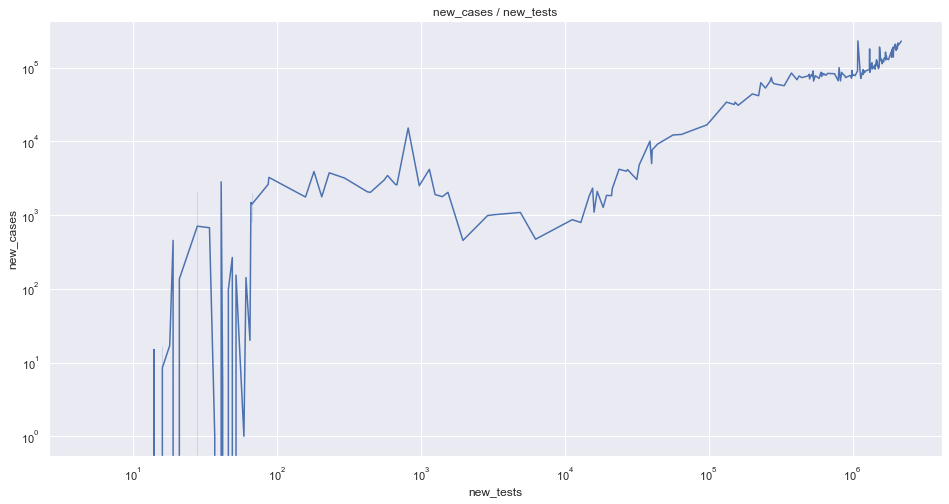

In [109]:
f, ax = plt.subplots(figsize=(16, 8))
#df2 = df[df.CountryName.isin(['Germany','United States', 'France', 'United Kingdom', 'Switzerland', 'China'])]
ax = sns.lineplot(data=temp_mf, x="new_tests", y="new_cases")

#axis
ax.set(xscale='log')
ax.set(yscale='log')

plt.title('new_cases / new_tests') 
plt.show()

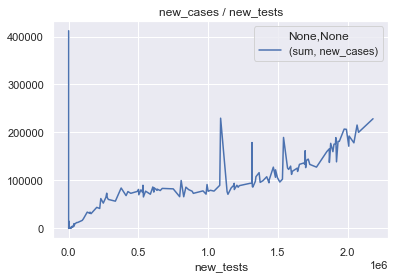

In [150]:
#Sum of cases
mf_pivot = pd.pivot_table(temp_mf,index=["new_tests"], values=["new_cases"],aggfunc=[np.sum])
mf_pivot.plot(title='new_cases / new_tests')

In [60]:
#how to filter values
temp_df = df
temp_df = temp_df.replace(np.nan, '', regex=True)

temp_df = temp_df[["CountryName", "death_rate", "C7_Restrictions on internal movement"]]
temp_df.tail()

,CountryName,death_rate,C7_Restrictions on internal movement
Date,,,
2020-07-09,Kosovo,,
2020-07-10,Kosovo,,
2020-07-11,Kosovo,,
2020-07-12,Kosovo,,
2020-07-13,Kosovo,,


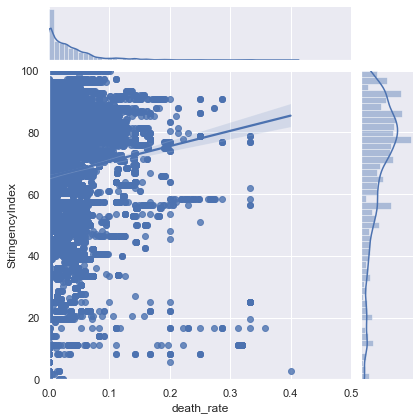

In [61]:
sns.jointplot(x='death_rate', y='StringencyIndex', data=df,
              kind="reg", xlim=(0, .5), ylim=(0, 100));

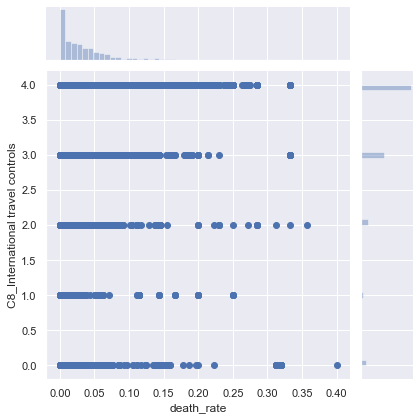

In [62]:
sns.jointplot(x='death_rate', y='C8_International travel controls', data=df);

In [782]:
#Merge mf and df_renamed
merge = pd.merge(mf, df, how = 'left', on = ['location','date'], suffixes=('_left', '_right'))
merge.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 33627 entries, 0 to 33626
Data columns (total 74 columns):
 #   Column                                 Non-Null Count  Dtype         
---  ------                                 --------------  -----         
 0   iso_code_left                          33563 non-null  object        
 1   continent                              33350 non-null  object        
 2   location                               33627 non-null  object        
 3   date                                   33627 non-null  datetime64[ns]
 4   total_cases_left                       33272 non-null  float64       
 5   new_cases                              33272 non-null  float64       
 6   total_deaths_left                      33272 non-null  float64       
 7   new_deaths                             33272 non-null  float64       
 8   total_cases_per_million                33208 non-null  float64       
 9   new_cases_per_million                  33208 non-null  float6

In [783]:
#Merge both dataframes
merge = merge.sort_values(by=['location', 'date'], ascending=True)

In [784]:
#Compare values
merge['comp'] = np.where(merge["total_cases_left"] == merge["total_cases_right"], True, False)
merge_temp = merge[merge['comp'] == False]
merge_temp[['date', 'location', 'total_cases_left', 'total_cases_right', 'total_deaths_left', 'total_deaths_right', 'comp']].sample(20)

,date,location,total_cases_left,total_cases_right,total_deaths_left,total_deaths_right,comp
27264,2020-07-17,Sint Maarten (Dutch part),79.0,NaN,15.0,NaN,False
19271,2020-07-10,Maldives,2553.0,NaN,13.0,NaN,False
32729,2020-03-06,Vietnam,NaN,NaN,NaN,NaN,False
28929,2020-04-15,Swaziland,15.0,NaN,0.0,NaN,False
16735,2020-07-21,Kosovo,5877.0,6045.0,139.0,144.0,False
27199,2020-05-13,Sint Maarten (Dutch part),77.0,NaN,15.0,NaN,False
6830,2020-05-09,Comoros,8.0,NaN,1.0,NaN,False
21906,2020-06-10,New Caledonia,21.0,NaN,0.0,NaN,False
30318,2020-06-03,Timor,24.0,NaN,0.0,NaN,False
22730,2020-07-03,Northern Mariana Islands,31.0,NaN,2.0,NaN,False


In [785]:
#drop same columns
merge = merge.drop(['total_cases_right', 'total_deaths_right', 'comp'], axis=1)

#rename columns
merge = merge.rename(columns = {'total_cases_left' : 'total_cases', 'total_deaths_left' : 'total_deaths'})
merge.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 33627 entries, 0 to 33349
Data columns (total 72 columns):
 #   Column                                 Non-Null Count  Dtype         
---  ------                                 --------------  -----         
 0   iso_code_left                          33563 non-null  object        
 1   continent                              33350 non-null  object        
 2   location                               33627 non-null  object        
 3   date                                   33627 non-null  datetime64[ns]
 4   total_cases                            33272 non-null  float64       
 5   new_cases                              33272 non-null  float64       
 6   total_deaths                           33272 non-null  float64       
 7   new_deaths                             33272 non-null  float64       
 8   total_cases_per_million                33208 non-null  float64       
 9   new_cases_per_million                  33208 non-null  float6

In [786]:
merge.to_csv('Merged.csv') #Save file locally

[None]

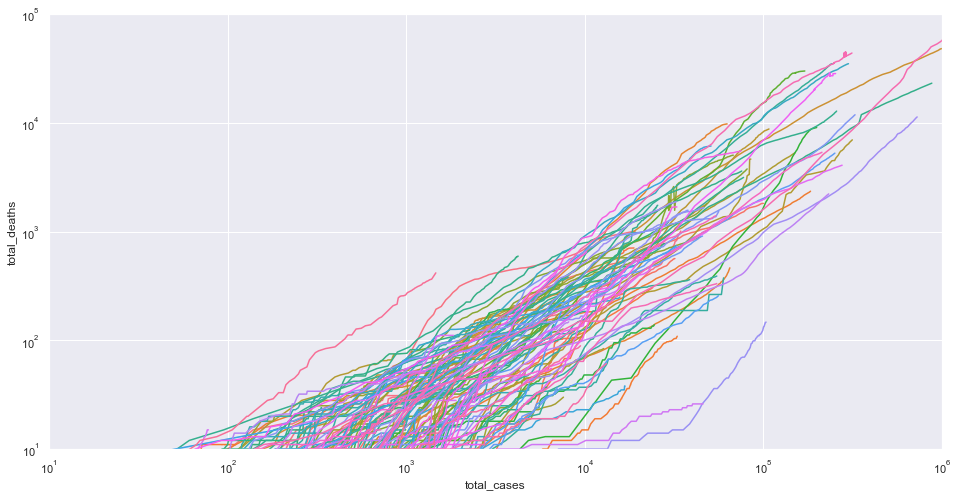

In [67]:
f, ax = plt.subplots(figsize=(16, 8))
ax = sns.lineplot(data=merge, x="total_cases", y="total_deaths", hue='location', estimator='mean', legend=None)

ax.set(xlim=(10, 1000000))
ax.set(ylim=(10, 100000))
ax.set(xscale='log')
ax.set(yscale='log')
#axplt.show()

[None]

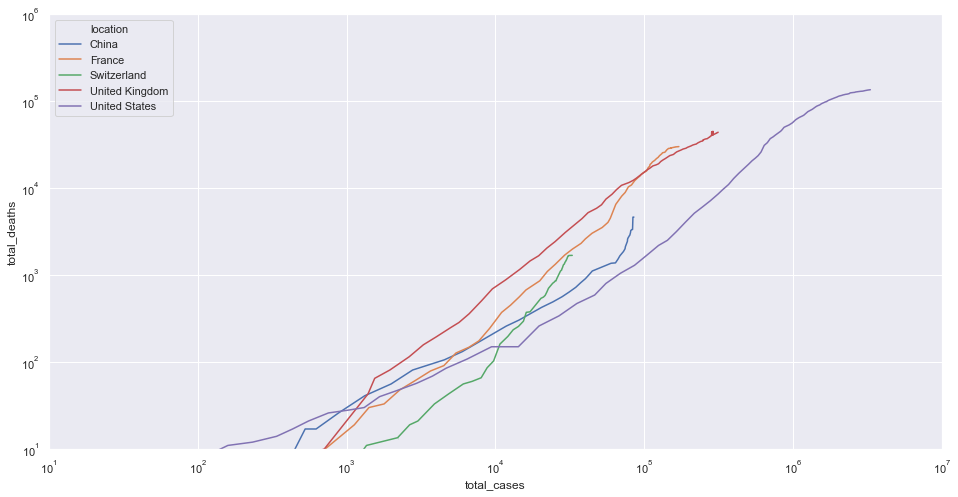

In [68]:
df2 = merge[merge.location.isin(['United States', 'France', 'United Kingdom', 'Switzerland', 'China'])]

f, ax = plt.subplots(figsize=(16, 8))
ax = sns.lineplot(data=df2, x="total_cases", y="total_deaths", hue='location')
ax.set(xlim=(10, 10000000))
ax.set(ylim=(10, 1000000))
ax.set(xscale='log')
ax.set(yscale='log')
#df1.plt.show()

In [849]:
merge2 = merge

gov = merge2.groupby(['location'])['GovernmentResponseIndex'].max()
cases_max = merge2.groupby(['location'])['total_cases'].max()

#beef_series = pd.Series(author) 
#article_series = pd.Series(article) 

frame = { 'max_cases': cases_max, 'max_gov_resp': gov } 
  
max_cases_gov_response = pd.DataFrame(frame) 
  
print(max_cases_gov_response) 

                 max_cases  max_gov_resp
location                                
Afghanistan        36471.0         64.74
Albania             5105.0         81.41
Algeria            29229.0         72.12
Andorra              918.0         63.46
Angola              1000.0         75.64
...                    ...           ...
Western Sahara       766.0           NaN
World           17005983.0           NaN
Yemen               1711.0         40.38
Zambia              5249.0         63.14
Zimbabwe            2879.0         71.15

[212 rows x 2 columns]


In [70]:
#Check USA
max_cases_gov_response[max_cases_gov_response.index == 'United States']

,max_cases,max_gov_resp
location,,
United States,3304942.0,71.47


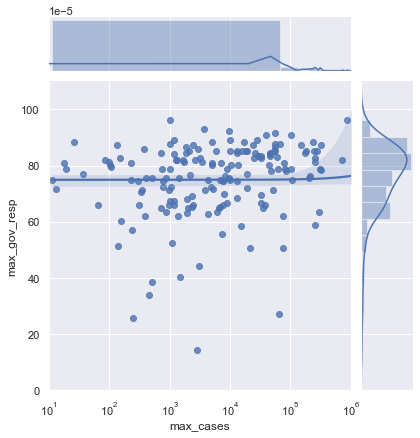

In [71]:
g = sns.jointplot(x='max_cases', y='max_gov_resp', data=max_cases_gov_response,
              kind="reg", xlim=(10,1000000), ylim=(0,110), dropna=True);
g.ax_joint.set_xscale('log')

In [918]:
temp1 = merge2.groupby(['date'])['StringencyIndex'].mean()
temp2 = merge2.groupby(['date'])['GovernmentResponseIndex'].mean()
temp3 = merge2.groupby(['date'])['ContainmentHealthIndex'].mean()
temp4 = merge2.groupby(['date'])['EconomicSupportIndex'].mean()
temp5 = merge2.groupby(['date'])['total_cases'].sum()
temp6 = merge2.groupby(['date'])['new_cases'].sum()
frame2 = { 'StringencyIndex': temp1, 'GovernmentResponseIndex': temp2, 'ContainmentHealthIndex': temp3, 'EconomicSupportIndex': temp4, 'total_cases': temp5, 'new_cases': temp6} 

gov_index_means = pd.DataFrame(frame2) 
  
print(gov_index_means)

            StringencyIndex  GovernmentResponseIndex  ContainmentHealthIndex  \
date                                                                           
2019-12-31              NaN                      NaN                     NaN   
2020-01-01         0.044127                 0.315397                0.228571   
2020-01-02         0.352698                 0.569841                0.529206   
2020-01-03         0.440952                 0.630952                0.601429   
2020-01-04         0.440952                 0.630952                0.601429   
...                     ...                      ...                     ...   
2020-07-26        56.049773                57.752093               59.055930   
2020-07-27        55.818611                57.074429               58.555571   
2020-07-28        51.955806                53.595000               55.578276   
2020-07-29        53.070667                54.321481               56.372500   
2020-07-30        47.347273             

In [919]:
gov_index_means.index = pd.to_datetime(gov_index_means.index,format='%Y-%m-%d') 
gov_index_means.head()

,StringencyIndex,GovernmentResponseIndex,ContainmentHealthIndex,EconomicSupportIndex,total_cases,new_cases
date,,,,,,
2019-12-31,NaN,NaN,NaN,NaN,54.0,54.0
2020-01-01,0.044127,0.315397,0.228571,0.793651,54.0,0.0
2020-01-02,0.352698,0.569841,0.529206,0.793651,54.0,0.0
2020-01-03,0.440952,0.630952,0.601429,0.793651,88.0,34.0
2020-01-04,0.440952,0.630952,0.601429,0.793651,88.0,0.0


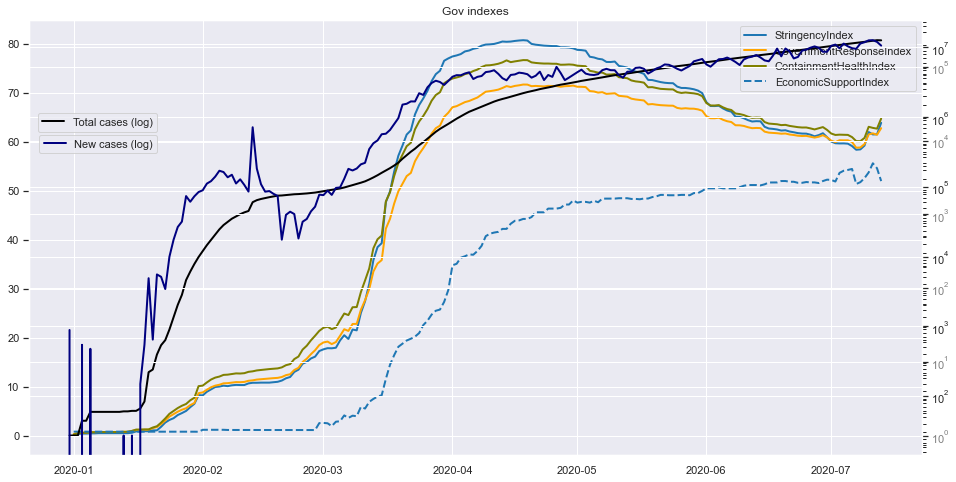

In [74]:
#Indexes plot
f, ax = plt.subplots(figsize=(16, 8))
plt.plot('StringencyIndex', data=gov_index_means, marker='', color='tab:blue', linewidth=2)
plt.plot('GovernmentResponseIndex', data=gov_index_means, marker='', color='orange', linewidth=2)
plt.plot('ContainmentHealthIndex', data=gov_index_means, marker='', color='olive', linewidth=2)
plt.plot('EconomicSupportIndex', data=gov_index_means, marker='', color='tab:blue', linewidth=2, linestyle='dashed')
plt.legend()
plt.title('Gov indexes') 

#Total cases plot
ax2 = ax.twinx()
plt.plot('total_cases', data=gov_index_means, marker='', color='black', linewidth=2, label='Total cases (log)')
ax2.set(yscale='log')
plt.legend(bbox_to_anchor=(0.15, 0.8))

#New cases plot
ax3 = ax.twinx()
plt.plot('new_cases', data=gov_index_means, marker='', color='navy', linewidth=2, label='New cases (log)')
plt.legend(bbox_to_anchor=(0.15, 0.75))
ax3.set(yscale='log')
ax3.tick_params(axis='y', labelcolor='grey')
ax3.yaxis.set_label_coords(5.1, 0)
         
#ax.set(xlim=(10, 1000000))
#ax.set(ylim=(10, 100000))
#ax.set(xscale='log')
#ax.set(yscale='log')
#axplt.show()

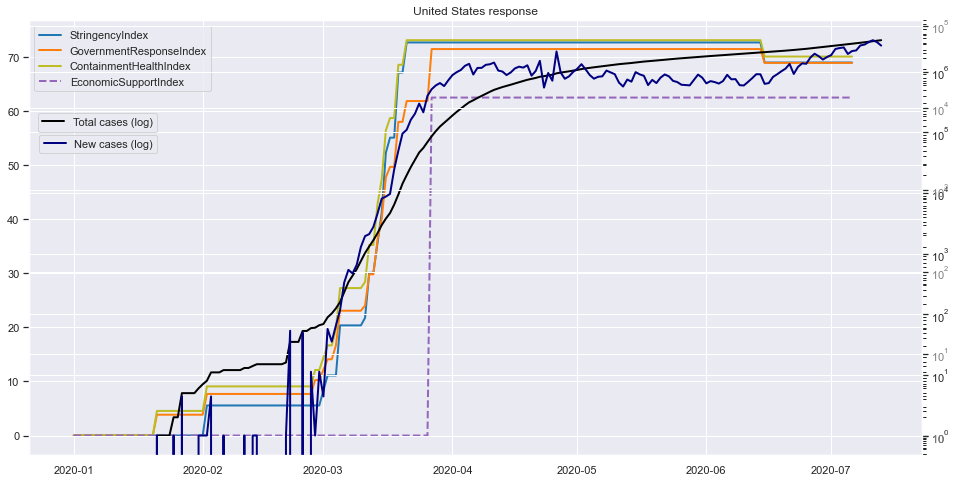

In [75]:
df3 = merge[merge.location.isin(['United States'])]
df3.index = df3.date

#Indexes plot
f, ax = plt.subplots(figsize=(16, 8))
plt.plot('StringencyIndex', data=df3, marker='', color='tab:blue', linewidth=2)
plt.plot('GovernmentResponseIndex', data=df3, marker='', color='tab:orange', linewidth=2)
plt.plot('ContainmentHealthIndex', data=df3, marker='', color='tab:olive', linewidth=2)
plt.plot('EconomicSupportIndex', data=df3, marker='', color='tab:purple', linewidth=2, linestyle='dashed')
plt.legend()
plt.title('United States response') 

#Total cases plot
ax2 = ax.twinx()
plt.plot('total_cases', data=df3, marker='', color='black', linewidth=2, label='Total cases (log)')
ax2.set(yscale='log')
plt.legend(bbox_to_anchor=(0.15, 0.8))

#New cases plot
ax3 = ax.twinx()
plt.plot('new_cases', data=df3, marker='', color='navy', linewidth=2, label='New cases (log)')
plt.legend(bbox_to_anchor=(0.15, 0.75))
ax3.set(yscale='log')
ax3.tick_params(axis='y', labelcolor='grey')
ax3.yaxis.set_label_coords(5.1, 0)
         
#ax.set(xlim=(10, 1000000))
#ax.set(ylim=(10, 100000))
#ax.set(xscale='log')
#ax.set(yscale='log')
#axplt.show()

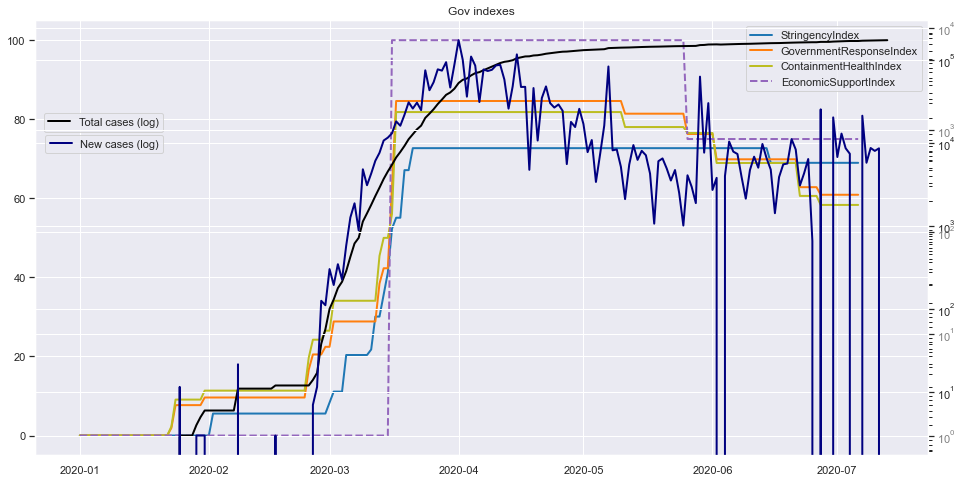

In [76]:
#Countries
df4 = merge[merge.location.isin(['France'])]
df4.index = df3.date


#Indexes plot
f, ax = plt.subplots(figsize=(16, 8))
plt.plot('StringencyIndex', data=df3, marker='', color='tab:blue', linewidth=2)
plt.plot('GovernmentResponseIndex', data=df4, marker='', color='tab:orange', linewidth=2)
plt.plot('ContainmentHealthIndex', data=df4, marker='', color='tab:olive', linewidth=2)
plt.plot('EconomicSupportIndex', data=df4, marker='', color='tab:purple', linewidth=2, linestyle='dashed')
plt.legend()
plt.title('Gov indexes') 

#Total cases plot
ax2 = ax.twinx()
plt.plot('total_cases', data=df4, marker='', color='black', linewidth=2, label='Total cases (log)')
ax2.set(yscale='log')
plt.legend(bbox_to_anchor=(0.15, 0.8))

#New cases plot
ax3 = ax.twinx()
plt.plot('new_cases', data=df4, marker='', color='navy', linewidth=2, label='New cases (log)')
plt.legend(bbox_to_anchor=(0.15, 0.75))
ax3.set(yscale='log')
ax3.tick_params(axis='y', labelcolor='grey')
ax3.yaxis.set_label_coords(5.1, 0)
         
#ax.set(xlim=(10, 1000000))
#ax.set(ylim=(10, 100000))
#ax.set(xscale='log')
#ax.set(yscale='log')
#axplt.show()



In [77]:
def is_outlier(points, thresh=3.5):
    """
    Returns a boolean array with True if points are outliers and False 
    otherwise.

    Parameters:
    -----------
        points : An numobservations by numdimensions array of observations
        thresh : The modified z-score to use as a threshold. Observations with
            a modified z-score (based on the median absolute deviation) greater
            than this value will be classified as outliers.

    Returns:
    --------
        mask : A numobservations-length boolean array.

    References:
    ----------
        Boris Iglewicz and David Hoaglin (1993), "Volume 16: How to Detect and
        Handle Outliers", The ASQC Basic References in Quality Control:
        Statistical Techniques, Edward F. Mykytka, Ph.D., Editor. 
    """
    if len(points.shape) == 1:
        points = points[:,None]
    median = np.median(points, axis=0)
    diff = np.sum((points - median)**2, axis=-1)
    diff = np.sqrt(diff)
    med_abs_deviation = np.median(diff)

    modified_z_score = 0.6745 * diff / med_abs_deviation

    return modified_z_score > thresh

In [78]:
#sns.catplot(x="total_cases", y="GovernmentResponseIndex", kind="point", hue='location', data=merge);

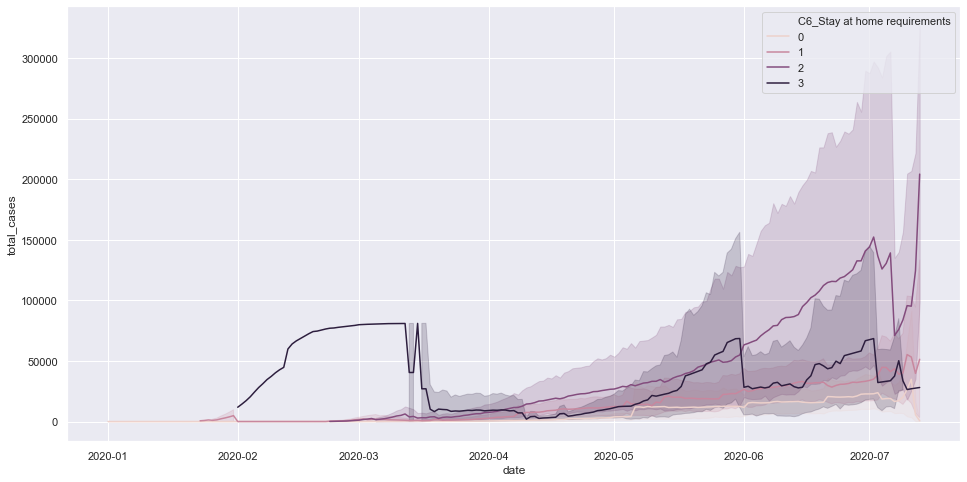

In [79]:
f, ax = plt.subplots(figsize=(16, 8))
ax = sns.lineplot(data=merge, x="date", y="total_cases", hue='C6_Stay at home requirements', estimator='mean')

#ax.set(xlim=(10, 1000000))
#ax.set(ylim=(10, 100000))
#ax.set(xscale='log')
#ax.set(yscale='log')
#axplt.show()

In [80]:
#merge2[merge2['max'] > 0]

#temp0 = df3[(df3['death_rate'] >= 0.5)|(df3['death_rate'] < 0)].index
#temp_df[temp_df.CountryName == 'United States']

In [151]:
df1 = merge

df1['diff'] = df1['total_deaths'] / df1['total_cases']
df1['diff2'] = df1['new_deaths'] / df1['new_cases']
df1['diff3'] = df1['new_deaths'] - df1['new_cases']

In [155]:
df1.head()

,iso_code,continent,location,date,total_cases,new_cases,total_deaths,new_deaths,total_cases_per_million,new_cases_per_million,...,StringencyLegacyIndexForDisplay,GovernmentResponseIndex,GovernmentResponseIndexForDisplay,ContainmentHealthIndex,ContainmentHealthIndexForDisplay,EconomicSupportIndex,EconomicSupportIndexForDisplay,diff,diff2,diff3
0,AFG,Asia,Afghanistan,2019-12-31,0.0,0.0,0.0,0.0,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0
1,AFG,Asia,Afghanistan,2020-01-01,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,0.0
2,AFG,Asia,Afghanistan,2020-01-02,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,0.0
3,AFG,Asia,Afghanistan,2020-01-03,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,0.0
4,AFG,Asia,Afghanistan,2020-01-04,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,0.0


In [162]:
#df1[['date', 'location', 'new_cases', 'new_deaths','total_cases_left', 'total_cases_right', 'total_deaths_left', 'total_deaths_right', 'diff', 'diff2']].sample(10)
#df1.sample(10)

In [156]:
df1[df1.diff2 == 2]

,iso_code,continent,location,date,total_cases,new_cases,total_deaths,new_deaths,total_cases_per_million,new_cases_per_million,...,StringencyLegacyIndexForDisplay,GovernmentResponseIndex,GovernmentResponseIndexForDisplay,ContainmentHealthIndex,ContainmentHealthIndexForDisplay,EconomicSupportIndex,EconomicSupportIndexForDisplay,diff,diff2,diff3
8855,EST,Europe,Estonia,2020-05-04,1700.0,1.0,55.0,2.0,1281.530,0.754,...,73.81,64.74,64.74,67.42,67.42,50.0,50.0,0.032353,2.0,1.0
12084,HND,North America,Honduras,2020-03-31,141.0,2.0,7.0,4.0,14.236,0.202,...,100.00,75.64,75.64,89.39,89.39,0.0,0.0,0.049645,2.0,2.0
12306,HUN,Europe,Hungary,2020-06-16,4077.0,1.0,565.0,2.0,422.034,0.104,...,79.76,65.38,65.38,63.64,63.64,75.0,75.0,0.138582,2.0,1.0
12307,HUN,Europe,Hungary,2020-06-17,4078.0,1.0,567.0,2.0,422.138,0.104,...,79.76,65.38,65.38,63.64,63.64,75.0,75.0,0.139039,2.0,1.0
13457,IRL,Europe,Ireland,2020-06-03,25066.0,4.0,1658.0,8.0,5076.354,0.810,...,89.29,82.05,82.05,78.79,78.79,100.0,100.0,0.066145,2.0,4.0
13533,IMN,Europe,Isle of Man,2020-04-25,308.0,1.0,18.0,2.0,3622.166,11.760,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.058442,2.0,1.0
23196,SMR,Europe,San Marino,2020-03-13,67.0,1.0,5.0,2.0,1974.188,29.465,...,73.81,65.38,65.38,68.18,68.18,50.0,50.0,0.074627,2.0,1.0


[None]

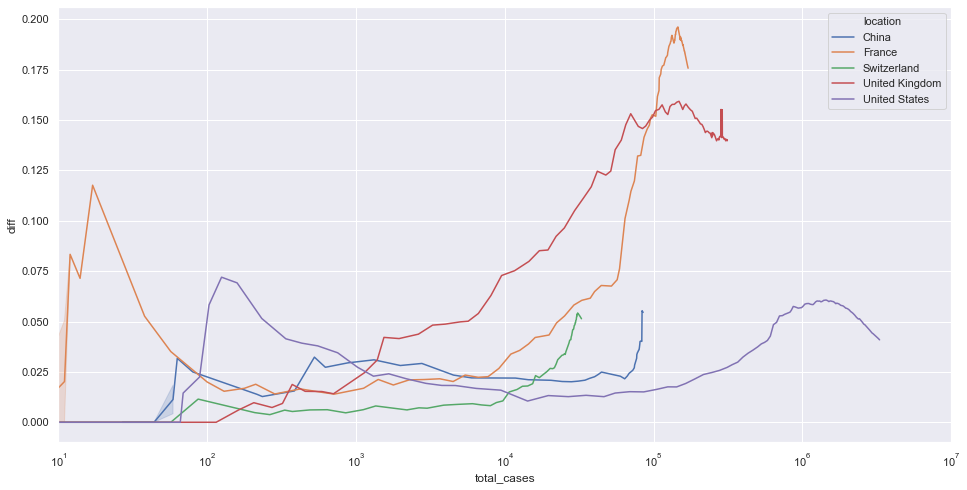

In [158]:
df2 = df1[df1.location.isin(['United States', 'France', 'United Kingdom', 'Switzerland', 'China'])]

f, ax = plt.subplots(figsize=(16, 8))
ax = sns.lineplot(data=df2, x="total_cases", y="diff", hue='location')
ax.set(xlim=(10, 10000000))
ax.set(xscale='log')
#df1.plt.show()

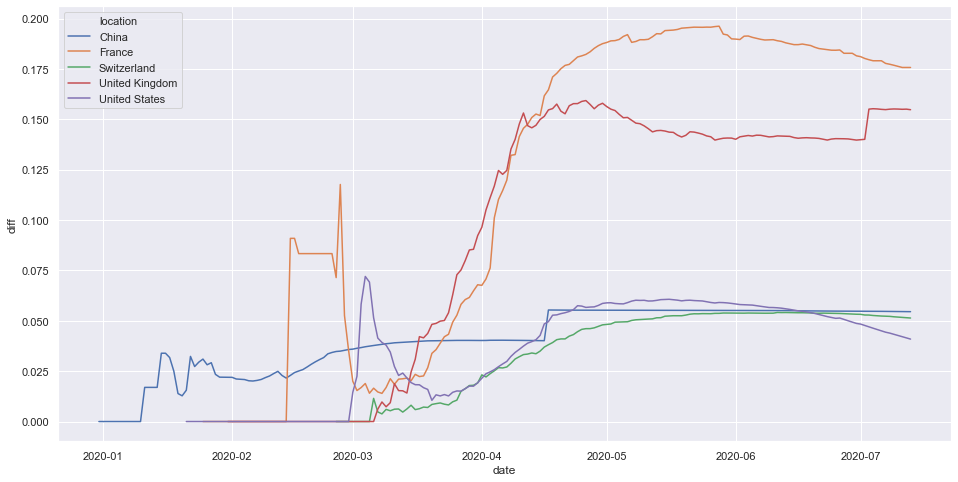

In [159]:
df2 = df1[df1.location.isin(['United States', 'France', 'United Kingdom', 'Switzerland', 'China'])]

f, ax = plt.subplots(figsize=(16, 8))
ax = sns.lineplot(data=df2, x="date", y="diff", hue='location')
#ax.set(xlim=(10, 10000))
#ax.set(ylim=(10, 1000000))
#ax.set(xscale='log')
#ax.set(yscale='log')
#df1.plt.show()

[None]

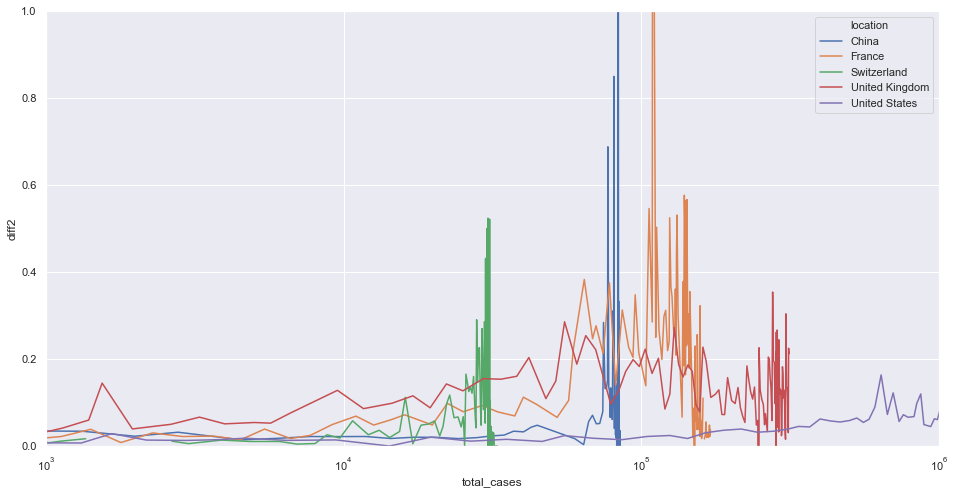

In [171]:
df2 = df1[df1.location.isin(['United States', 'France', 'United Kingdom', 'Switzerland', 'China'])]

f, ax = plt.subplots(figsize=(16, 8))
ax = sns.lineplot(data=df2, x="total_cases", y="diff2", hue='location')
ax.set(xlim=(1000, 1000000))
ax.set(ylim=(0, 1))
ax.set(xscale='log')
#ax.set(yscale='log')
#df1.plt.show()

In [920]:
f, ax = plt.subplots(figsize=(16, 8))
plt.plot('StringencyIndex', data=gov_index_means, marker='', color='tab:blue', linewidth=2, label='Stringency Index')
plt.title('Stringency Index vs Google index') 
plt.legend(loc=2)

#Total cases plot
ax2 = ax.twinx()
plt.plot('residential_percent_change_from_baseline', data=gf, marker='', color='black', linewidth=2, label='residential_percent_change_from_baseline')
#ax2.set(yscale='log')
plt.legend(loc=1)

        
#ax.set(xlim=(10, 1000000))
#ax.set(ylim=(10, 100000))
#ax.set(xscale='log')
#ax.set(yscale='log')
#axplt.show()

ValueError: view limit minimum -68178.2 is less than 1 and is an invalid Matplotlib date value. This often happens if you pass a non-datetime value to an axis that has datetime units

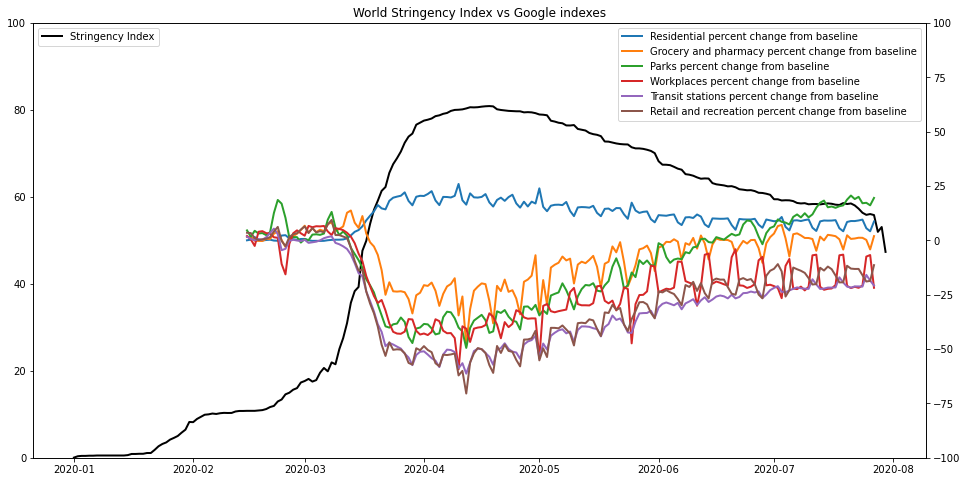

In [912]:
f, ax = plt.subplots(figsize=(16, 8))
plt.plot('StringencyIndex', data=gov_index_means, marker='', color='black', linewidth=2, label='Stringency Index')
plt.title('World Stringency Index vs Google indexes') 
plt.legend(loc=2)

# Mobility Indexes plot
ax2 = ax.twinx()
plt.plot('residential_percent_change_from_baseline', data=gf_mean, marker='', linewidth=2, label='Residential percent change from baseline')
plt.plot('grocery_and_pharmacy_percent_change_from_baseline', data=gf_mean, marker='', linewidth=2, label='Grocery and pharmacy percent change from baseline')
plt.plot('parks_percent_change_from_baseline', data=gf_mean, marker='', linewidth=2, label='Parks percent change from baseline')
plt.plot('workplaces_percent_change_from_baseline', data=gf_mean, marker='', linewidth=2, label='Workplaces percent change from baseline')
plt.plot('transit_stations_percent_change_from_baseline', data=gf_mean, marker='', linewidth=2, label='Transit stations percent change from baseline')
plt.plot('retail_and_recreation_percent_change_from_baseline', data=gf_mean, marker='', linewidth=2, label='Retail and recreation percent change from baseline')

#ax2.set(yscale='log')
plt.legend(loc=1)
        
ax.set(ylim=(0, 100))
ax2.set(ylim=(-100, 100))
plt.savefig('output/World Stringency Index vs Google indexes' + '.png', format="PNG", dpi=300)

#ax.set(xscale='log')
#ax.set(yscale='log')
#axplt.show()

In [995]:
#Merge mf and df_renamed
merge_gf_mf = pd.merge(mf, gf, how = 'inner', on = ['location','date'], suffixes=('_left', '_right'))
merge_gf_mf = merge_gf_mf[['location','sub_region_1', 'sub_region_2', 'date', 'new_cases', 'total_cases', 'new_deaths', 'total_deaths',
                           'stringency_index', 'continent_right', 'retail_and_recreation_percent_change_from_baseline',
                          'grocery_and_pharmacy_percent_change_from_baseline', 'parks_percent_change_from_baseline',
                          'transit_stations_percent_change_from_baseline', 'workplaces_percent_change_from_baseline',
                          'residential_percent_change_from_baseline']]
merge_gf_mf = merge_gf_mf.rename(columns = {'continent_right' : 'continent'})
merge_gf_mf.to_csv('merge_gf_mf.csv') #Save file locally
merge_gf_mf.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1313403 entries, 0 to 1313402
Data columns (total 16 columns):
 #   Column                                              Non-Null Count    Dtype         
---  ------                                              --------------    -----         
 0   location                                            1313403 non-null  object        
 1   sub_region_1                                        1286320 non-null  object        
 2   sub_region_2                                        1020135 non-null  object        
 3   date                                                1313403 non-null  datetime64[ns]
 4   new_cases                                           1301380 non-null  float64       
 5   total_cases                                         1301380 non-null  float64       
 6   new_deaths                                          1301380 non-null  float64       
 7   total_deaths                                        1301380 non-null  fl

In [924]:
merge_gf_mf.corr().style.background_gradient(cmap='Reds').format("{:.3f}")

,stringency_index,retail_and_recreation_percent_change_from_baseline,grocery_and_pharmacy_percent_change_from_baseline,parks_percent_change_from_baseline,transit_stations_percent_change_from_baseline,workplaces_percent_change_from_baseline,residential_percent_change_from_baseline
stringency_index,1.000,-0.631,-0.378,-0.349,-0.563,-0.493,0.692
retail_and_recreation_percent_change_from_baseline,-0.631,1.000,0.769,0.629,0.823,0.633,-0.806
grocery_and_pharmacy_percent_change_from_baseline,-0.378,0.769,1.000,0.530,0.698,0.567,-0.655
parks_percent_change_from_baseline,-0.349,0.629,0.530,1.000,0.569,0.243,-0.491
transit_stations_percent_change_from_baseline,-0.563,0.823,0.698,0.569,1.000,0.594,-0.744
workplaces_percent_change_from_baseline,-0.493,0.633,0.567,0.243,0.594,1.000,-0.823
residential_percent_change_from_baseline,0.692,-0.806,-0.655,-0.491,-0.744,-0.823,1.000


United States
France
Spain
Switzerland
Sweden
Italy
United Kingdom
Germany
South Korea


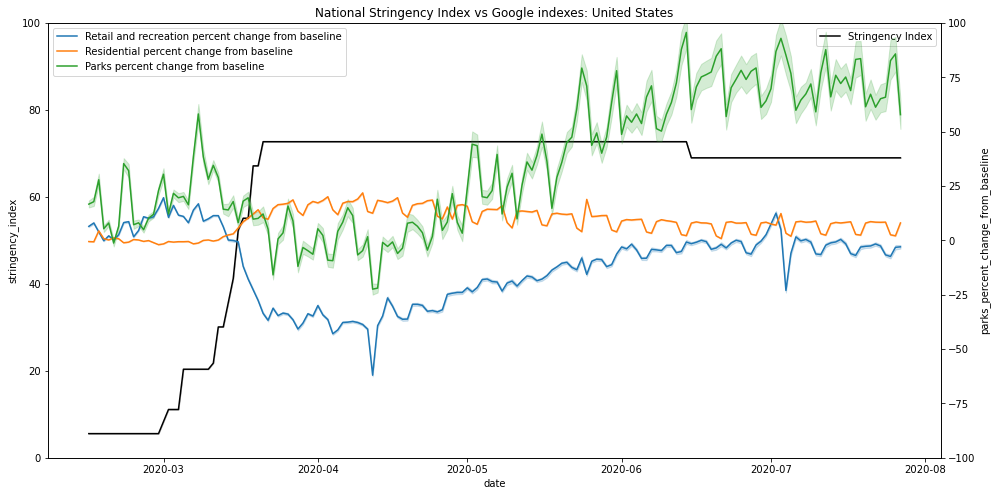

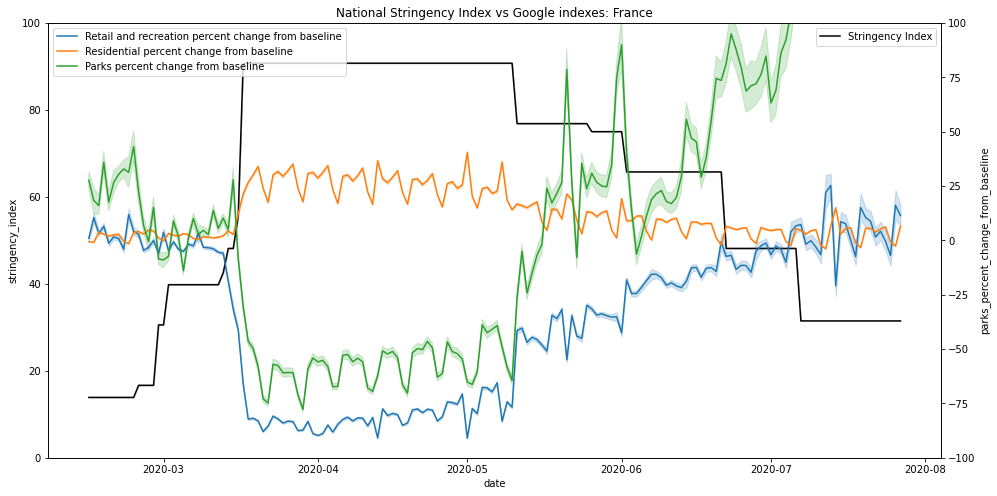

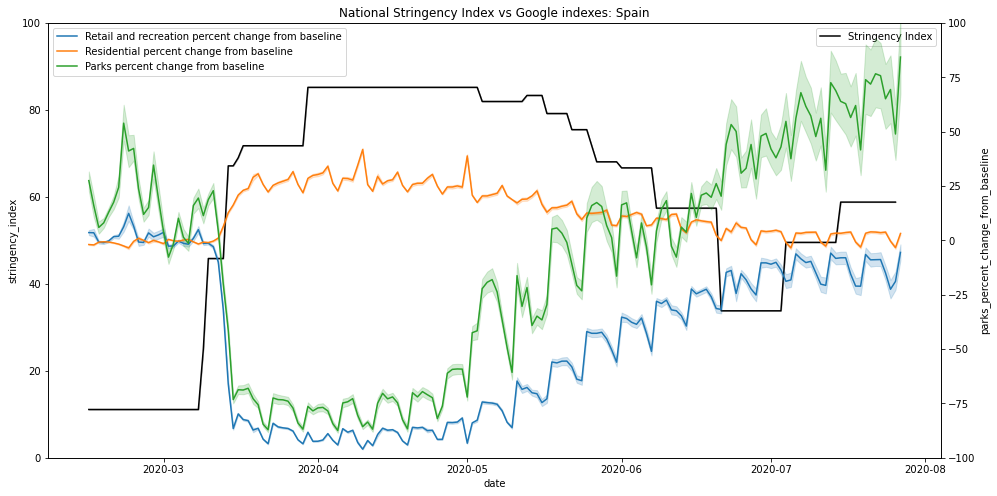

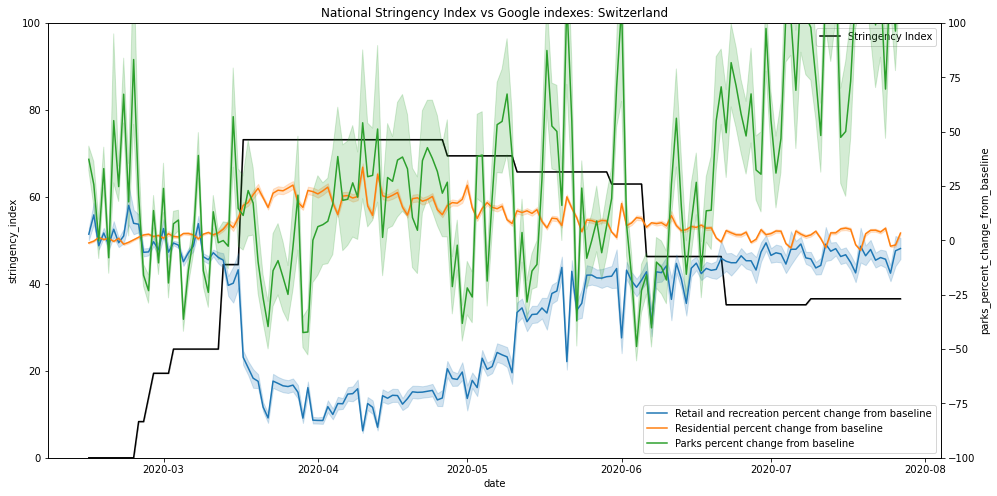

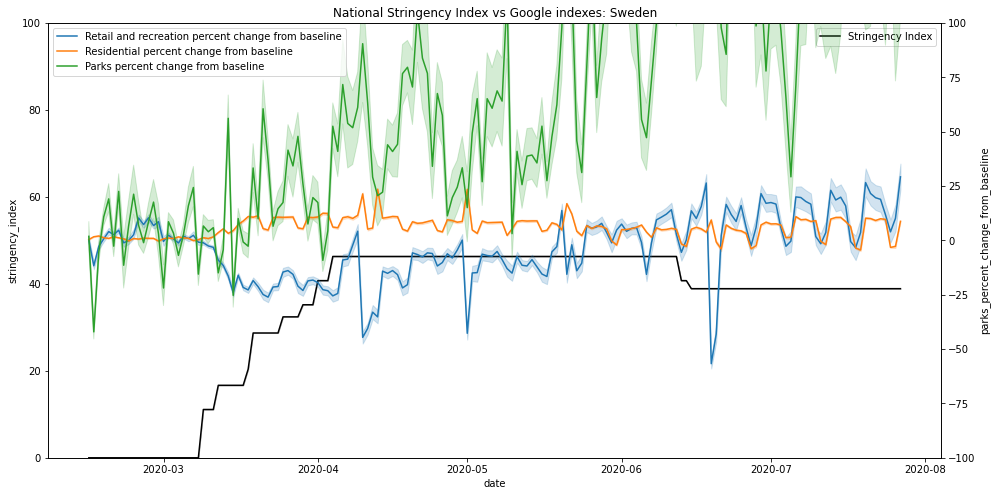

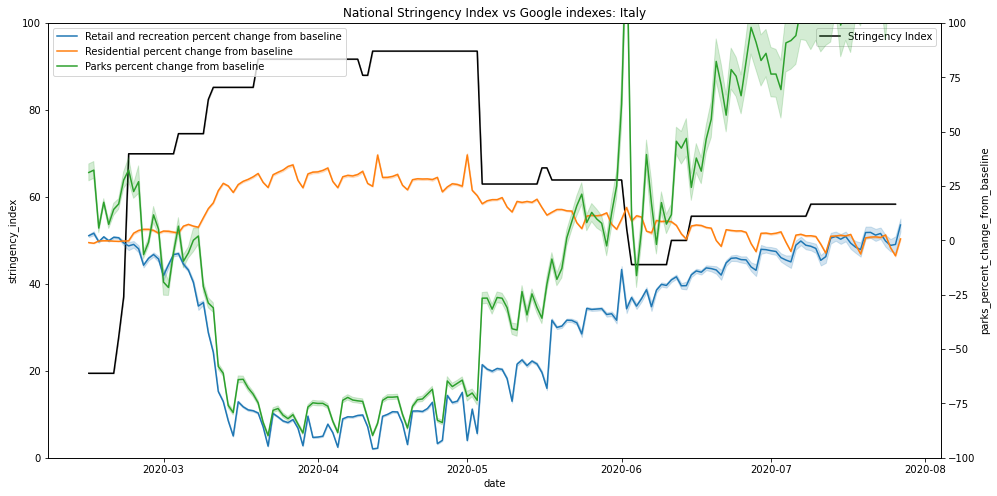

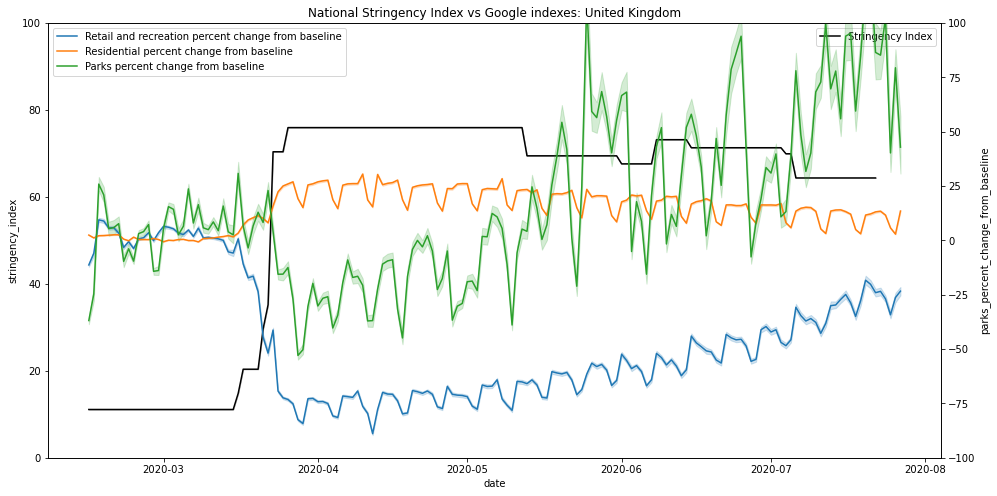

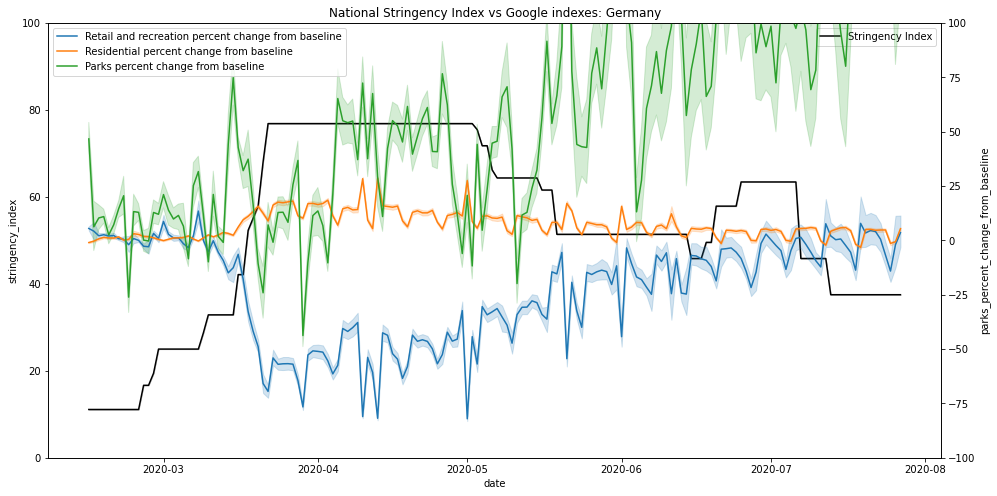

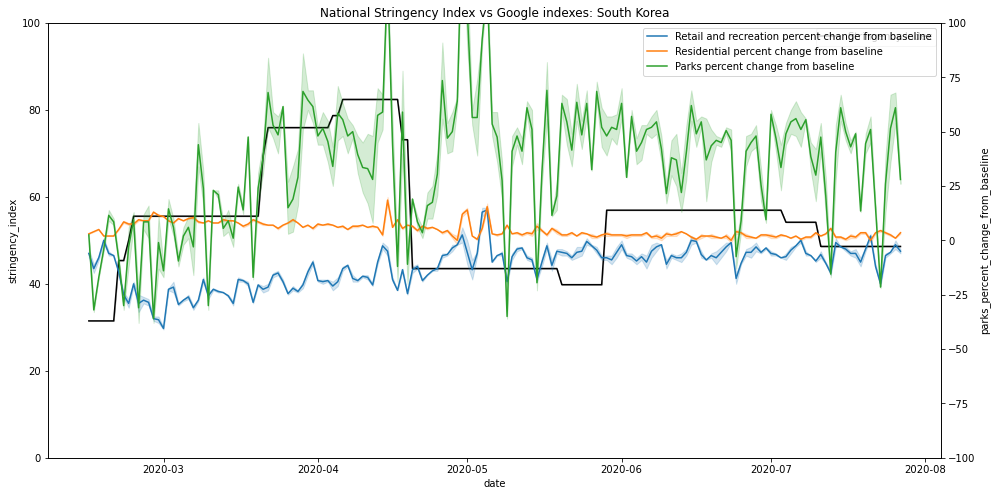

In [988]:
# National Stringency Index vs Google indexes
countries1 = ['United States', 'France', 'Spain', 'Switzerland', 'Sweden', 'Italy', 'United Kingdom', 'Germany', 'South Korea']

for i in countries1:
    print(i)
    mf10 = []
    mf10 = merge_gf_mf[merge_gf_mf.location.isin([i])]

    f, ax = plt.subplots(figsize=(16, 8))
    ax = sns.lineplot(data=mf10, x="date", y="stringency_index", color='black', label='Stringency Index')

    plt.title('National Stringency Index vs Google indexes: ' + i) 
    #plt.legend(loc=2)

    # Mobility Indexes plot
    ax2 = ax.twinx()
    ax2 = sns.lineplot(data=mf10, x="date", y="retail_and_recreation_percent_change_from_baseline", label='Retail and recreation percent change from baseline')
    ax2 = sns.lineplot(data=mf10, x="date", y="residential_percent_change_from_baseline", label='Residential percent change from baseline')
    ax2 = sns.lineplot(data=mf10, x="date", y="parks_percent_change_from_baseline", label='Parks percent change from baseline') 

    ax.set(ylim=(0, 100))
    ax2.set(ylim=(-100, 100))

    plt.savefig('output/National Stringency Index vs Google_' + i + '.png', format="PNG", dpi=300, bbox_inches='tight')

Oceania
Europe
South America
North America
Asia
Africa


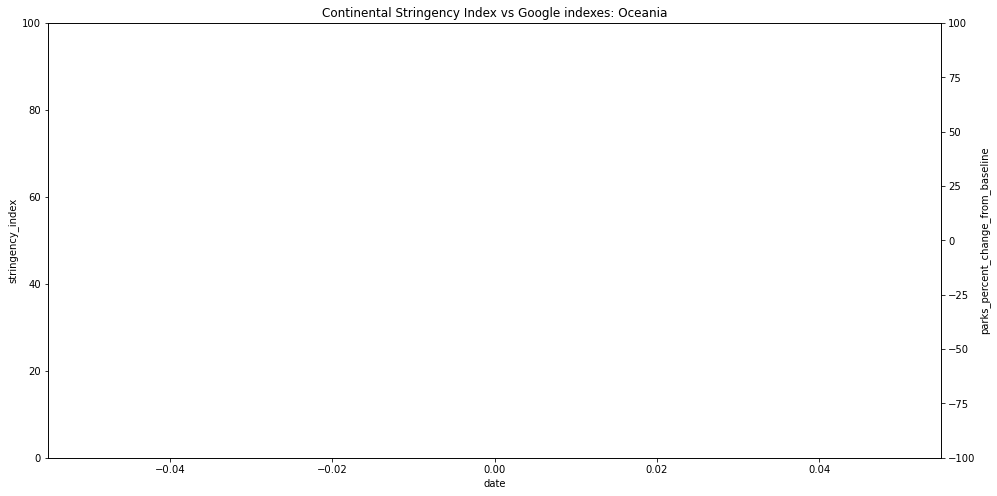

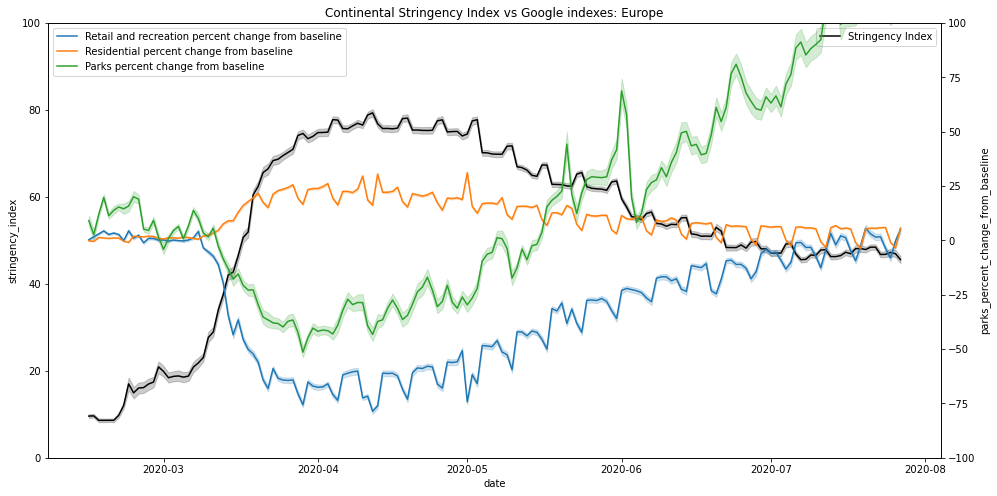

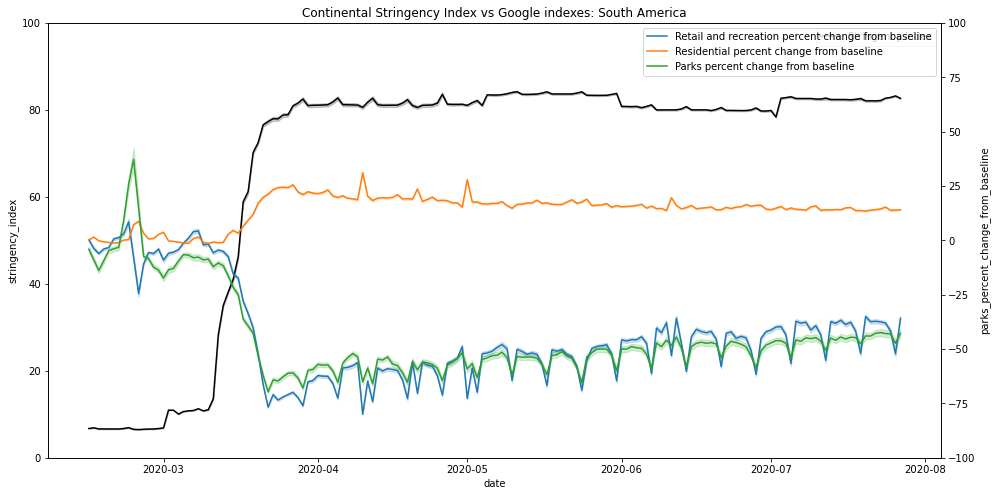

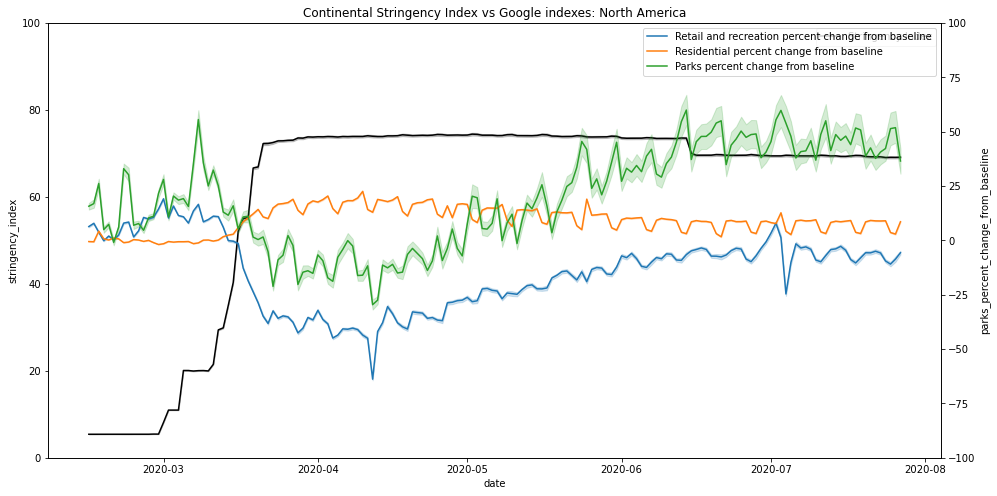

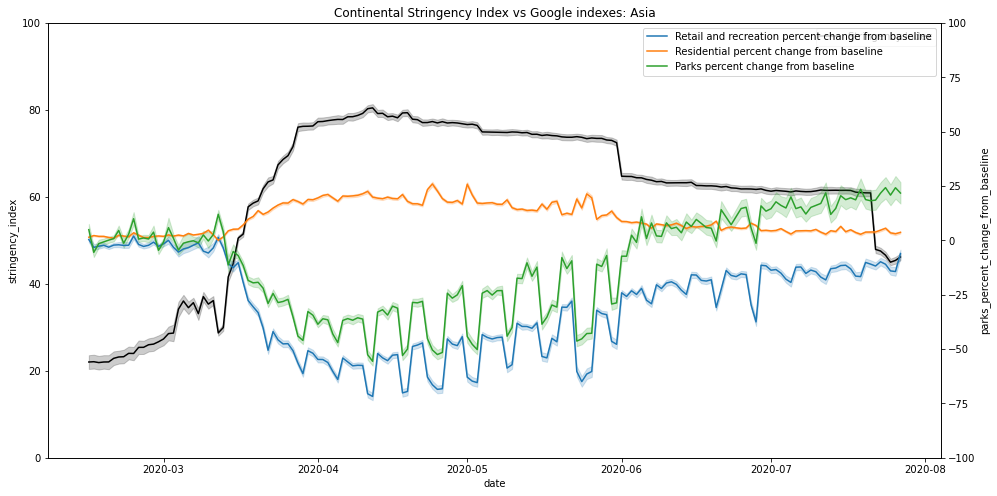

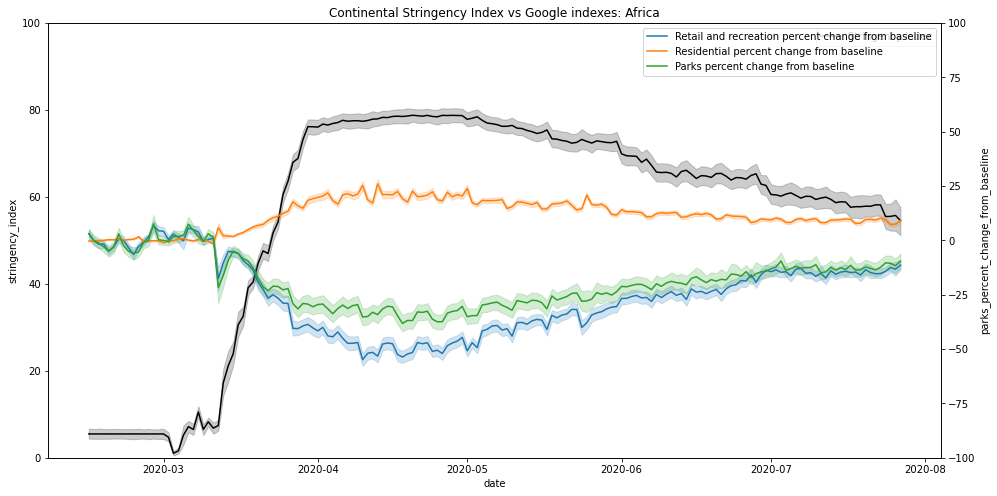

In [998]:
# National Stringency Index vs Google indexes
continents = ['Oceania', 'Europe', 'South America', 'North America', 'Asia', 'Africa']

for i in continents:
    print(i)
    mf10 = []
    mf10 = merge_gf_mf[merge_gf_mf.continent.isin([i])]

    f, ax = plt.subplots(figsize=(16, 8))
    ax = sns.lineplot(data=mf10, x="date", y="stringency_index", color='black', label='Stringency Index')

    plt.title('Continental Stringency Index vs Google indexes: ' + i) 
    #plt.legend(loc=2)

    # Mobility Indexes plot
    ax2 = ax.twinx()
    ax2 = sns.lineplot(data=mf10, x="date", y="retail_and_recreation_percent_change_from_baseline", label='Retail and recreation percent change from baseline')
    ax2 = sns.lineplot(data=mf10, x="date", y="residential_percent_change_from_baseline", label='Residential percent change from baseline')
    ax2 = sns.lineplot(data=mf10, x="date", y="parks_percent_change_from_baseline", label='Parks percent change from baseline') 

    ax.set(ylim=(0, 100))
    ax2.set(ylim=(-100, 100))

    plt.savefig('output/Continental Stringency Index vs Google_' + i + '.png', format="PNG", dpi=300, bbox_inches='tight')

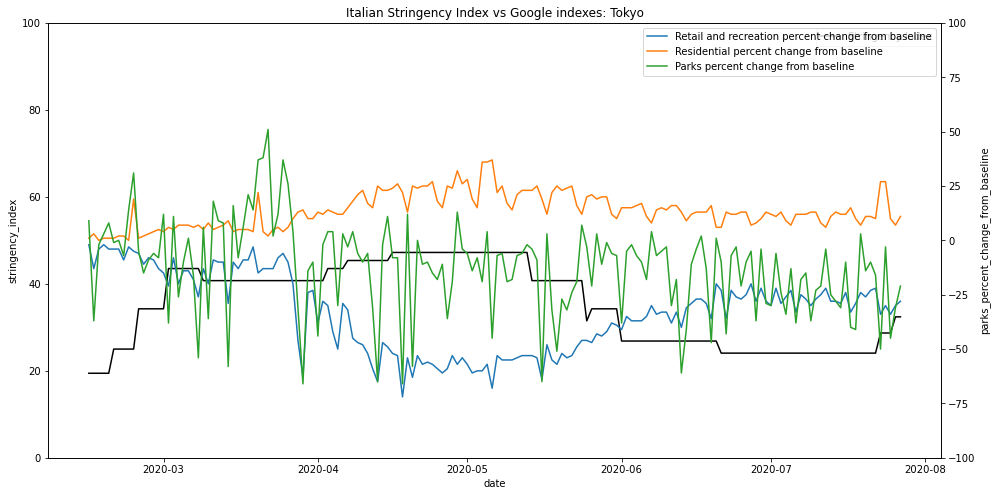

In [985]:
### Region Google Mobility

i = 'Tokyo'
#country = 'Italy'

mf10 = merge_gf_mf[merge_gf_mf.sub_region_1.isin([i])]
mf10 = merge_gf_mf[merge_gf_mf.sub_region_1.isin([i])]

f, ax = plt.subplots(figsize=(16, 8))
ax = sns.lineplot(data=mf10, x="date", y="stringency_index", color='black', label='Stringency Index')

plt.title('Italian Stringency Index vs Google indexes: ' + i) 
#plt.legend(loc=2)

# Mobility Indexes plot
ax2 = ax.twinx()
ax2 = sns.lineplot(data=mf10, x="date", y="retail_and_recreation_percent_change_from_baseline", label='Retail and recreation percent change from baseline')
ax2 = sns.lineplot(data=mf10, x="date", y="residential_percent_change_from_baseline", label='Residential percent change from baseline')
ax2 = sns.lineplot(data=mf10, x="date", y="parks_percent_change_from_baseline", label='Parks percent change from baseline')



#ax2.set(yscale='log')
#plt.legend(loc=1)
        
ax.set(ylim=(0, 100))
ax2.set(ylim=(-100, 100))
plt.savefig('output/World Stringency Index vs Google_' + i + '.png', format="PNG", dpi=300)

#ax.set(xscale='log')
#ax.set(yscale='log')
#axplt.show()

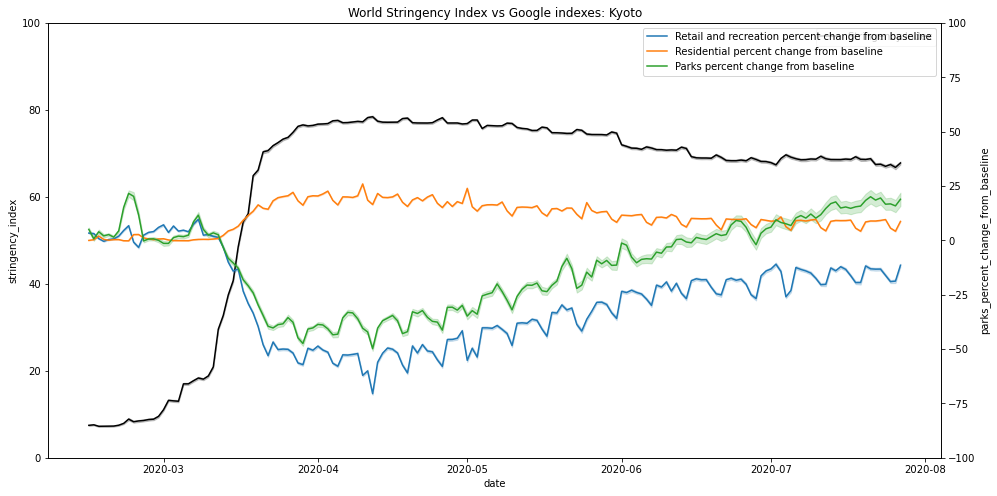

In [984]:
### Region Google Mobility

mf10 = merge_gf_mf

f, ax = plt.subplots(figsize=(16, 8))
ax = sns.lineplot(data=mf10, x="date", y="stringency_index", color='black', label='Stringency Index')

plt.title('World Stringency Index vs Google indexes: ' + i) 
#plt.legend(loc=2)

# Mobility Indexes plot
ax2 = ax.twinx()
ax2 = sns.lineplot(data=mf10, x="date", y="retail_and_recreation_percent_change_from_baseline", label='Retail and recreation percent change from baseline')
ax2 = sns.lineplot(data=mf10, x="date", y="residential_percent_change_from_baseline", label='Residential percent change from baseline')
ax2 = sns.lineplot(data=mf10, x="date", y="parks_percent_change_from_baseline", label='Parks percent change from baseline')

#ax2.set(yscale='log')
#plt.legend(loc=1)
        
ax.set(ylim=(0, 100))
ax2.set(ylim=(-100, 100))
plt.savefig('output/World Stringency Index vs Google_3' + '.png', format="PNG", dpi=300)

#ax.set(xscale='log')
#ax.set(yscale='log')
#axplt.show()

In [897]:
gf_mean.head()

,retail_and_recreation_percent_change_from_baseline,grocery_and_pharmacy_percent_change_from_baseline,parks_percent_change_from_baseline,transit_stations_percent_change_from_baseline,workplaces_percent_change_from_baseline,residential_percent_change_from_baseline
date,,,,,,
2020-02-15,3.503106,1.541842,4.585854,1.669475,2.025773,0.022558
2020-02-16,3.350301,1.634023,1.692205,0.685825,0.448677,0.340881
2020-02-17,1.059469,-0.185812,4.399384,0.014685,-2.571753,1.511395
2020-02-18,0.133559,-0.243155,3.147970,0.574660,3.954219,0.238832
2020-02-19,0.479518,-0.300895,3.353015,0.318922,4.231041,-0.070516


In [921]:
# merge google mobility indexes and Oxford stringency indexes
merge10 = pd.merge(gov_index_means, gf_mean, how = 'inner', on = ['date'])

In [922]:
merge10.corr().style.background_gradient(cmap='Reds').format("{:.3f}")

,StringencyIndex,GovernmentResponseIndex,ContainmentHealthIndex,EconomicSupportIndex,total_cases,new_cases,retail_and_recreation_percent_change_from_baseline,grocery_and_pharmacy_percent_change_from_baseline,parks_percent_change_from_baseline,transit_stations_percent_change_from_baseline,workplaces_percent_change_from_baseline,residential_percent_change_from_baseline
StringencyIndex,1.000,0.986,0.996,0.798,0.217,0.387,-0.875,-0.662,-0.619,-0.926,-0.850,0.881
GovernmentResponseIndex,0.986,1.000,0.996,0.884,0.364,0.516,-0.792,-0.564,-0.486,-0.856,-0.786,0.809
ContainmentHealthIndex,0.996,0.996,1.000,0.842,0.293,0.454,-0.833,-0.609,-0.552,-0.892,-0.817,0.845
EconomicSupportIndex,0.798,0.884,0.842,1.000,0.709,0.789,-0.457,-0.235,-0.055,-0.544,-0.508,0.497
total_cases,0.217,0.364,0.293,0.709,1.000,0.963,0.178,0.315,0.591,0.096,0.048,-0.113
new_cases,0.387,0.516,0.454,0.789,0.963,1.000,-0.027,0.133,0.413,-0.100,-0.126,0.074
retail_and_recreation_percent_change_from_baseline,-0.875,-0.792,-0.833,-0.457,0.178,-0.027,1.000,0.909,0.883,0.984,0.876,-0.918
grocery_and_pharmacy_percent_change_from_baseline,-0.662,-0.564,-0.609,-0.235,0.315,0.133,0.909,1.000,0.863,0.868,0.769,-0.782
parks_percent_change_from_baseline,-0.619,-0.486,-0.552,-0.055,0.591,0.413,0.883,0.863,1.000,0.843,0.731,-0.801
transit_stations_percent_change_from_baseline,-0.926,-0.856,-0.892,-0.544,0.096,-0.100,0.984,0.868,0.843,1.000,0.922,-0.953


In [ ]:
# the positive correlations between new_cases and residential_percent is not causality. 

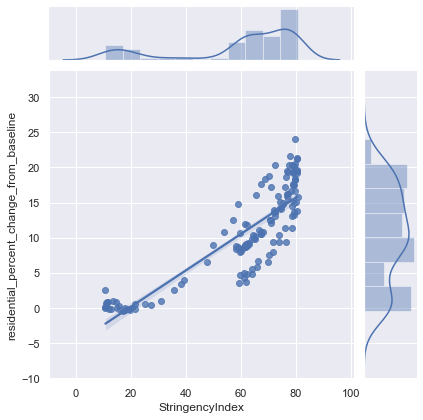

In [755]:
g = sns.jointplot(x='StringencyIndex', y='residential_percent_change_from_baseline', data=merge10,
              kind="reg", dropna=True);

#the more stringency, the more people stay home.

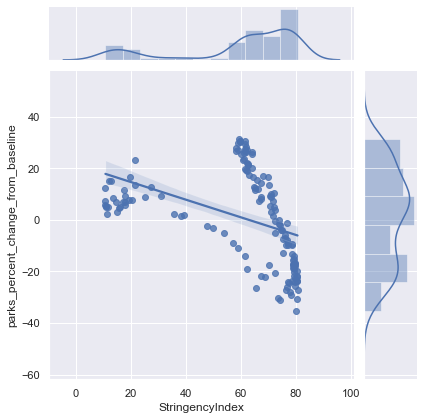

In [760]:
g = sns.jointplot(x='StringencyIndex', y='parks_percent_change_from_baseline', data=merge10,
              kind="reg", dropna=True);

#the graph is in V shape because people quickly went back to parks

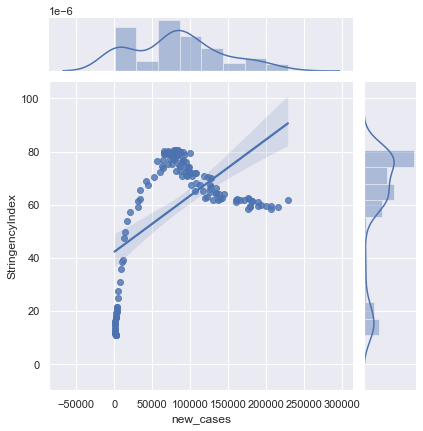

In [924]:
g = sns.jointplot(x='new_cases', y='StringencyIndex', data=merge10,
              kind="reg", dropna=True);

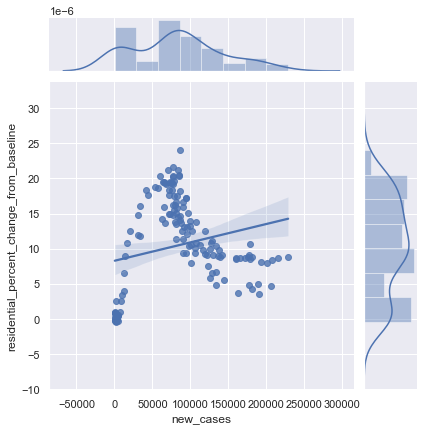

In [925]:
g = sns.jointplot(x='new_cases', y='residential_percent_change_from_baseline', data=merge10,
              kind="reg", dropna=True);

In [ ]:
# residential index > Google + new cases
sub_region_2 = ['Bronx County', 'New York County', 'Salt Lake County']

for i in sub_region_2:
    print(i)
    temp = []
    temp = gf[gf.sub_region_2.isin([i])]
    
    f, ax1 = plt.subplots(figsize=(16, 8))
    ax1 = sns.lineplot(data=temp, x="date", y="retail_and_recreation_percent_change_from_baseline", label='retail_and_recreation_percent_change_from_baseline')
    ax1 = sns.lineplot(data=temp, x="date", y="grocery_and_pharmacy_percent_change_from_baseline", label='grocery_and_pharmacy_percent_change_from_baseline')
    ax1 = sns.lineplot(data=temp, x="date", y="parks_percent_change_from_baseline", label='parks_percent_change_from_baseline')
    ax1 = sns.lineplot(data=temp, x="date", y="transit_stations_percent_change_from_baseline", label='transit_stations_percent_change_from_baseline')
    ax1 = sns.lineplot(data=temp, x="date", y="workplaces_percent_change_from_baseline", label='workplaces_percent_change_from_baseline')
    ax1 = sns.lineplot(data=temp, x="date", y="residential_percent_change_from_baseline", label='residential_percent_change_from_baseline')
    ax1.set_ylabel('Indexes')
    ax1.set_ylim(-100,100)
    ax1.title.set_text(i) 
    #ax1.get_legend().remove()
    #plt.legend(loc= 3, bbox_to_anchor=(0, -0.6))
    plt.savefig('output/Google_indexes_' + i + '.png', format="PNG", dpi=300)
    plt.show()

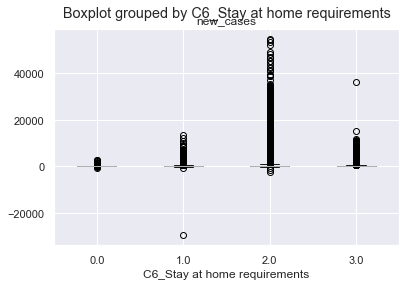

In [792]:
merge.boxplot('new_cases', by='C6_Stay at home requirements')

In [909]:
merge20 = merge[['new_cases', 'C6_Stay at home requirements']]
merge20 = merge20.rename(columns = {'C6_Stay at home requirements' : 'C6_Stay_at_home_requirements'})
merge20.head()
merge20.dropna(inplace=True)
merge20.isnull().sum()

new_cases                       0
C6_Stay_at_home_requirements    0
dtype: int64

In [910]:
grps = pd.unique(merge20.C6_Stay_at_home_requirements.values)
d_data = {grp:merge20['new_cases'][merge20.C6_Stay_at_home_requirements == grp] for grp in grps}
k = len(pd.unique(merge20.C6_Stay_at_home_requirements))
N = len(merge20.values)

In [919]:
f, p = stats.f_oneway(d_data[0.], d_data[1.], d_data[2.], d_data[3.])
f, p

(247.88215058627702, 2.261365976886031e-158)

In [920]:
ss_between = (sum(merge20.groupby('C6_Stay_at_home_requirements').sum()['new_cases']**2)/n) - (merge20['new_cases'].sum()**2)/N
sum_y_squared = sum([value**2 for value in merge20['new_cases'].values])
ss_within = sum_y_squared - sum(merge20.groupby('C6_Stay_at_home_requirements').sum()['new_cases']**2)/n
ss_total = sum_y_squared - (merge20['new_cases'].sum()**2)/N

df_between = k - 1
df_within = N - 1
df_total = N -1

ms_between = ss_between/df_between
ms_within = ss_within/df_within
f = ms_between/ms_within

p = stats.f.sf(f, df_between, df_within)

eta_squared = ss_between/ss_total
omega_squared = (ss_between - (df_between * ms_within))/(ss_total+ms_within)

f, p, eta_squared, omega_squared

(143.5591838678125,
 3.488478530144204e-92,
 0.018004404376688255,
 0.01787824247195284)

In [921]:
merge11 = merge10

In [922]:
merge11.isnull().sum()

StringencyIndex                                       0
GovernmentResponseIndex                               0
ContainmentHealthIndex                                0
EconomicSupportIndex                                  0
total_cases                                           0
new_cases                                             0
retail_and_recreation_percent_change_from_baseline    0
grocery_and_pharmacy_percent_change_from_baseline     0
parks_percent_change_from_baseline                    0
transit_stations_percent_change_from_baseline         0
workplaces_percent_change_from_baseline               0
residential_percent_change_from_baseline              0
dtype: int64

In [923]:
merge11 = merge11.dropna()

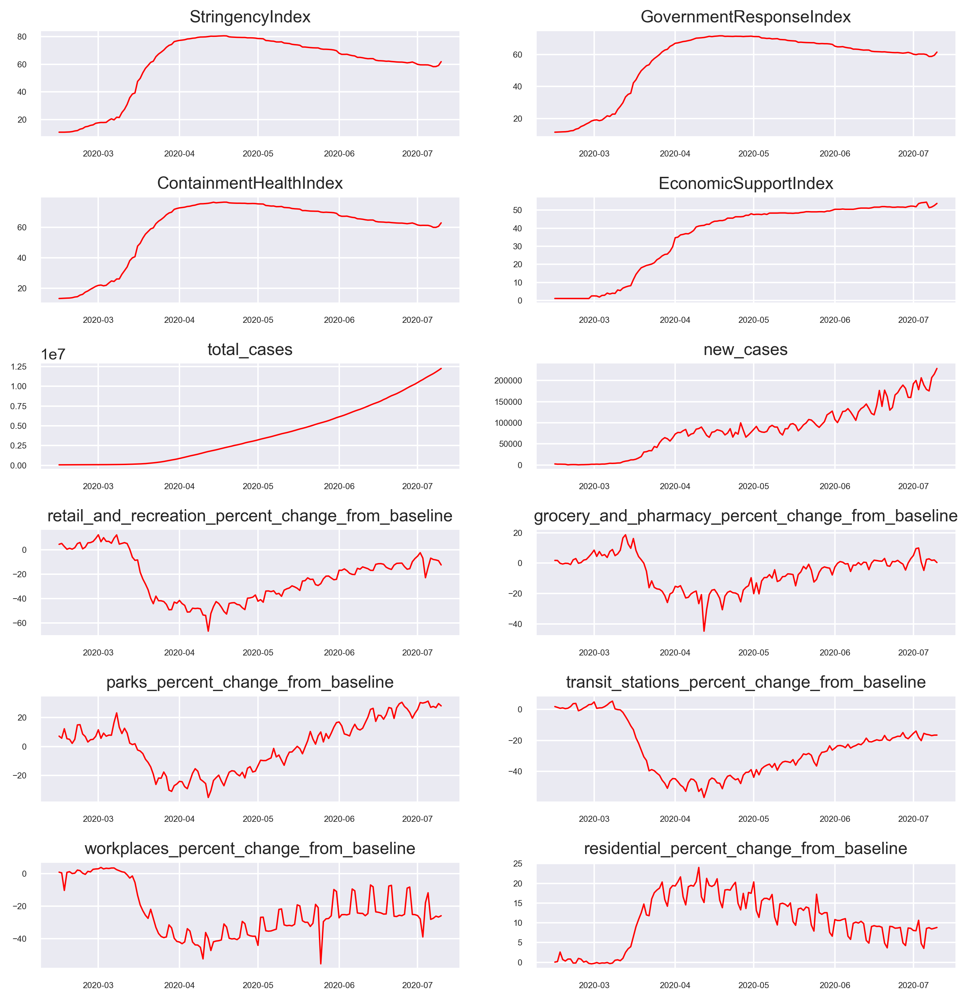

In [769]:
# Plot
fig, axes = plt.subplots(nrows=6, ncols=2, dpi=300, figsize=(10,10))
for i, ax in enumerate(axes.flatten()):
 data = merge11[merge11.columns[i]]
 ax.plot(data, color='red', linewidth=1)
 ax.set_title(merge11.columns[i])
 ax.xaxis.set_ticks_position('none')
 ax.yaxis.set_ticks_position('none')
 ax.spines['top'].set_alpha(0)
 ax.tick_params(labelsize=6)
plt.tight_layout();

In [774]:
from scipy import stats

stat,p = stats.normaltest(merge11.total_cases)
print("Statistics = %.3f, p=%.3f" % (stat,p))
alpha = 0.05
if p> alpha:
    print('Data looks Gaussian (fail to reject null hypothesis)')
else:
    print('Data looks non-Gaussian (reject null hypothesis')

Statistics = 17.198, p=0.000
Data looks non-Gaussian (reject null hypothesis


count       147.000000
mean      82865.653061
std       58035.380335
min         453.000000
25%       33930.500000
50%       81225.000000
75%      118779.500000
max      228608.000000
Name: new_cases, dtype: float64

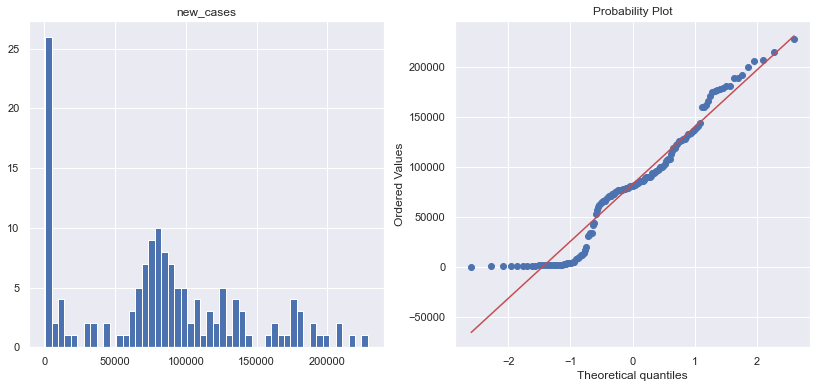

In [784]:
a = 'new_cases'

plt.figure(figsize=(14,6))
plt.subplot(1,2,1)
merge11[a].hist(bins=50)
plt.title(a)
plt.subplot(1,2,2)
stats.probplot(merge11[a], plot=plt);
merge11[a].describe().T

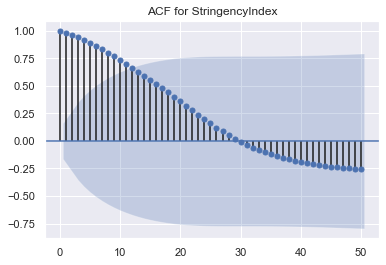

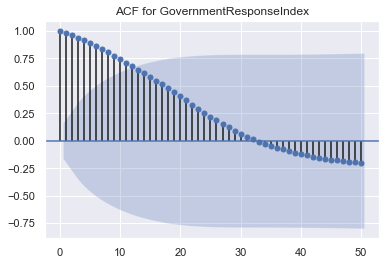

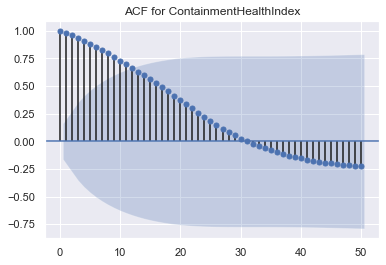

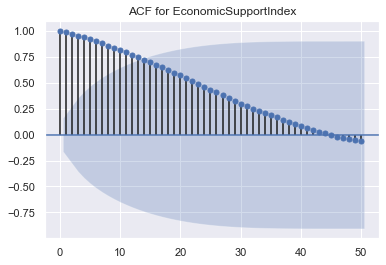

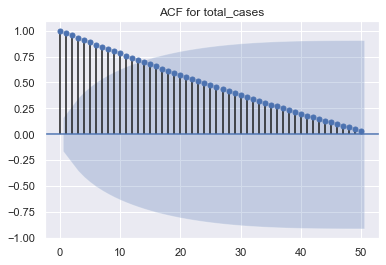

...

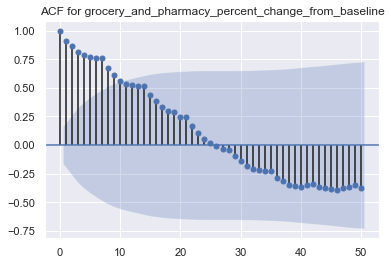

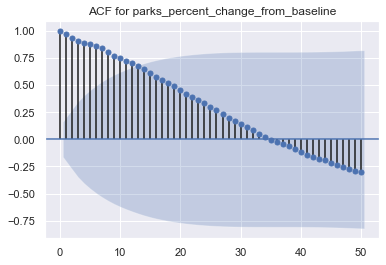

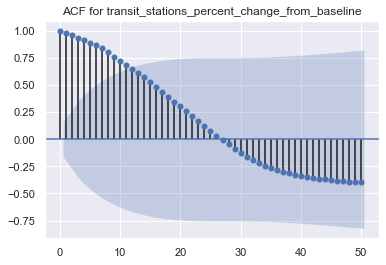

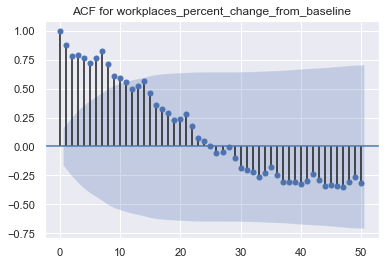

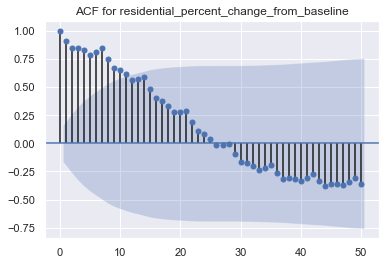

In [788]:
from statsmodels.graphics.tsaplots import plot_acf
# plots the autocorrelation plots at 50 lags
for i in merge11:
    plot_acf(merge11[i], lags = 50)
    plt.title('ACF for %s' % i)
    plt.show()

In [178]:
df_continents_cases = merge.copy().drop(merge.columns.difference(['continent', 'date', 'new_cases','new_deaths', 'new_tests', 'population']), 1)
df_continents_cases = df_continents_cases.groupby(['continent']).sum()
del df_continents_cases['population']

df_countries_cases.fillna(0,inplace=True)
df_continents_cases.fillna(0,inplace=True)

NameError: name 'df_countries_cases' is not defined

In [179]:
df_continents_cases.head(10)

,new_cases,new_deaths,new_tests
continent,,,
Africa,594649.0,13155.0,4033587.0
Asia,2963236.0,70341.0,31216326.0
Europe,2529673.0,196337.0,48877982.0
North America,3901157.0,183654.0,43052842.0
Oceania,11456.0,137.0,3155765.0
South America,2887154.0,105105.0,3109968.0


In [180]:
#List of Countries and populations
countries_pop = merge.groupby(['location'])['population', 'continent'].max()
countries_pop2 = countries_pop.groupby(['continent'])['population'].sum().to_frame()

countries_pop2.head(10)

<ipython-input-180-782a59069163>:2: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  countries_pop = merge.groupby(['location'])['population', 'continent'].max()


,population
continent,
Africa,1.339424e+09
Asia,4.607388e+09
Europe,7.485062e+08
North America,5.912425e+08
Oceania,4.095832e+07
South America,4.304611e+08


In [181]:
df_continents_cases = pd.merge(df_continents_cases, countries_pop2, on ='continent',
                      how ='left')
df_continents_cases

,new_cases,new_deaths,new_tests,population
continent,,,,
Africa,594649.0,13155.0,4033587.0,1.339424e+09
Asia,2963236.0,70341.0,31216326.0,4.607388e+09
Europe,2529673.0,196337.0,48877982.0,7.485062e+08
North America,3901157.0,183654.0,43052842.0,5.912425e+08
Oceania,11456.0,137.0,3155765.0,4.095832e+07
South America,2887154.0,105105.0,3109968.0,4.304611e+08


In [182]:
df_continents_cases["Test Rate (per 100)"] = np.round(100*df_continents_cases["new_tests"]/df_continents_cases["population"],2)
df_continents_cases["Mortality Rate (per 100)"] = np.round(100*df_continents_cases["new_deaths"]/df_continents_cases["new_cases"],2)

df_continents_cases.style.background_gradient(cmap='Blues',subset=["new_cases"])\
                        .background_gradient(cmap='Reds',subset=["new_deaths"])\
                        .background_gradient(cmap='Greens',subset=["Mortality Rate (per 100)"])\
                        .background_gradient(cmap='YlOrBr',subset=["Test Rate (per 100)"])\
                        .format("{:.2f}")\
                        .format("{:,.0f}",subset=["new_cases","new_deaths", "new_tests", "population"])

,new_cases,new_deaths,new_tests,population,Test Rate (per 100),Mortality Rate (per 100)
continent,,,,,,
Africa,"594,649","13,155","4,033,587","1,339,423,921",0.30,2.21
Asia,"2,963,236","70,341","31,216,326","4,607,388,081",0.68,2.37
Europe,"2,529,673","196,337","48,877,982","748,506,210",6.53,7.76
North America,"3,901,157","183,654","43,052,842","591,242,473",7.28,4.71
Oceania,"11,456",137,"3,155,765","40,958,320",7.70,1.20
South America,"2,887,154","105,105","3,109,968","430,461,090",0.72,3.64


In [183]:
df_countries_cases = merge.copy().drop(merge.columns.difference(['iso_code', 'continent', 'location', 'date', 'new_cases','new_deaths','new_cases_per_millio', 'new_tests', 'population']), 1)
df_countries_cases = df_countries_cases.groupby(['location']).sum()
df_countries_cases = df_countries_cases.drop(['population'],axis=1)
df_countries_cases


,new_cases,new_deaths,new_tests
location,,,
Afghanistan,34451.0,1010.0,0.0
Albania,3454.0,93.0,0.0
Algeria,19195.0,1011.0,0.0
Andorra,855.0,52.0,0.0
Angola,506.0,26.0,0.0
...,...,...,...
Vietnam,372.0,0.0,62378.0
Western Sahara,519.0,1.0,0.0
Yemen,1465.0,417.0,0.0


In [184]:
countries_pop = countries_pop.drop(['continent'],axis=1)
df_countries_cases = pd.merge(df_countries_cases, countries_pop, on ='location',
                      how ='left')
df_countries_cases

,new_cases,new_deaths,new_tests,population
location,,,,
Afghanistan,34451.0,1010.0,0.0,38928341.0
Albania,3454.0,93.0,0.0,2877800.0
Algeria,19195.0,1011.0,0.0,43851043.0
Andorra,855.0,52.0,0.0,77265.0
Angola,506.0,26.0,0.0,32866268.0
...,...,...,...,...
Vietnam,372.0,0.0,62378.0,97338583.0
Western Sahara,519.0,1.0,0.0,597330.0
Yemen,1465.0,417.0,0.0,29825968.0


In [185]:
df_countries_cases["Test Rate (per 100)"] = np.round(100*df_countries_cases["new_tests"]/df_countries_cases["population"],2)
df_countries_cases["Mortality Rate (per 100)"] = np.round(100*df_countries_cases["new_deaths"]/df_countries_cases["new_cases"],2)

df_countries_cases.replace([np.inf, -np.inf], np.nan)
df_countries_cases.dropna(inplace=True)

df_countries_cases.sort_values('new_cases', ascending= False).style.background_gradient(cmap='Blues',subset=["new_cases"])\
                        .background_gradient(cmap='Reds',subset=["new_deaths"])\
                        .background_gradient(cmap='Greens',subset=["Mortality Rate (per 100)"])\
                        .background_gradient(cmap='YlOrBr',subset=["Test Rate (per 100)"])\
                        .format("{:.2f}")\
                        .format("{:,.0f}",subset=["new_cases","new_deaths", "new_tests", "population"])

,new_cases,new_deaths,new_tests,population,Test Rate (per 100),Mortality Rate (per 100)
location,,,,,,
United States,"3,304,942","135,205","38,915,283","331,002,647",11.76,4.09
Brazil,"1,864,681","72,100",0,"212,559,409",0.00,3.87
India,"878,254","23,174","11,172,114","1,380,004,385",0.81,2.64
Russia,"727,162","11,335","21,990,738","145,934,460",15.07,1.56
Peru,"326,326","11,870","202,311","32,971,846",0.61,3.64
Chile,"315,041","6,979","1,217,319","19,116,209",6.37,2.22
Mexico,"299,750","35,006","622,450","128,932,753",0.48,11.68
United Kingdom,"289,603","44,819","6,624,154","67,886,004",9.76,15.48
South Africa,"276,242","4,079","2,046,027","59,308,690",3.45,1.48


In [186]:
df_countries_cases.sort_values("Test Rate (per 100)", ascending= False).style.background_gradient(cmap='Blues',subset=["new_cases"])\
                        .background_gradient(cmap='Reds',subset=["new_deaths"])\
                        .background_gradient(cmap='Greens',subset=["Mortality Rate (per 100)"])\
                        .background_gradient(cmap='YlOrBr',subset=["Test Rate (per 100)"])\
                        .format("{:.2f}")\
                        .format("{:,.0f}",subset=["new_cases","new_deaths", "new_tests", "population"])

,new_cases,new_deaths,new_tests,population,Test Rate (per 100),Mortality Rate (per 100)
location,,,,,,
Luxembourg,"4,925",111,"245,761","625,976",39.26,2.25
United Arab Emirates,"54,854",333,"3,031,449","9,890,400",30.65,0.61
Bahrain,"32,941",109,"516,742","1,701,583",30.37,0.33
Malta,674,9,"104,099","441,539",23.58,1.34
Denmark,"12,946",609,"1,184,480","5,792,203",20.45,4.70
Iceland,"1,896",10,"67,729","341,250",19.85,0.53
Russia,"727,162","11,335","21,990,738","145,934,460",15.07,1.56
Lithuania,"1,869",79,"386,701","2,722,291",14.20,4.23
Qatar,"103,598",147,"390,282","2,881,060",13.55,0.14


In [188]:
df_countries_cases.sort_values("Mortality Rate (per 100)", ascending= False).style.background_gradient(cmap='Blues',subset=["new_cases"])\
                        .background_gradient(cmap='Reds',subset=["new_deaths"])\
                        .background_gradient(cmap='Greens',subset=["Mortality Rate (per 100)"])\
                        .background_gradient(cmap='YlOrBr',subset=["Test Rate (per 100)"])\
                        .format("{:.2f}")\
                        .format("{:,.0f}",subset=["new_cases","new_deaths", "new_tests", "population"])

,new_cases,new_deaths,new_tests,population,Test Rate (per 100),Mortality Rate (per 100)
location,,,,,,
Yemen,"1,465",417,0,"29,825,968",0.00,28.46
Sint Maarten (Dutch part),78,15,0,"42,882",0.00,19.23
France,"170,752","30,004","1,583,510","65,273,512",2.43,17.57
Belgium,"62,707","9,782","1,052,518","11,589,616",9.08,15.60
United Kingdom,"289,603","44,819","6,624,154","67,886,004",9.76,15.48
Italy,"243,061","34,954","5,896,228","60,461,828",9.75,14.38
Hungary,"4,234",595,"285,645","9,660,350",2.96,14.05
British Virgin Islands,8,1,0,"30,237",0.00,12.50
Netherlands,"50,967","6,128","6,296","17,134,873",0.04,12.02


In [189]:
df_countries_cases.sort_values("Mortality Rate * Test Rate * infectious rate", ascending= False).style.background_gradient(cmap='Blues',subset=["new_cases"])\
                        .background_gradient(cmap='Reds',subset=["new_deaths"])\
                        .background_gradient(cmap='Oranges',subset=["infectious rate (per 100)"])\
                        .background_gradient(cmap='Greens',subset=["Mortality Rate (per 100)"])\
                        .background_gradient(cmap='YlOrBr',subset=["Test Rate (per 100)"])\
                        .format("{:.2f}")\
                        .format("{:,.0f}",subset=["new_cases","new_deaths", "new_tests", "population"])

KeyError: 'Mortality Rate * Test Rate * infectious rate'

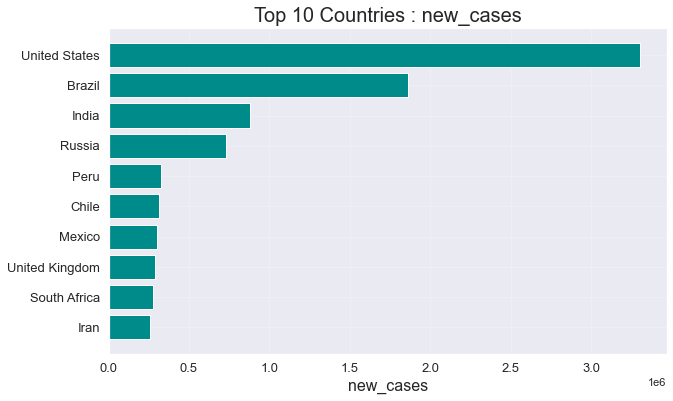

In [190]:
af = plt.figure(figsize=(10,6))
af.add_subplot(111)

variable = 'new_cases'

plt.axes(axisbelow=True)
plt.barh(df_countries_cases.sort_values(variable)[variable].index[-10:],df_countries_cases.sort_values(variable)[variable].values[-10:],color="darkcyan")
plt.tick_params(size=5,labelsize = 13)
plt.xlabel(variable,fontsize=16)
plt.title("Top 10 Countries : %s" %variable, fontsize=20)
plt.grid(alpha=0.2)
plt.savefig('output/top_10_' + variable + '_' + str(datetime.datetime.now()) + '.png', format="PNG", dpi=300)

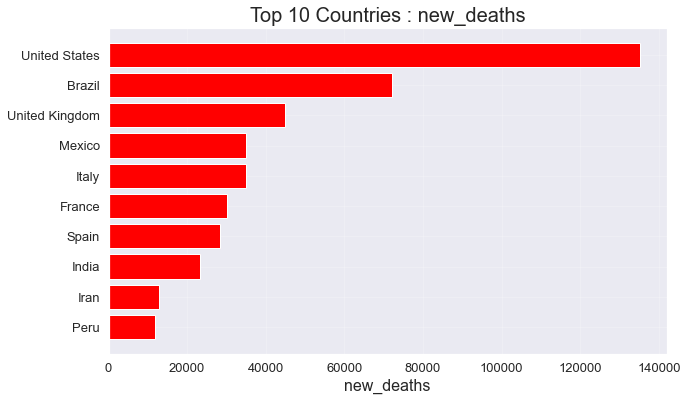

In [191]:
af = plt.figure(figsize=(10,6))
af.add_subplot(111)

variable = 'new_deaths'

plt.axes(axisbelow=True)
plt.barh(df_countries_cases.sort_values(variable)[variable].index[-10:],df_countries_cases.sort_values(variable)[variable].values[-10:],color="red")
plt.tick_params(size=5,labelsize = 13)
plt.xlabel(variable,fontsize=16)
plt.title("Top 10 Countries : %s" %variable, fontsize=20)
plt.grid(alpha=0.2)
plt.savefig('output/top_10_' + variable + '_' + str(datetime.datetime.now()) + '.png', format="PNG", dpi=300)

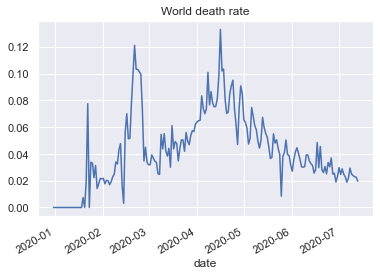

In [215]:
#World death rate through time
world_death_rate = merge.copy().drop(merge.columns.difference(['location', 'date', 'new_cases','new_deaths']), 1)
world_death_rate = world_death_rate.groupby(['date']).sum()
world_death_rate['death_rate'] = world_death_rate.new_deaths / world_death_rate.new_cases
world_death_rate.fillna(0,inplace=True)
world_death_rate = world_death_rate.drop(world_death_rate[(world_death_rate.death_rate > 0.15)].index)
world_death_rate.death_rate.plot(title='World death rate')


In [459]:
# create timeseries with new cases only
df_confirmed = mf[['location', 'date', 'new_cases']]
df_confirmed = df_confirmed.replace(np.nan, '0', regex=True)
df_confirmed['new_cases'] = df_confirmed['new_cases'].astype(float) #cumsum not working otherwise

#Create pivot and then cumsum the numbers
table = pd.pivot_table(df_confirmed, index=['location'],
                       columns=['date'], values=['new_cases'], fill_value=0, aggfunc='sum')
table.cumsum(axis=1)

new_cases                                              \
date           2019-12-31 2020-01-01 2020-01-02 2020-01-03 2020-01-04   
location                                                                
Afghanistan             0          0          0          0          0   
Albania                 0          0          0          0          0   
Algeria                 0          0          0          0          0   
Andorra                 0          0          0          0          0   
Angola                  0          0          0          0          0   
...                   ...        ...        ...        ...        ...   
Vietnam                 0          0          0          0          0   
Western Sahara          0          0          0          0          0   
Yemen                   0          0          0          0          0   
Zambia                  0          0          0          0          0   
Zimbabwe                0          0          0          0          0   

                                                                       ...  \
date           2020-01-05 2020-01-06 2020-01-07 2020-01-08 2020-01-09  ...   
location                                                               ...   
Afghanistan             0          0          0          0          0  ...   
Albania                 0          0          0          0          0  ...   
Algeria                 0          0          0          0          0  ...   
Andorra                 0          0          0          0          0  ...   
Angola                  0          0          0          0          0  ...   
...                   ...        ...        ...        ...        ...  ...   
Vietnam                 0          0          0          0          0  ...   
Western Sahara          0          0          0          0          0  ...   
Yemen                   0          0          0          0          0  ...   
Zambia                  0          0          0          0          0  ...   
Zimbabwe                0          0          0          0          0  ...   

                                                                       \
date           2020-07-04 2020-07-05 2020-07-06 2020-07-07 2020-07-08   
location                                                                
Afghanistan         32324      32672      32951      33384      33594   
Albania              2752       2819       2893       2964       3038   
Algeria             15070      15500      15941      16404      16879   
Andorra               855        855        855        855        855   
Angola                328        346        346        353        353   
...                   ...        ...        ...        ...        ...   
Vietnam               355        355        355        369        369   
Western Sahara        519        519        519        519        519   
Yemen                1240       1248       1265       1290       1297   
Zambia               1632       1632       1632       1632       1895   
Zimbabwe              625        698        716        734        787   

                                                                       
date           2020-07-09 2020-07-10 2020-07-11 2020-07-12 2020-07-13  
location                                                               
Afghanistan         33653      33908      34366      34451      34451  
Albania              3106       3188       3278       3371       3454  
Algeria             17348      17808      17808      18712      19195  
Andorra               855        855        855        855        855  
Angola                386        396        458        483        506  
...                   ...        ...        ...        ...        ...  
Vietnam               369        369        370        370        372  
Western Sahara        519        519        519        519        519  
Yemen                1318       1356       1380       1389       1465  
Zambia       

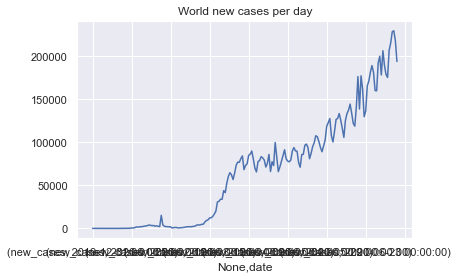

In [372]:
# plot new cases world
np.sum(table).plot(title = "World new cases per day")

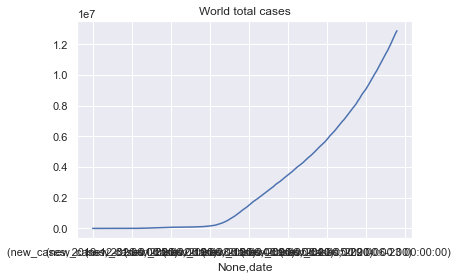

In [373]:
# plot cumulative new cases
np.sum(table).cumsum().plot(title = "World total cases")

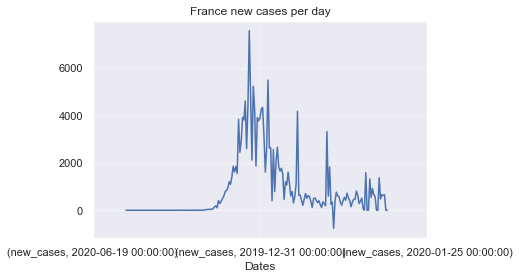

In [425]:
#France plot new cases
fig, axs = plt.subplots(figsize=(6,4))

np.sum(table.iloc[table.index == 'France']).plot(title = "France new cases per day")
plt.grid(alpha = 0.5)
plt.xlabel("Dates",fontsize=12)
axs.set_xticks(axs.get_xticks()[::5]) #divide axis density
plt.show()



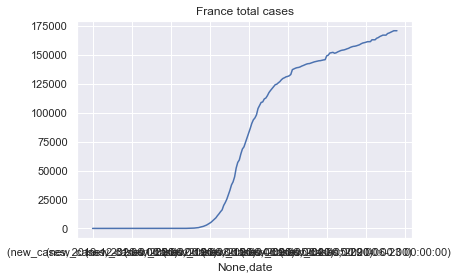

In [375]:
#France plot new cases cumulative
np.sum(table.iloc[table.index == 'France']).cumsum().plot(title = "France total cases")

In [354]:
np.sum(np.asarray(table.iloc[:,5:]),axis = 0)[-1]

194026

In [366]:
#Latest new cases in France
np.sum(np.asarray(table[table.index == 'France'].iloc[:,5:]),axis = 0)[-1]

0

In [367]:
#Latest cumulative cases in France
np.sum(table.iloc[table.index == 'France']).cumsum()[-1]

170752

In [ ]:
cols = 1
rows = 1
f = plt.figure(figsize=(10,10*rows))

visualize_covid_cases(df_confirmed, df_deaths,continent = "All",figure = [f,rows,cols, 1])

plt.savefig('output/Covid_World' + str(datetime.datetime.now()) + '.png', format="PNG", dpi=300)
plt.show()

In [500]:
df10 = df_original

In [501]:
df10.head()

,CountryName,CountryCode,Date,C1_School closing,C1_Flag,C2_Workplace closing,C2_Flag,C3_Cancel public events,C3_Flag,C4_Restrictions on gatherings,...,StringencyIndexForDisplay,StringencyLegacyIndex,StringencyLegacyIndexForDisplay,GovernmentResponseIndex,GovernmentResponseIndexForDisplay,ContainmentHealthIndex,ContainmentHealthIndexForDisplay,EconomicSupportIndex,EconomicSupportIndexForDisplay,death_rate
Date,,,,,,,,,,,,,,,,,,,,,
2020-01-01,Aruba,ABW,2020-01-01,0.0,NaN,0.0,NaN,0.0,NaN,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
2020-01-02,Aruba,ABW,2020-01-02,0.0,NaN,0.0,NaN,0.0,NaN,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
2020-01-03,Aruba,ABW,2020-01-03,0.0,NaN,0.0,NaN,0.0,NaN,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
2020-01-04,Aruba,ABW,2020-01-04,0.0,NaN,0.0,NaN,0.0,NaN,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
2020-01-05,Aruba,ABW,2020-01-05,0.0,NaN,0.0,NaN,0.0,NaN,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN


In [509]:
def white_plot_confirmed(data,lockdown,month_lockdown,country):
    fig = go.Figure()
    fig.add_trace(go.Scatter(x=data["Date"],
                             y=data['ConfirmedCases'],
                             mode="lines+text",
                             name='Confirmed cases',
                             marker_color='black',
                            ))

    fig.add_annotation(
            x=lockdown,
            y=data['ConfirmedCases'].max(),
            text="COVID-19 pandemic lockdown in "+ country,
             font=dict(
            family="Courier New, monospace",
            size=16,
            color="red"
            ),
    )


    fig.add_shape(
        # Line Vertical
        dict(
            type="line",
            x0=lockdown,
            y0=data['ConfirmedCases'].max(),
            x1=lockdown,
    
            line=dict(
                color="red",
                width=3
            )
    ))
    fig.add_annotation(
            x=month_lockdown,
            y=data['ConfirmedCases'].min(),
            text="Month after lockdown",
             font=dict(
            family="Courier New, monospace",
            size=16,
            color="rgb(209,175,232)"
            ),
    )

    fig.add_shape(
        # Line Vertical
        dict(
            type="line",
            x0=month_lockdown,
            y0=data['ConfirmedCases'].max(),
            x1=month_lockdown,
    
            line=dict(
                color="rgb(209,175,232)",
                width=3
            )
    ))
    fig
    fig.update_layout(
        title='Evolution of Confirmed cases over time in '+ country,
        template='plotly_white'
    )

    fig.show()

In [510]:
Data_Italy = df10[(df10['CountryName'] == 'Italy') ].reset_index(drop=True)
Data_italy_op= Data_Italy.groupby(["Date"])[["ConfirmedCases","ConfirmedDeaths"]].sum().reset_index().reset_index(drop=True)

In [513]:
import plotly.graph_objects as go
white_plot_confirmed(Data_italy_op,"2020-03-09","2020-04-09","Italy")

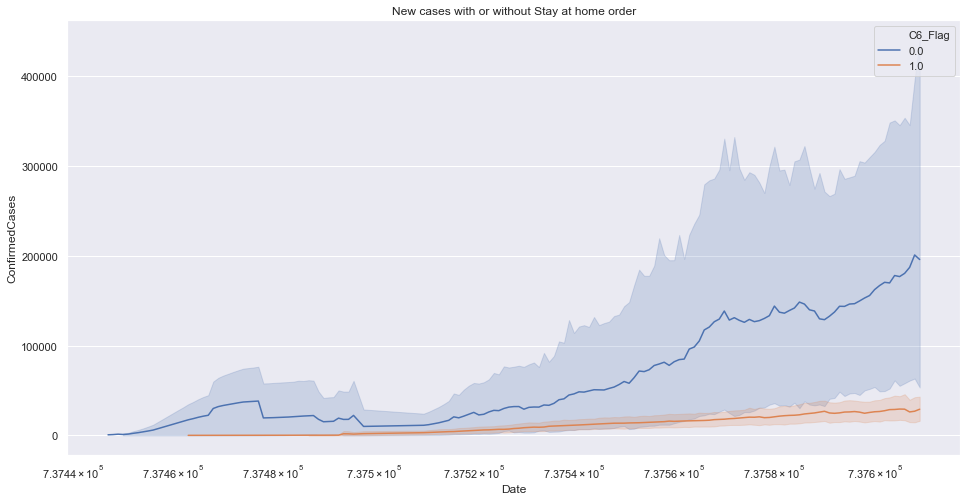

In [532]:
f, ax = plt.subplots(figsize=(16, 8))
df2 = df[df.CountryName.isin(['United States', 'France', 'United Kingdom', 'Switzerland', 'China'])]
ax = sns.lineplot(data=df, x="Date", y="ConfirmedCases", hue='C6_Flag')

#axes limit
#ax.set(xlim=(10, 1000000))
#ax.set(ylim=(0, 3.5))

#scale
ax.set(xscale='log')

plt.title('New cases with or without Stay at home order') 
plt.show()

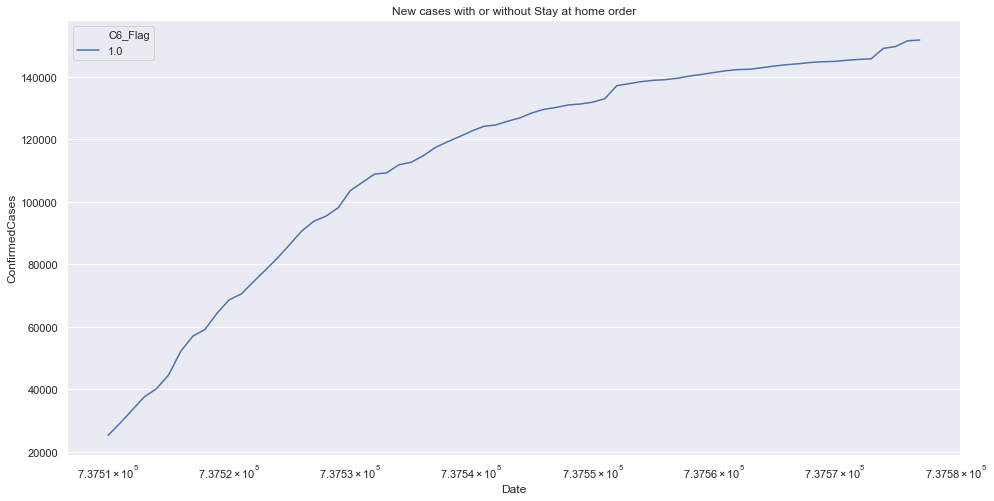

In [534]:
f, ax = plt.subplots(figsize=(16, 8))
df3 = df[df.CountryName.isin(['France'])]
ax = sns.lineplot(data=df3, x="Date", y="ConfirmedCases", hue='C6_Flag')

#axes limit
#ax.set(xlim=(10, 1000000))
#ax.set(ylim=(0, 3.5))

#scale
ax.set(xscale='log')

plt.title('New cases with or without Stay at home order') 
plt.show()

In [980]:
ny = pd.read_csv('https://raw.githubusercontent.com/nytimes/covid-19-data/master/us-counties.csv')
ny['date'] = pd.to_datetime(ny.date,format='%Y-%m-%d') 
ny.head()

,date,county,state,fips,cases,deaths
0,2020-01-21,Snohomish,Washington,53061.0,1,0
1,2020-01-22,Snohomish,Washington,53061.0,1,0
2,2020-01-23,Snohomish,Washington,53061.0,1,0
3,2020-01-24,Cook,Illinois,17031.0,1,0
4,2020-01-24,Snohomish,Washington,53061.0,1,0


In [981]:
ny.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 340762 entries, 0 to 340761
Data columns (total 6 columns):
 #   Column  Non-Null Count   Dtype         
---  ------  --------------   -----         
 0   date    340762 non-null  datetime64[ns]
 1   county  340762 non-null  object        
 2   state   340762 non-null  object        
 3   fips    337294 non-null  float64       
 4   cases   340762 non-null  int64         
 5   deaths  340762 non-null  int64         
dtypes: datetime64[ns](1), float64(1), int64(2), object(2)
memory usage: 15.6+ MB


In [987]:
us = gf[gf.location == 'United States']

# changing name to match ny
us = us.rename(columns = {'census_fips_code' : 'fips'})

In [970]:
# Remove the word "County" word from each item of a column
#us['sub_region_2'] = us['sub_region_2'].str.replace(r'\bCounty$', '', regex=True).str.strip()

In [1020]:
usg = pd.merge(ny, us, how = 'outer', on = ['fips', 'date'])

In [1021]:
usg.head()

,date,county,state,fips,cases,deaths,iso_code,continent,location,sub_region_1,sub_region_2,iso_3166_2_code,retail_and_recreation_percent_change_from_baseline,grocery_and_pharmacy_percent_change_from_baseline,parks_percent_change_from_baseline,transit_stations_percent_change_from_baseline,workplaces_percent_change_from_baseline,residential_percent_change_from_baseline
0,2020-01-21,Snohomish,Washington,53061.0,1.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2020-01-22,Snohomish,Washington,53061.0,1.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2020-01-23,Snohomish,Washington,53061.0,1.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2020-01-24,Cook,Illinois,17031.0,1.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2020-01-24,Snohomish,Washington,53061.0,1.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


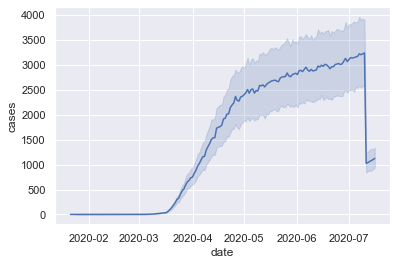

In [1023]:
ax = sns.lineplot(data=usg, x="date", y="cases")

#axes limit
#ax.set(xlim=(10, 1000000))
#ax.set(ylim=(0, 3.5))

#scale
#ax.set(xscale='log')

plt.show()

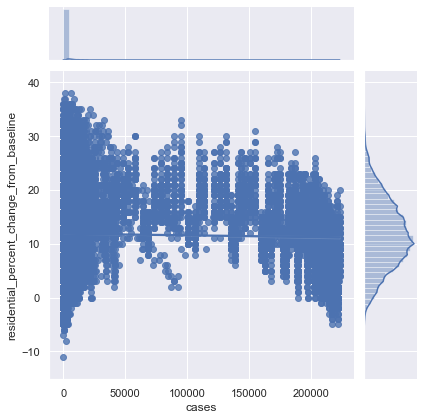

In [1024]:
g = sns.jointplot(x='cases', y='residential_percent_change_from_baseline', data=usg,
              kind="reg", dropna=True);

In [1027]:
usg.sub_region_2.unique()

array([nan, 'Maricopa County', 'Los Angeles County', ..., 'Sutton County',
       'Wheeler County', 'Martinsville'], dtype=object)

In [1029]:
usg[usg['sub_region_2'] == 'Bronx County']

,date,county,state,fips,cases,deaths,iso_code,continent,location,sub_region_1,sub_region_2,iso_3166_2_code,retail_and_recreation_percent_change_from_baseline,grocery_and_pharmacy_percent_change_from_baseline,parks_percent_change_from_baseline,transit_stations_percent_change_from_baseline,workplaces_percent_change_from_baseline,residential_percent_change_from_baseline
569070,2020-02-15,NaN,NaN,36005.0,NaN,NaN,US,North America,United States,New York,Bronx County,NaN,0.0,-8.0,-5.0,-3.0,0.0,1.0
569071,2020-02-16,NaN,NaN,36005.0,NaN,NaN,US,North America,United States,New York,Bronx County,NaN,-1.0,-4.0,5.0,-2.0,-2.0,0.0
569072,2020-02-17,NaN,NaN,36005.0,NaN,NaN,US,North America,United States,New York,Bronx County,NaN,3.0,-8.0,-11.0,-22.0,-38.0,10.0
569073,2020-02-18,NaN,NaN,36005.0,NaN,NaN,US,North America,United States,New York,Bronx County,NaN,-2.0,-6.0,-11.0,-7.0,-10.0,3.0
569074,2020-02-19,NaN,NaN,36005.0,NaN,NaN,US,North America,United States,New York,Bronx County,NaN,2.0,-6.0,0.0,-6.0,-9.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
569212,2020-07-06,NaN,NaN,36005.0,NaN,NaN,US,North America,United States,New York,Bronx County,NaN,-22.0,-12.0,-18.0,-37.0,-43.0,13.0
569213,2020-07-07,NaN,NaN,36005.0,NaN,NaN,US,North America,United States,New York,Bronx County,NaN,-14.0,4.0,0.0,-33.0,-43.0,13.0
569214,2020-07-08,NaN,NaN,36005.0,NaN,NaN,US,North America,United States,New York,Bronx County,NaN,-17.0,-4.0,-7.0,-35.0,-42.0,13.0
569215,2020-07-09,NaN,NaN,36005.0,NaN,NaN,US,North America,United States,New York,Bronx County,NaN,-12.0,4.0,19.0,-32.0,-42.0,12.0


/Users/catalina/opt/anaconda3/envs/corona/lib/python3.8/site-packages/numpy/lib/histograms.py:908: RuntimeWarning:

invalid value encountered in true_divide



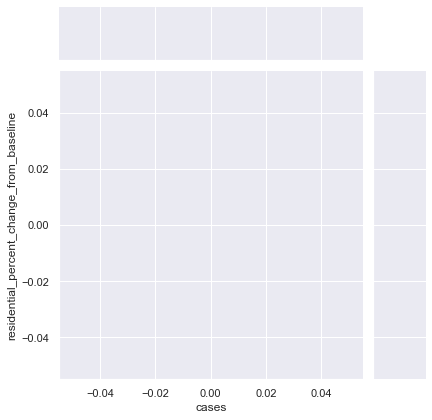

In [1016]:
i = 'New York County'
temp = usg[usg.sub_region_2.isin([i])]

g = sns.jointplot(x='cases', y='residential_percent_change_from_baseline', data=temp,
              kind="reg", dropna=True);

In [ ]:
f, ax = plt.subplots(figsize=(16, 8))
plt.plot('StringencyIndex', data=gov_index_means, marker='', color='tab:blue', linewidth=2, label='Stringency Index')
plt.title('Stringency Index vs Google index') 
plt.legend(loc=2)

#Total cases plot
ax2 = ax.twinx()
plt.plot('residential_percent_change_from_baseline', data=gf_mean, marker='', color='black', linewidth=2, label='residential_percent_change_from_baseline')
#ax2.set(yscale='log')
plt.legend(loc=1)

        
ax.set(ylim=(0, 100))
ax2.set(ylim=(0, 100))
#ax.set(xscale='log')
#ax.set(yscale='log')
#axplt.show()